# **Libraries**

In [ ]:
%%capture

!pip install shap
!pip install optuna
!pip install cmaes

In [ ]:
seed = 7

# Basics
import pandas as pd
import numpy as np

# Graphs
import matplotlib.pyplot as plt

# Preprocessing
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix

# Models
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Optuna
import optuna
from optuna.samplers import RandomSampler, TPESampler, CmaEsSampler
from optuna.visualization import plot_optimization_history

The 'functions_pred_cruzada' file contains the functions that will be used to select, preprocess, train and validate the machine learning models.

In [ ]:
!gdown 1uVoArwRTJmvbyFLyFniwFvWGHMfiNIWO --quiet

from functions_pred_cruzada import *

# **Data**

In [ ]:
# Downloading the file containing cancer types
!gdown 1-5P81yj29-MTfd3qBpCPG3xcYjVdsRU1 --quiet # Digestive system cancer types

# Reading the dataset
df = pd.read_csv('sist_dig.csv')  # Load the CSV file into a DataFrame
print(df.shape)  # Display the shape (number of rows and columns) of the dataset
df.head(3)  # Show the first three rows of the DataFrame

(140312, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,55,1,3518701,9,2,C049,C04,IVA,C,0,...,7,3518701,1,3.0,1,0,1,0,0,0
1,62,1,3518701,9,1,C060,C06,IVB,C,0,...,7,3518701,1,2.0,1,0,1,0,0,0
2,54,1,3518701,2,1,C019,C01,IVC,E,0,...,7,3518701,1,2.0,1,0,1,0,0,0




```
# List of cancer codes for different anatomical regions
todos = ['C00', 'C01', 'C02', 'C03', 'C04', 'C05', 'C06',  # Oral Cavity
         'C10',                                            # Oropharynx
         'C15',                                            # Esophagus
         'C16',                                            # Stomach
         'C17',                                            # Small Intestine
         'C18', 'C19', 'C20',                              # Colorectal
         'C21']                                            # Anus
```



In [ ]:
# Data Preparation

# Oral Cavity
df_boca = df[df.TOPOGRUP.isin(['C00', 'C01', 'C02', 'C03', 'C04', 'C05', 'C06'])]  # Filter for breast cancer cases
df_boca = df_boca[~((df_boca.obito_geral == 0) & (df_boca.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Oropharynx
df_oro = df[df.TOPOGRUP.isin(['C10'])]  # Filter for oropharynx cancer cases
df_oro = df_oro[~((df_oro.obito_geral == 0) & (df_oro.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Esophagus
df_eso = df[df.TOPOGRUP.isin(['C15'])]  # Filter for esophagus cancer cases
df_eso = df_eso[~((df_eso.obito_geral == 0) & (df_eso.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Stomach
df_esto = df[df.TOPOGRUP.isin(['C16'])]  # Filter for stomach cancer cases
df_esto = df_esto[~((df_esto.obito_geral == 0) & (df_esto.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Small Intestine
df_delg = df[df.TOPOGRUP.isin(['C17'])]  # Filter for small intestine cancer cases
df_delg = df_delg[~((df_delg.obito_geral == 0) & (df_delg.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Colorectal
df_colo = df[df.TOPOGRUP.isin(['C18', 'C19', 'C20'])]  # Filter for colorectal cancer cases
df_colo = df_colo[~((df_colo.obito_geral == 0) & (df_colo.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Anus
df_anus = df[df.TOPOGRUP.isin(['C21'])]  # Filter for anus cancer cases
df_anus = df_anus[~((df_anus.obito_geral == 0) & (df_anus.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Display the shape (number of rows and columns) for each dataset
df_boca.shape, df_oro.shape, df_eso.shape, df_esto.shape, df_delg.shape, df_colo.shape, df_anus.shape

((23935, 32),
 (4922, 32),
 (13961, 32),
 (27770, 32),
 (1594, 32),
 (56111, 32),
 (2276, 32))

# **Oral Cavity**

In [ ]:
# Missing values
df_boca.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the oral cavity cancer dataset
corr_matrix = df_boca.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3        1.000000
sobrevida_ano5        0.753214
obito_geral           0.634715
sobrevida_ano1        0.573880
CIRURGIA              0.376919
TRATCONS              0.193180
DIAGTRAT              0.193034
NENHUM                0.189452
QUIMIO                0.175246
RADIO                 0.104700
SEXO                  0.087669
ESCOLARI_preench      0.063228
CONSDIAG              0.057055
IDADE                 0.050811
IBGEATEN              0.050273
CATEATEND             0.049986
RRAS                  0.025647
OUTROS                0.022083
IBGE_idem_IBGEATEN    0.020388
ANODIAG               0.016828
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_boca.sobrevida_ano3.value_counts()

sobrevida_ano3
0    14136
1     9799
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_boca,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (17951, 23), X_test = (5984, 23)
y_train = (17951,), y_test = (5984,)


In [ ]:
# Training dataset for Oral Cavity Cancer

# Create a DataFrame for training data with selected features
boca_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Boca' for Oral Cavity Cancer)
boca_treino['TOPOGRUP'] = 'Boca'

# Add the target variable (survival after 3 years) to the training dataset
boca_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Oral Cavity Cancer

# Create a DataFrame for testing data with selected features
boca_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Boca' for Oral Cavity Cancer)
boca_teste['TOPOGRUP'] = 'Boca'

# Add the target variable (survival after 3 years) to the testing dataset
boca_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

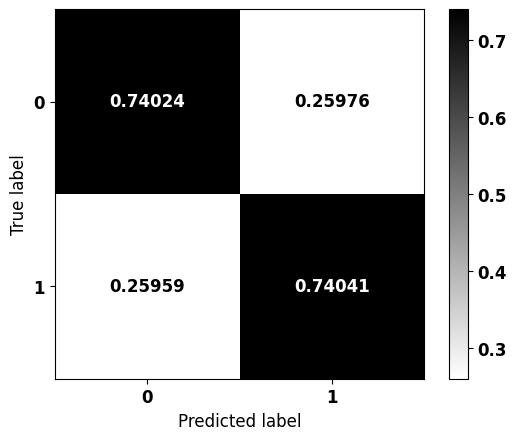


              precision    recall  f1-score   support

           0    0.80443   0.74024   0.77100      3534
           1    0.66398   0.74041   0.70012      2450

    accuracy                        0.74031      5984
   macro avg    0.73421   0.74032   0.73556      5984
weighted avg    0.74693   0.74031   0.74198      5984



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=3,            # Set maximum tree depth to 3
                    scale_pos_weight=1.403, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

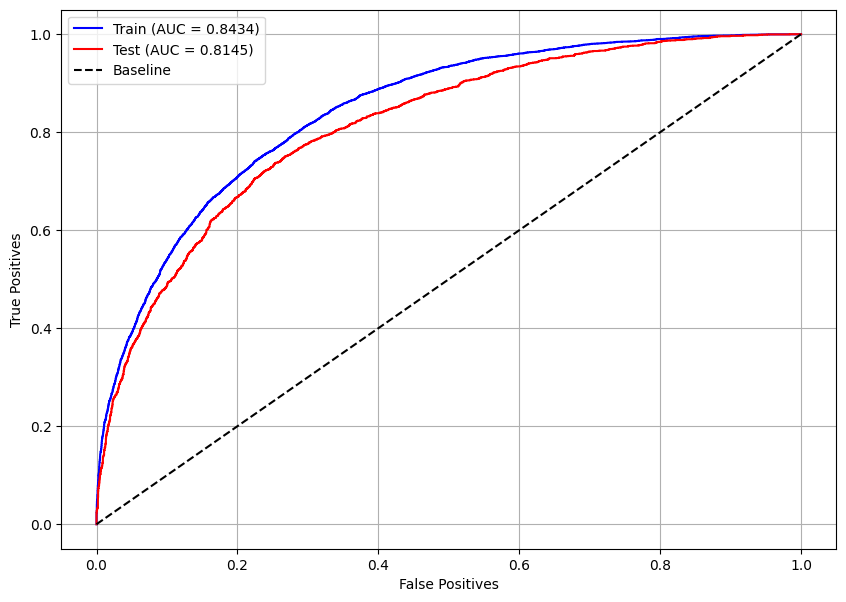

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

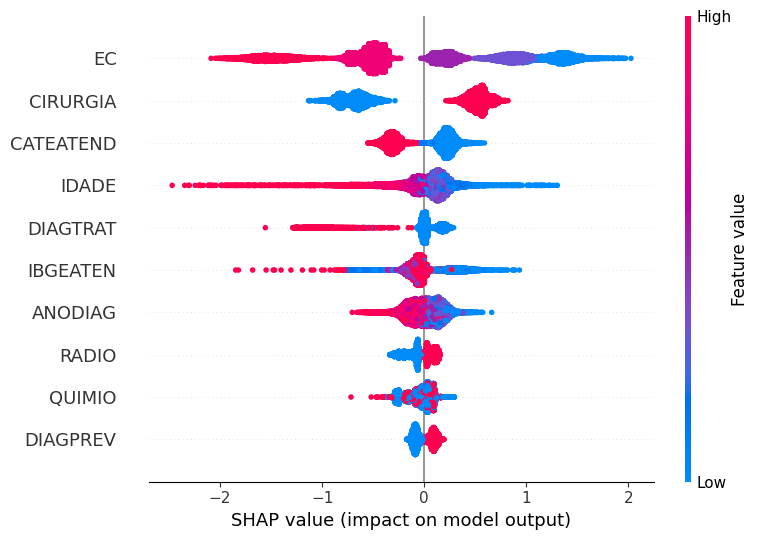

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 4)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 115,
 'max_depth': 4,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 3,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1.425, 1.44, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

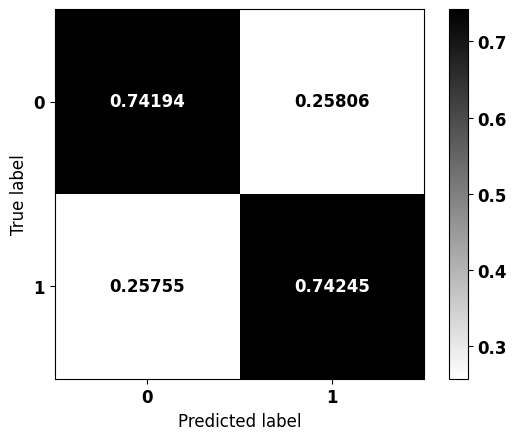


              precision    recall  f1-score   support

           0    0.80603   0.74194   0.77265      3534
           1    0.66606   0.74245   0.70218      2450

    accuracy                        0.74215      5984
   macro avg    0.73604   0.74219   0.73742      5984
weighted avg    0.74872   0.74215   0.74380      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.4307  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

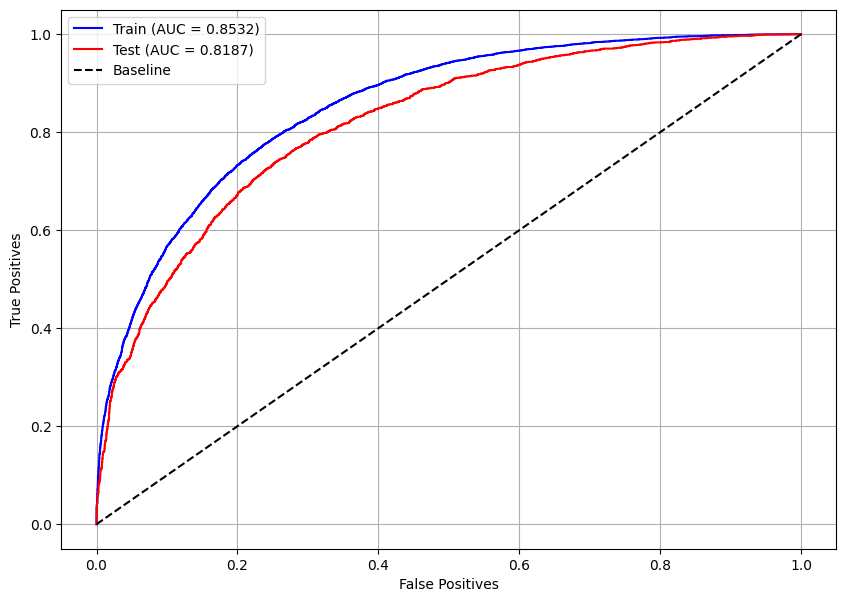

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 99,
 'max_depth': 4,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.3,
 'min_child_weight': 3,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.45, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

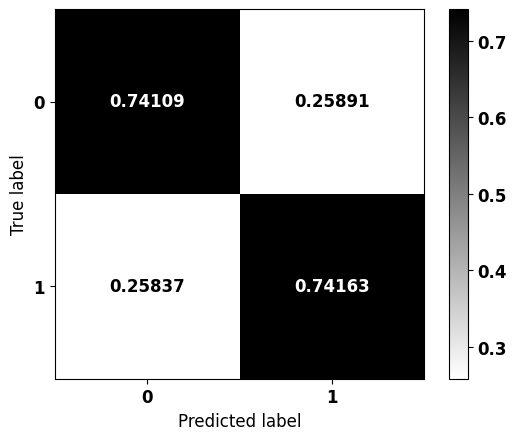


              precision    recall  f1-score   support

           0    0.80535   0.74109   0.77188      3534
           1    0.66508   0.74163   0.70127      2450

    accuracy                        0.74131      5984
   macro avg    0.73522   0.74136   0.73658      5984
weighted avg    0.74792   0.74131   0.74297      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.4307  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

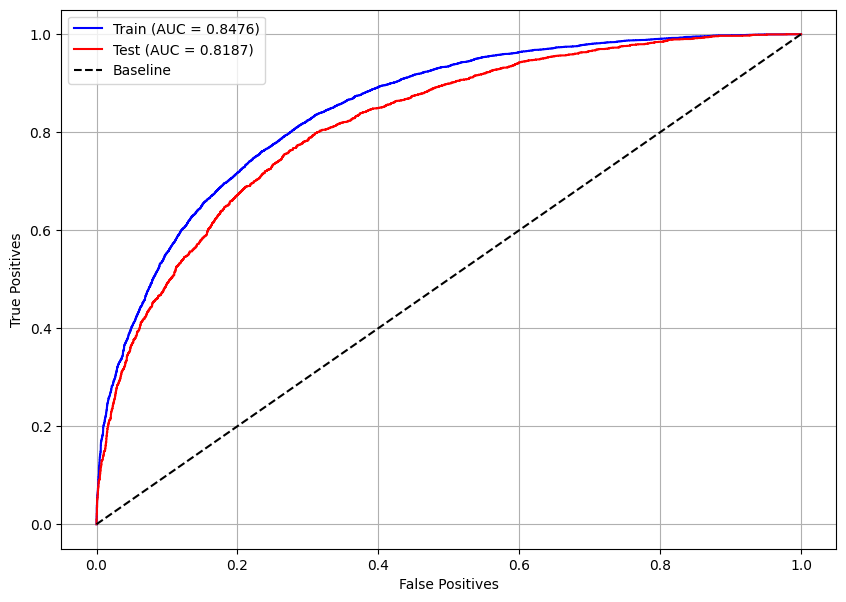

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 92,
 'max_depth': 4,
 'learning_rate': 0.15,
 'gamma': 0.1,
 'min_child_weight': 4,
 'colsample_bytree': 0.6}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.44, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

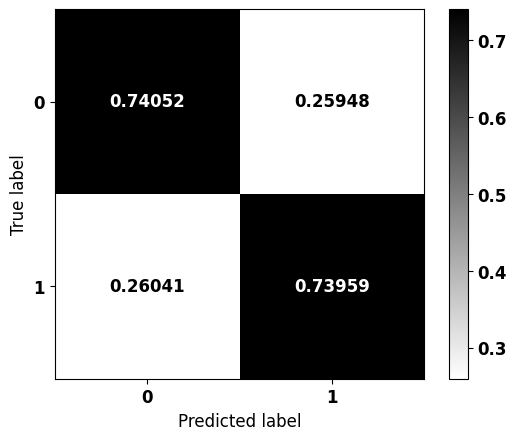


              precision    recall  f1-score   support

           0    0.80399   0.74052   0.77095      3534
           1    0.66398   0.73959   0.69975      2450

    accuracy                        0.74014      5984
   macro avg    0.73399   0.74006   0.73535      5984
weighted avg    0.74667   0.74014   0.74180      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.427  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

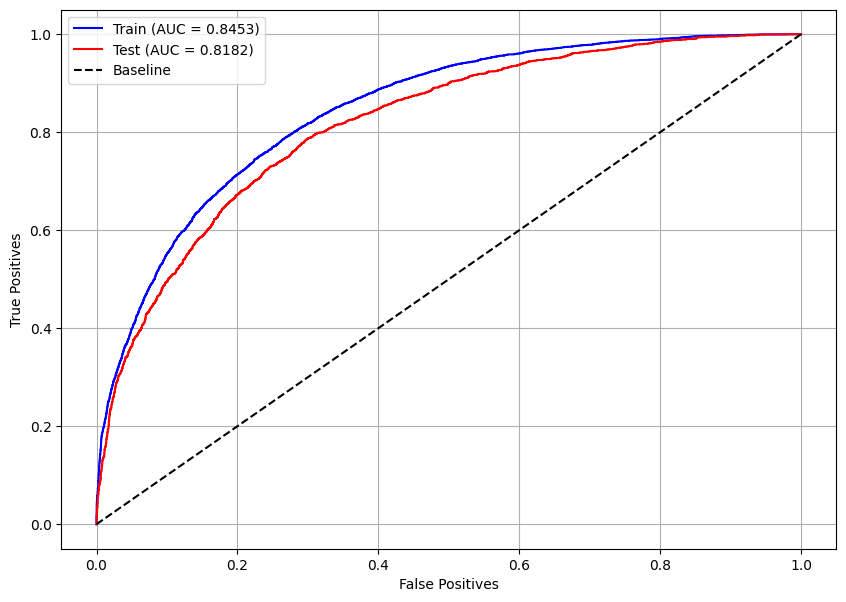

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=115, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


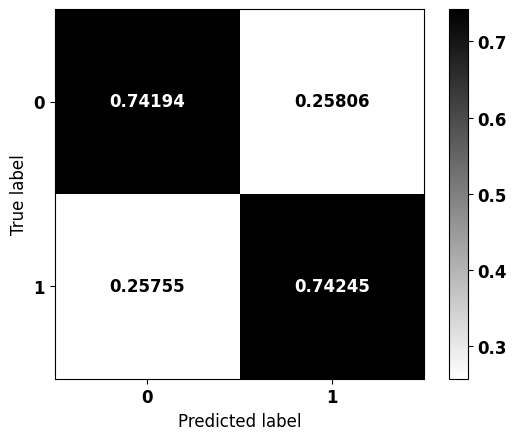


              precision    recall  f1-score   support

           0    0.80603   0.74194   0.77265      3534
           1    0.66606   0.74245   0.70218      2450

    accuracy                        0.74215      5984
   macro avg    0.73604   0.74219   0.73742      5984
weighted avg    0.74872   0.74215   0.74380      5984



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

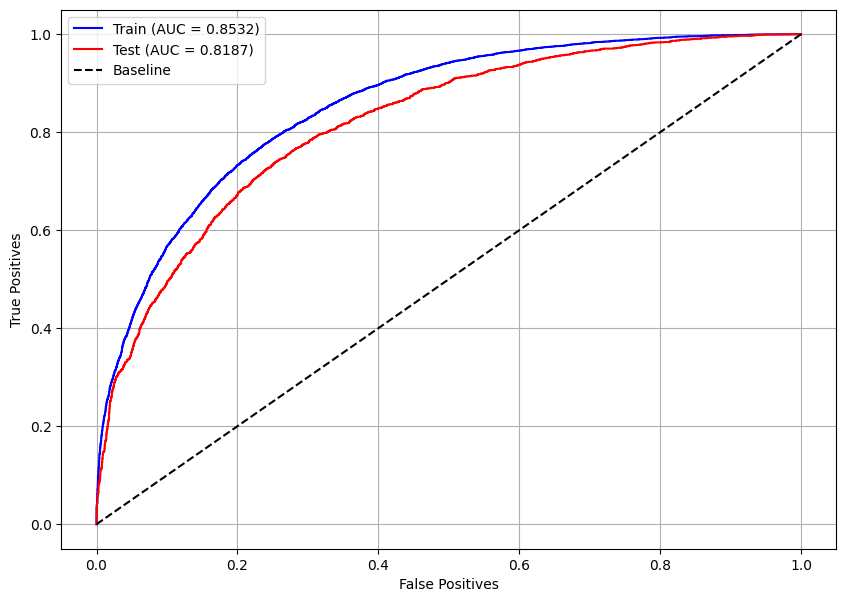

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

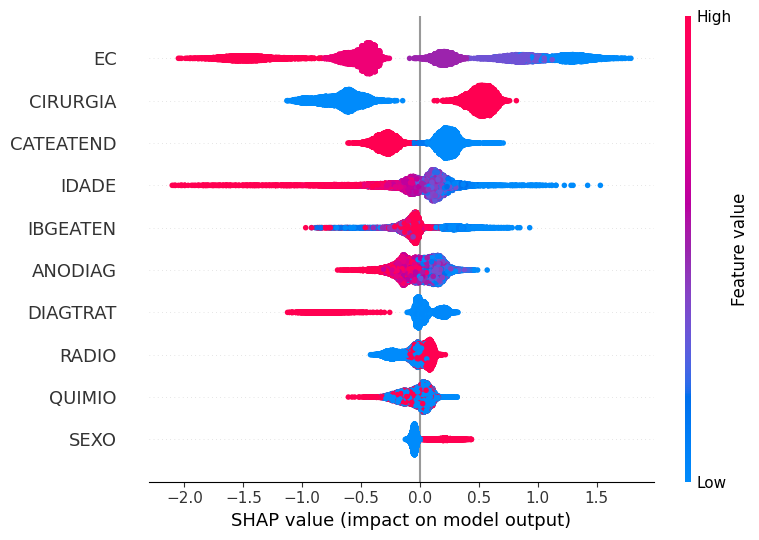

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

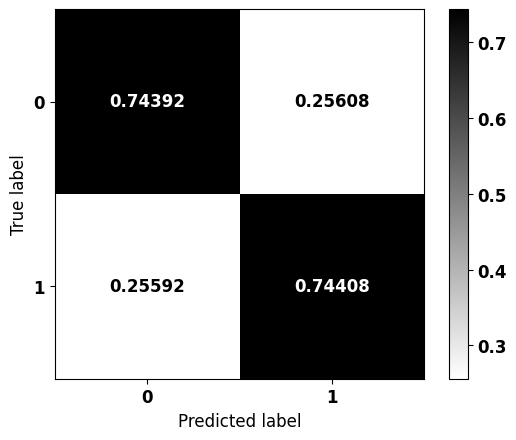


              precision    recall  f1-score   support

           0    0.80743   0.74392   0.77437      3534
           1    0.66826   0.74408   0.70413      2450

    accuracy                        0.74398      5984
   macro avg    0.73784   0.74400   0.73925      5984
weighted avg    0.75045   0.74398   0.74562      5984



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=5,                  # Set maximum tree depth to 10
                      class_weight={0:1, 1:1.41},   # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

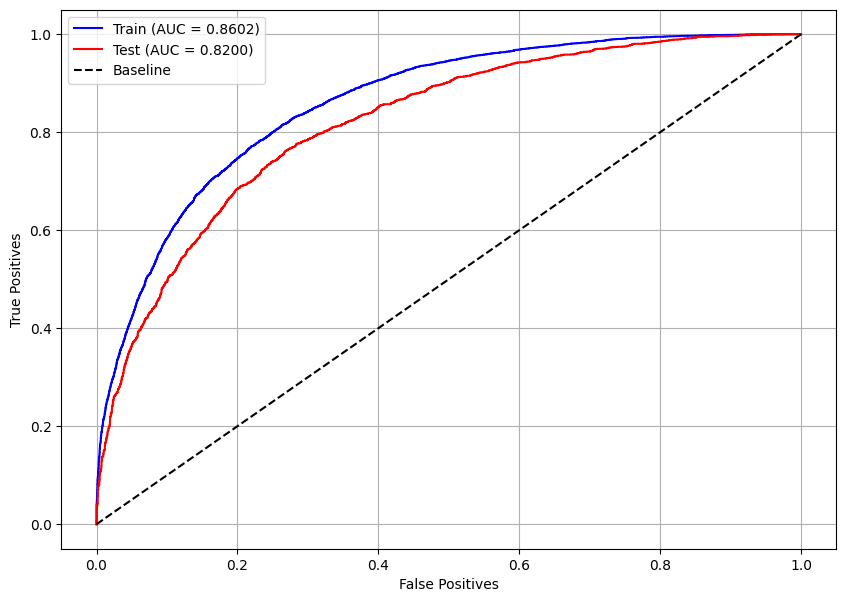

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

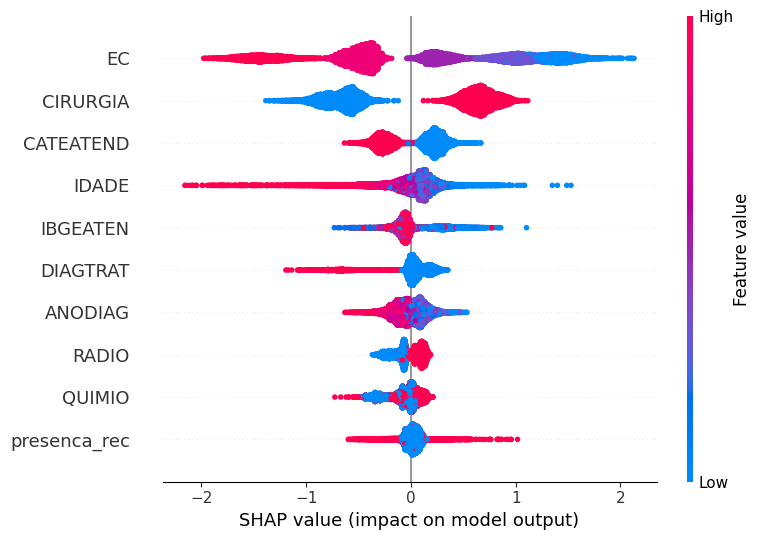

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 5)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 56,
 'max_depth': 5,
 'learning_rate': 0.15000000000000002,
 'min_child_weight': 5,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.41, 1.43, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

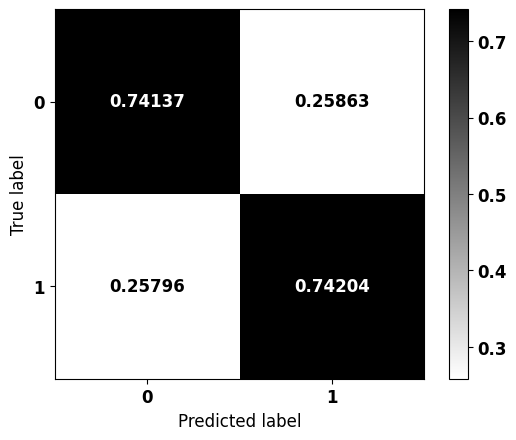


              precision    recall  f1-score   support

           0    0.80566   0.74137   0.77218      3534
           1    0.66545   0.74204   0.70166      2450

    accuracy                        0.74164      5984
   macro avg    0.73555   0.74171   0.73692      5984
weighted avg    0.74825   0.74164   0.74331      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.4267}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

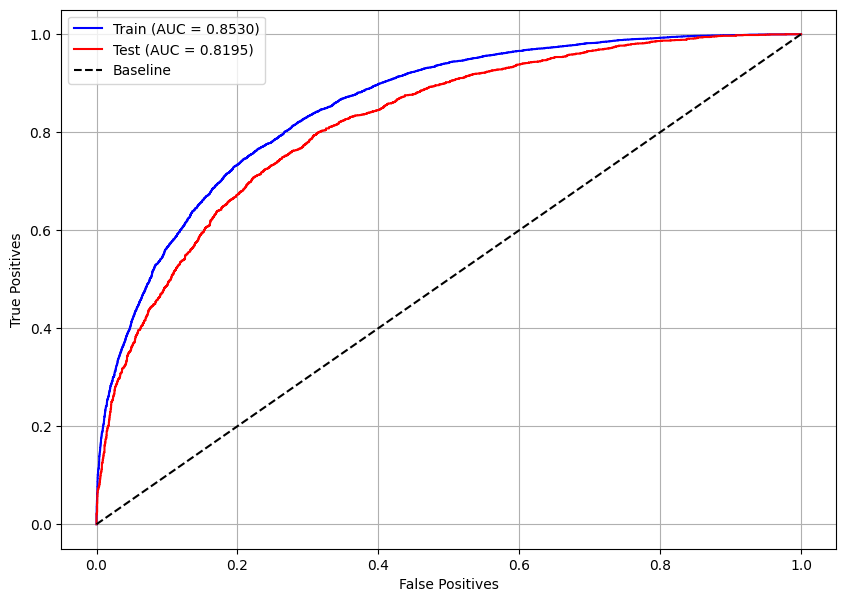

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 137,
 'max_depth': 5,
 'learning_rate': 0.07,
 'min_child_weight': 3,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.44, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

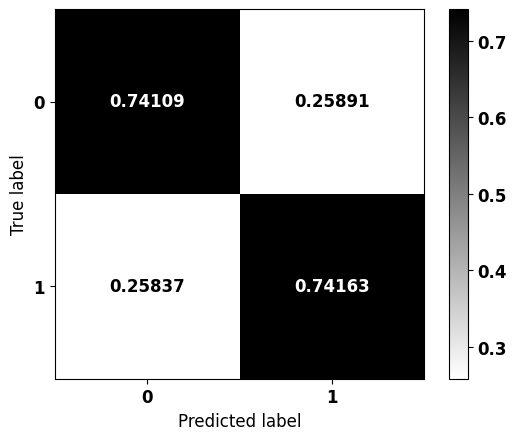


              precision    recall  f1-score   support

           0    0.80535   0.74109   0.77188      3534
           1    0.66508   0.74163   0.70127      2450

    accuracy                        0.74131      5984
   macro avg    0.73522   0.74136   0.73658      5984
weighted avg    0.74792   0.74131   0.74297      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.431}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

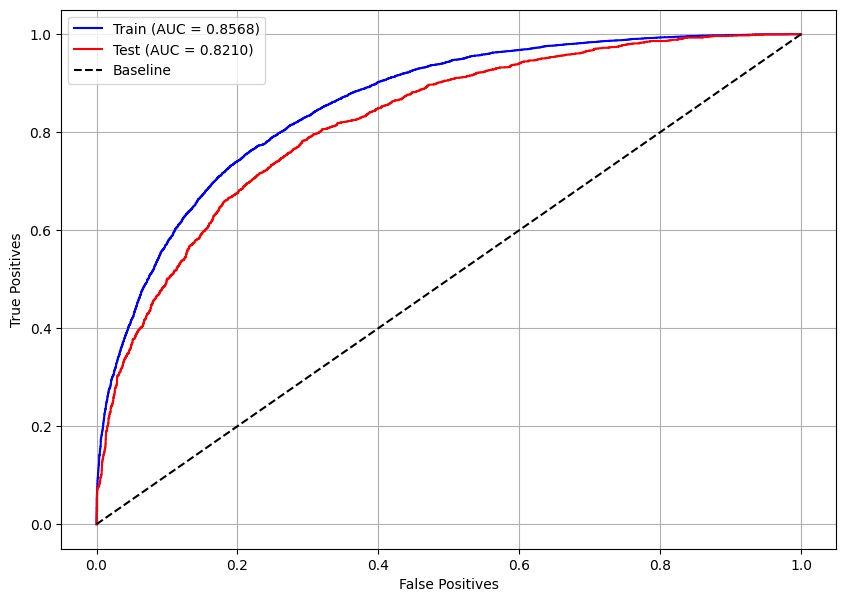

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 68,
 'max_depth': 5,
 'learning_rate': 0.16,
 'min_child_weight': 5,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.41, 1.43, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

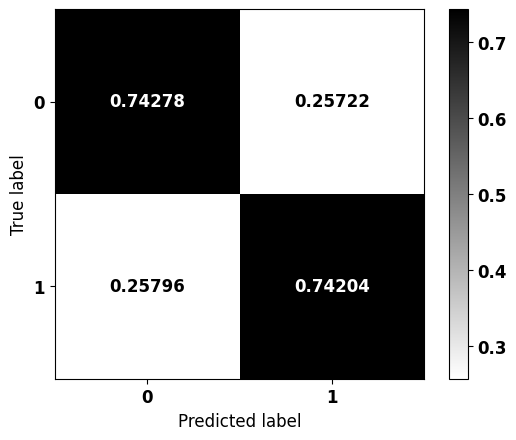


              precision    recall  f1-score   support

           0    0.80596   0.74278   0.77308      3534
           1    0.66667   0.74204   0.70234      2450

    accuracy                        0.74248      5984
   macro avg    0.73631   0.74241   0.73771      5984
weighted avg    0.74893   0.74248   0.74412      5984



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.4141}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

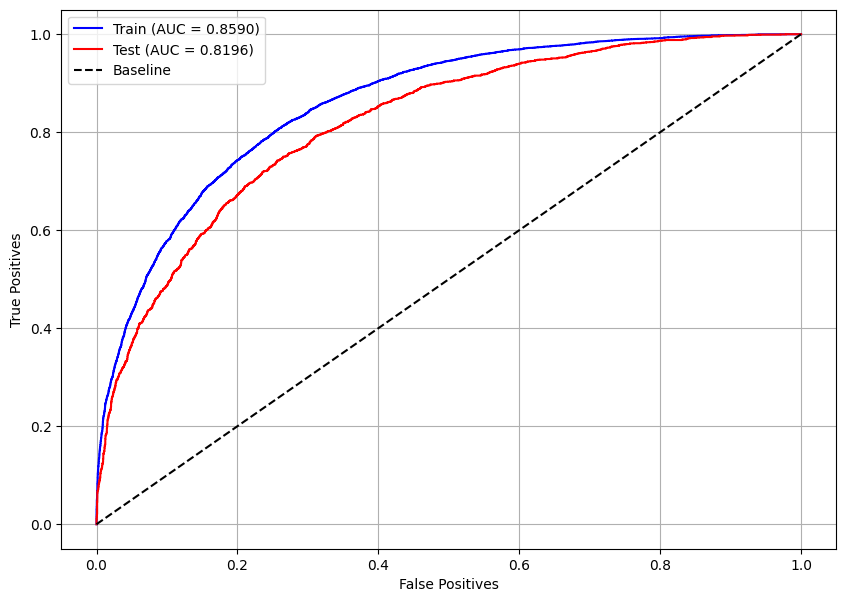

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 1.4141}, colsample_bytree=0.5,
               learning_rate=0.16, max_depth=5, min_child_weight=5,
               n_estimators=68, random_state=7, verbose=-1)


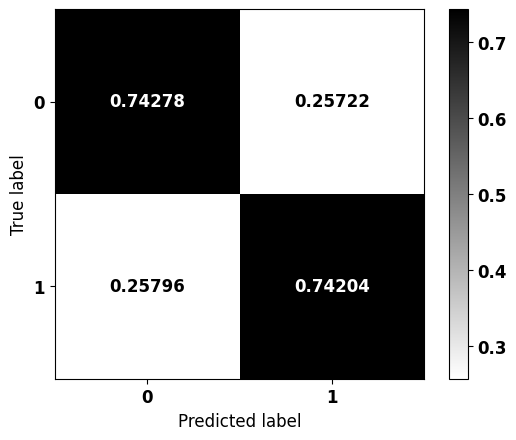


              precision    recall  f1-score   support

           0    0.80596   0.74278   0.77308      3534
           1    0.66667   0.74204   0.70234      2450

    accuracy                        0.74248      5984
   macro avg    0.73631   0.74241   0.73771      5984
weighted avg    0.74893   0.74248   0.74412      5984



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

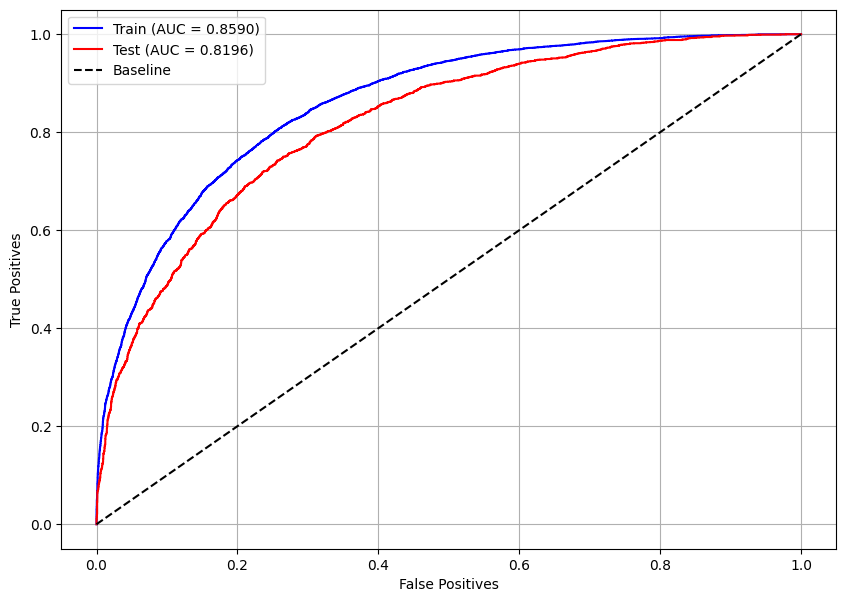

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


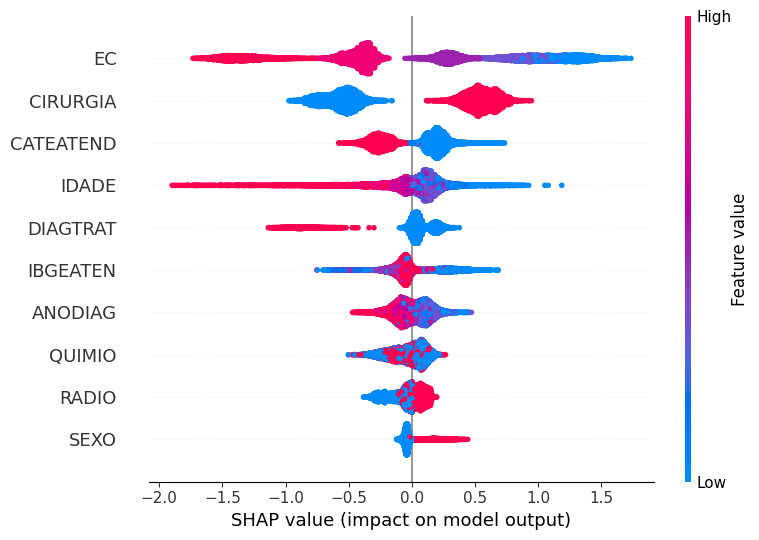

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7403, Optuna = 0.7421

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7440, Optuna = 0.7425

Modelo inicial venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 1.41}, max_depth=5, random_state=7,
               verbose=-1)

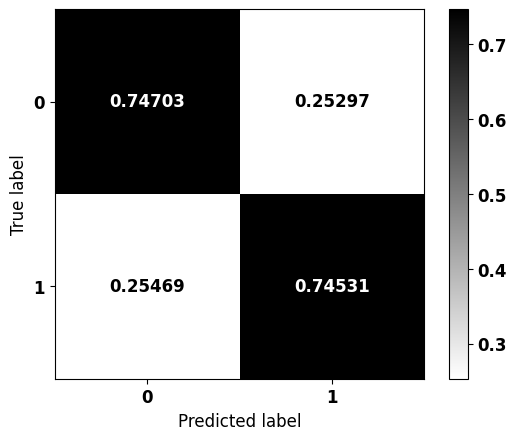


              precision    recall  f1-score   support

           0    0.80882   0.74703   0.77670      3534
           1    0.67132   0.74531   0.70638      2450

    accuracy                        0.74632      5984
   macro avg    0.74007   0.74617   0.74154      5984
weighted avg    0.75253   0.74632   0.74791      5984



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

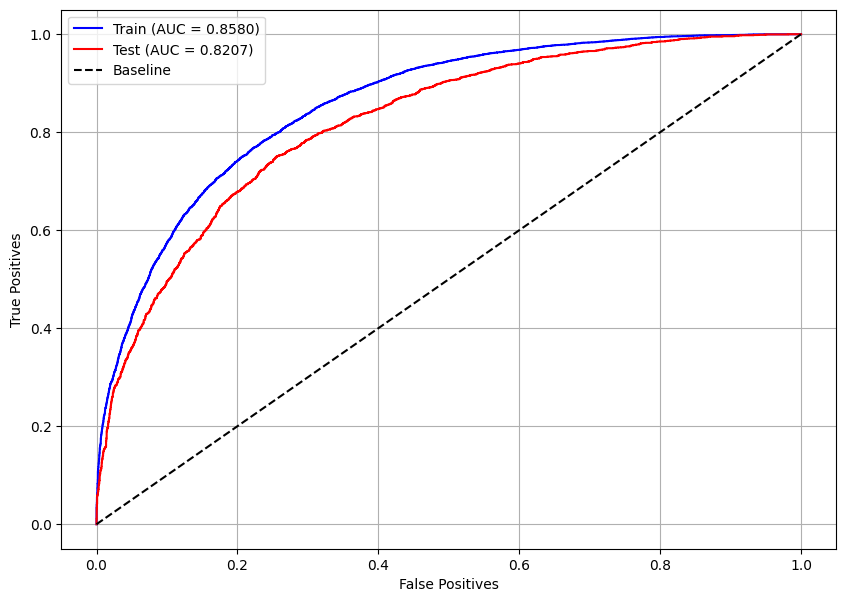

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 1.41}, max_depth=5, random_state=7,
               verbose=-1)


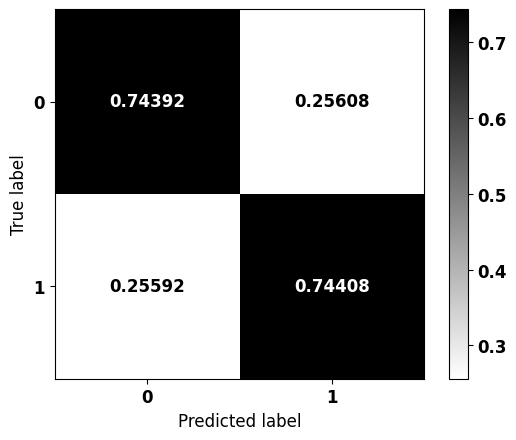


              precision    recall  f1-score   support

           0    0.80743   0.74392   0.77437      3534
           1    0.66826   0.74408   0.70413      2450

    accuracy                        0.74398      5984
   macro avg    0.73784   0.74400   0.73925      5984
weighted avg    0.75045   0.74398   0.74562      5984



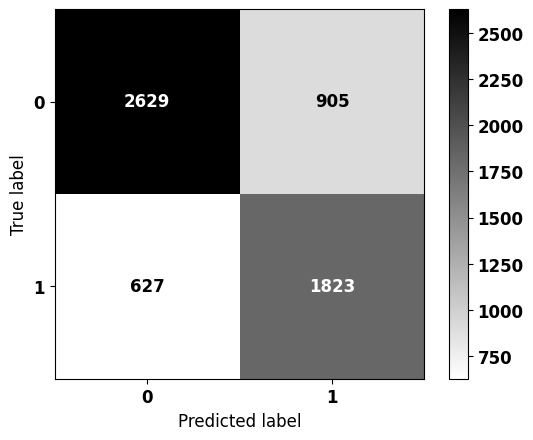


              precision    recall  f1-score   support

           0    0.80743   0.74392   0.77437      3534
           1    0.66826   0.74408   0.70413      2450

    accuracy                        0.74398      5984
   macro avg    0.73784   0.74400   0.73925      5984
weighted avg    0.75045   0.74398   0.74562      5984



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

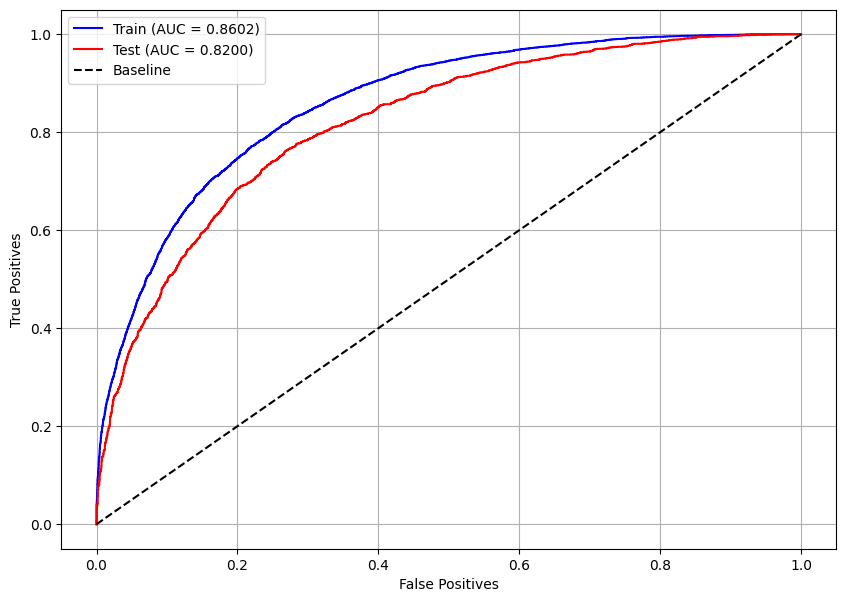

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


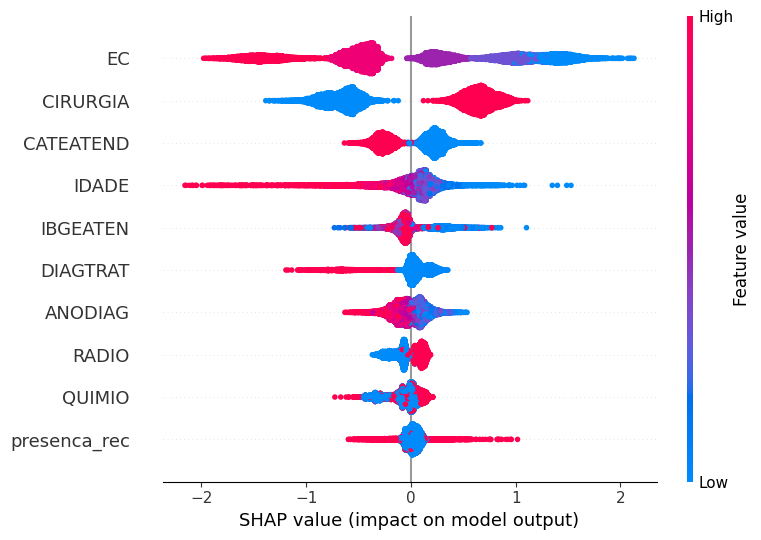

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


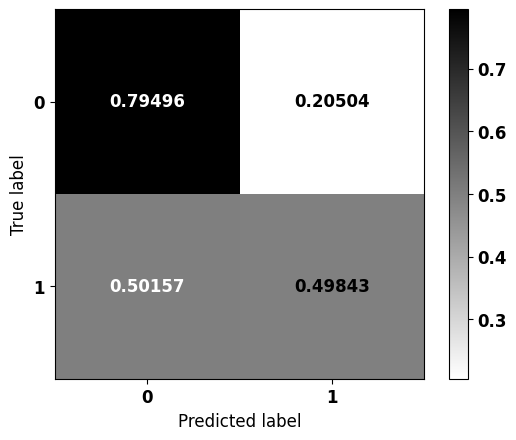


              precision    recall  f1-score   support

           0    0.81921   0.79496   0.80690       912
           1    0.45954   0.49843   0.47820       319

    accuracy                        0.71812      1231
   macro avg    0.63937   0.64669   0.64255      1231
weighted avg    0.72600   0.71812   0.72172      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


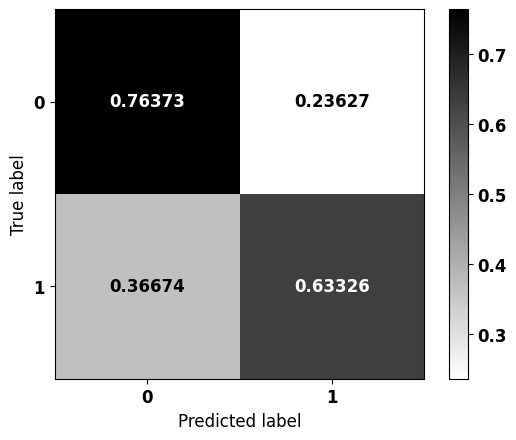


              precision    recall  f1-score   support

           0    0.93065   0.76373   0.83897      3022
           1    0.29377   0.63326   0.40135       469

    accuracy                        0.74620      3491
   macro avg    0.61221   0.69850   0.62016      3491
weighted avg    0.84508   0.74620   0.78018      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


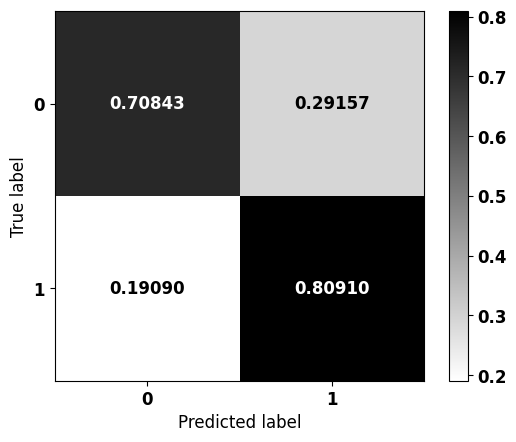


              precision    recall  f1-score   support

           0    0.90838   0.70843   0.79604      5052
           1    0.50949   0.80910   0.62526      1891

    accuracy                        0.73585      6943
   macro avg    0.70893   0.75876   0.71065      6943
weighted avg    0.79974   0.73585   0.74953      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


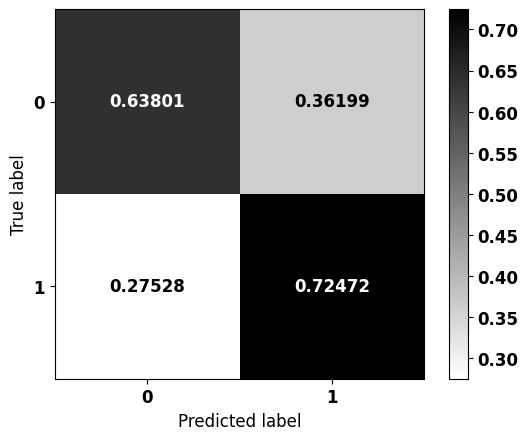


              precision    recall  f1-score   support

           0    0.74211   0.63801   0.68613       221
           1    0.61722   0.72472   0.66667       178

    accuracy                        0.67669       399
   macro avg    0.67967   0.68136   0.67640       399
weighted avg    0.68639   0.67669   0.67745       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


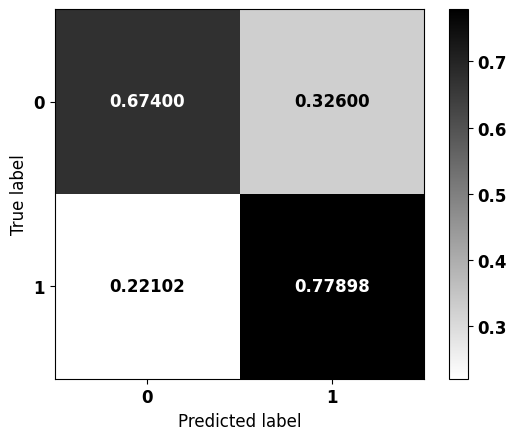


              precision    recall  f1-score   support

           0    0.71154   0.67400   0.69226      6273
           1    0.74709   0.77898   0.76270      7755

    accuracy                        0.73204     14028
   macro avg    0.72932   0.72649   0.72748     14028
weighted avg    0.73120   0.73204   0.73120     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


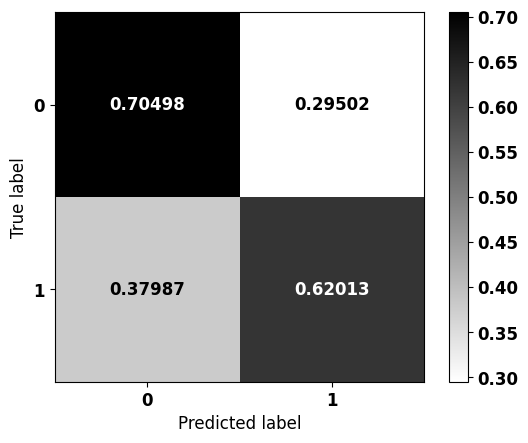


              precision    recall  f1-score   support

           0    0.61130   0.70498   0.65480       261
           1    0.71269   0.62013   0.66319       308

    accuracy                        0.65905       569
   macro avg    0.66199   0.66256   0.65900       569
weighted avg    0.66618   0.65905   0.65935       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Oropharynx**

In [ ]:
# Missing values
df_oro.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the oropharynx cancer dataset
corr_matrix = df_oro.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3      1.000000
sobrevida_ano5      0.733542
obito_geral         0.675632
sobrevida_ano1      0.542641
CIRURGIA            0.205743
TRATCONS            0.191685
DIAGTRAT            0.190997
NENHUM              0.182887
QUIMIO              0.091278
SEXO                0.081080
ESCOLARI_preench    0.077043
RADIO               0.073058
presenca_rec        0.067552
HABILIT2            0.053539
CATEATEND           0.050091
DIAGPREV            0.044714
RRAS                0.043218
IDADE               0.040770
IBGEATEN            0.037583
OUTROS              0.033392
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_oro.sobrevida_ano3.value_counts()

sobrevida_ano3
0    3646
1    1276
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_oro,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (3691, 23), X_test = (1231, 23)
y_train = (3691,), y_test = (1231,)


In [ ]:
# Training dataset for Oropharynx Cancer

# Create a DataFrame for training data with selected features
oro_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Orofaringe' for Oropharynx Cancer)
oro_treino['TOPOGRUP'] = 'Orofaringe'

# Add the target variable (survival after 3 years) to the training dataset
oro_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Oropharynx Cancer

# Create a DataFrame for testing data with selected features
oro_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Orofaringe' for Oropharynx Cancer)
oro_teste['TOPOGRUP'] = 'Orofaringe'

# Add the target variable (survival after 3 years) to the testing dataset
oro_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

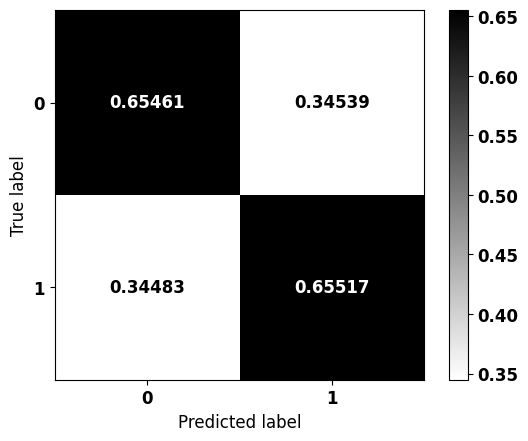


              precision    recall  f1-score   support

           0    0.84441   0.65461   0.73749       912
           1    0.39885   0.65517   0.49585       319

    accuracy                        0.65475      1231
   macro avg    0.62163   0.65489   0.61667      1231
weighted avg    0.72895   0.65475   0.67487      1231



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=2,            # Set maximum tree depth to 4
                    scale_pos_weight=2.849, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

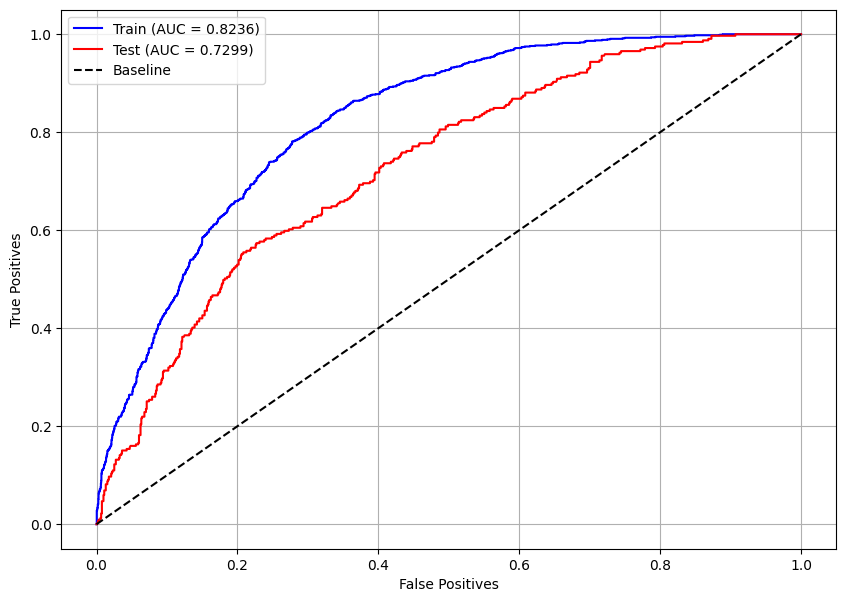

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

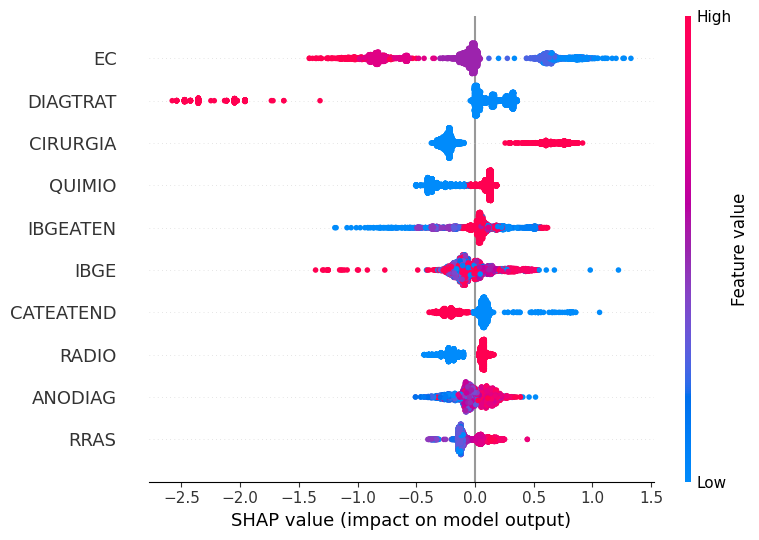

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 76,
 'max_depth': 3,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 4,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 3, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

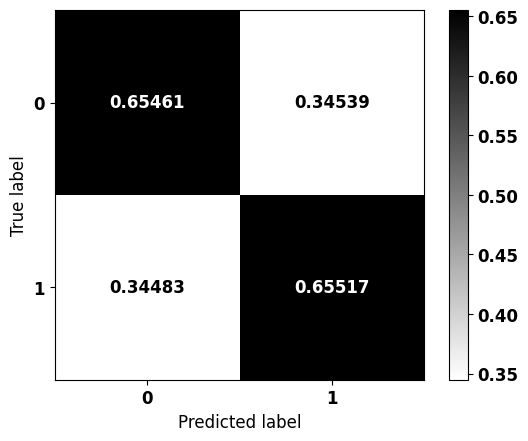


              precision    recall  f1-score   support

           0    0.84441   0.65461   0.73749       912
           1    0.39885   0.65517   0.49585       319

    accuracy                        0.65475      1231
   macro avg    0.62163   0.65489   0.61667      1231
weighted avg    0.72895   0.65475   0.67487      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.902  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

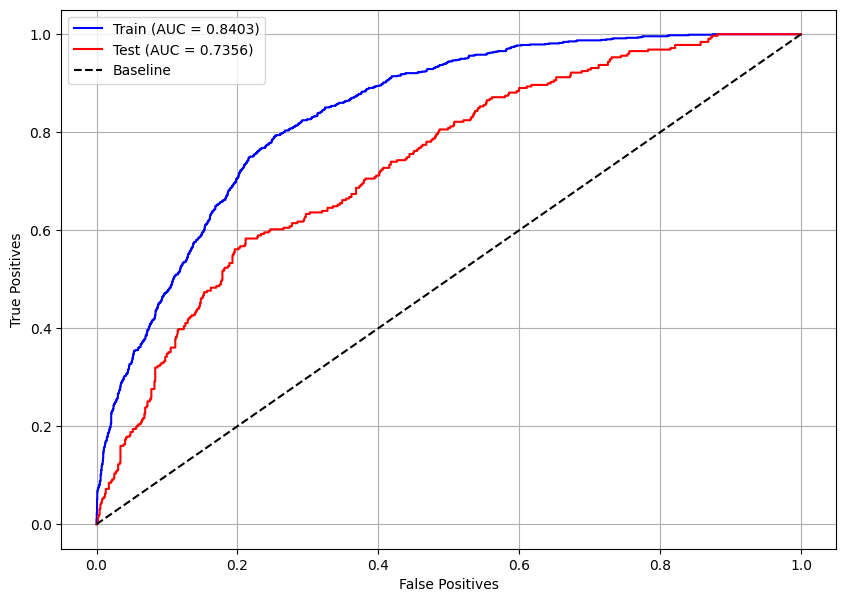

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 96,
 'max_depth': 3,
 'learning_rate': 0.2,
 'gamma': 0.0,
 'min_child_weight': 4,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 3, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

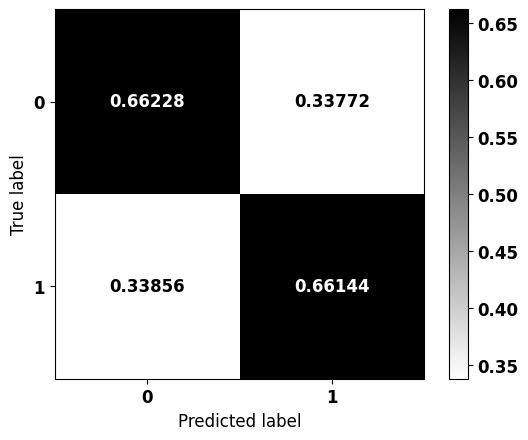


              precision    recall  f1-score   support

           0    0.84831   0.66228   0.74384       912
           1    0.40655   0.66144   0.50358       319

    accuracy                        0.66206      1231
   macro avg    0.62743   0.66186   0.62371      1231
weighted avg    0.73384   0.66206   0.68158      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.938  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

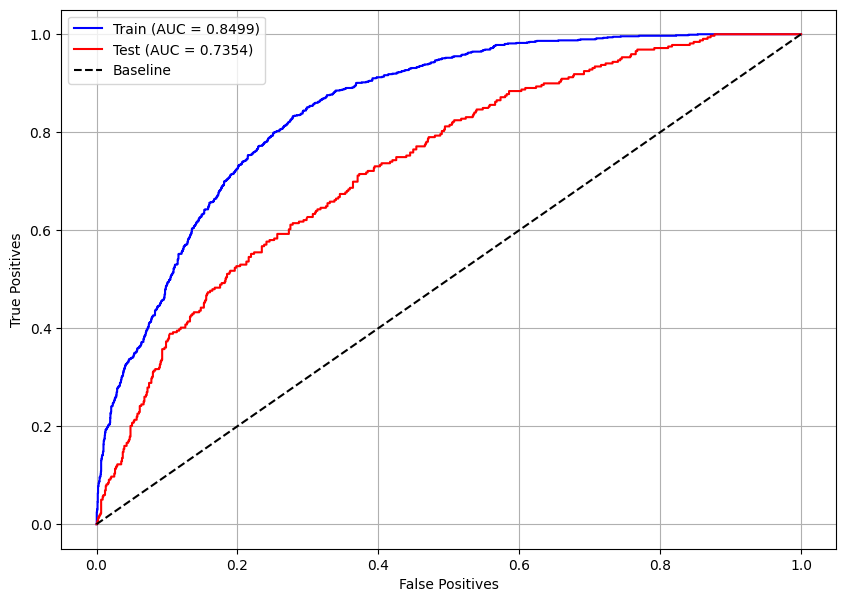

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 94,
 'max_depth': 3,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 6,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 3, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

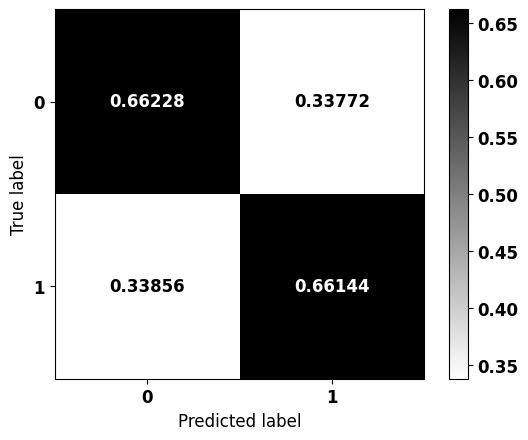


              precision    recall  f1-score   support

           0    0.84831   0.66228   0.74384       912
           1    0.40655   0.66144   0.50358       319

    accuracy                        0.66206      1231
   macro avg    0.62743   0.66186   0.62371      1231
weighted avg    0.73384   0.66206   0.68158      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.937  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

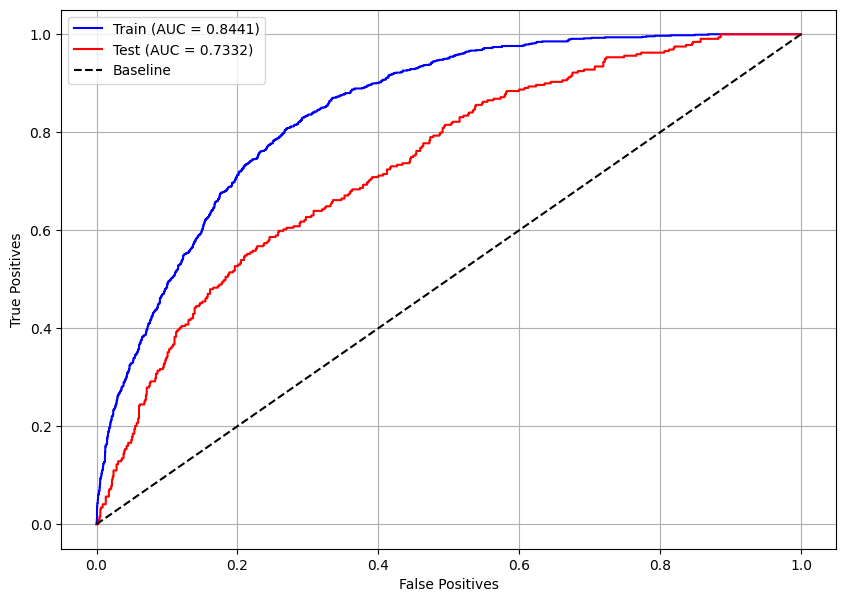

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=96, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


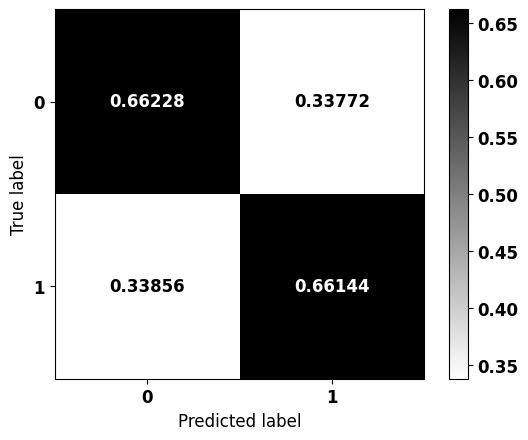


              precision    recall  f1-score   support

           0    0.84831   0.66228   0.74384       912
           1    0.40655   0.66144   0.50358       319

    accuracy                        0.66206      1231
   macro avg    0.62743   0.66186   0.62371      1231
weighted avg    0.73384   0.66206   0.68158      1231



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

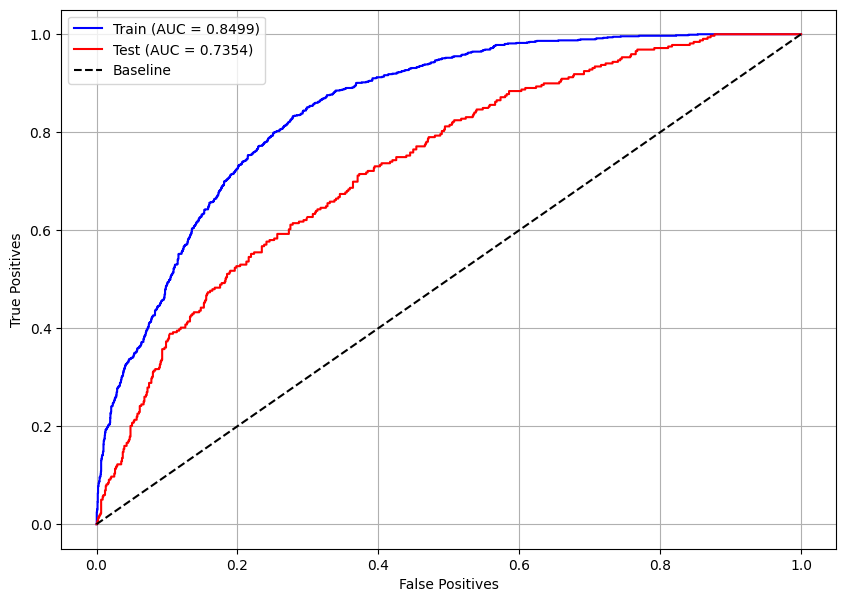

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

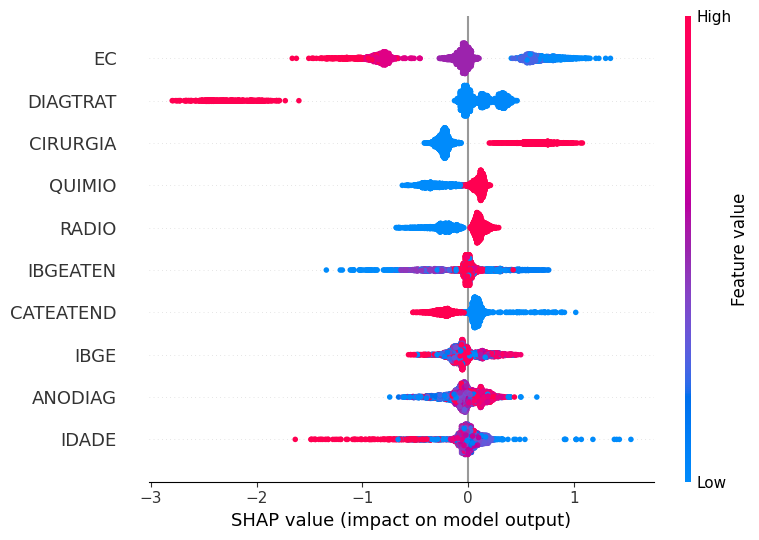

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

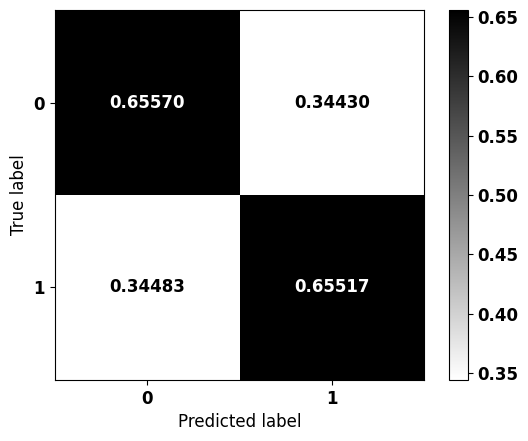


              precision    recall  f1-score   support

           0    0.84463   0.65570   0.73827       912
           1    0.39962   0.65517   0.49644       319

    accuracy                        0.65556      1231
   macro avg    0.62213   0.65544   0.61735      1231
weighted avg    0.72931   0.65556   0.67560      1231



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=2,                  # Set maximum tree depth to 10
                      class_weight={0:1, 1:2.662},  # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

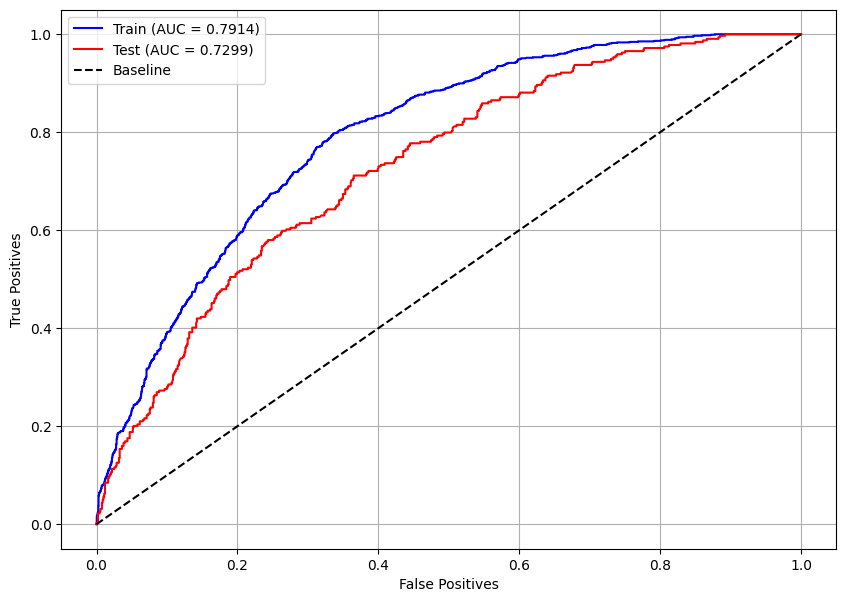

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


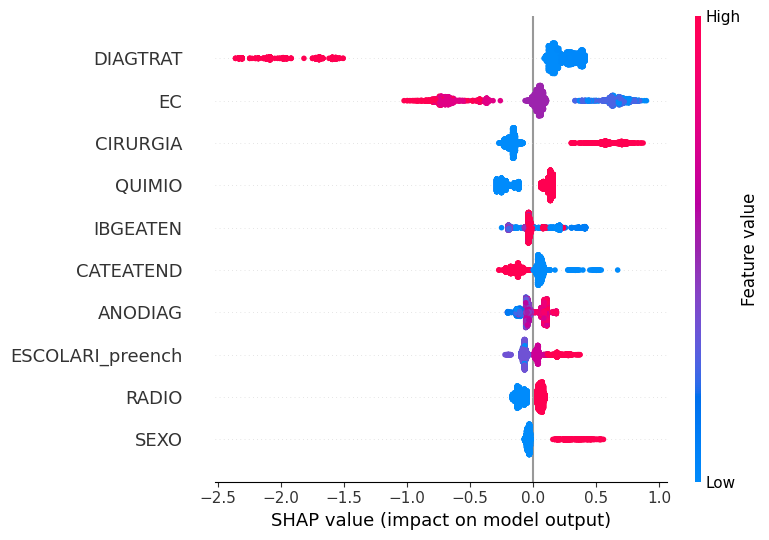

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 66,
 'max_depth': 2,
 'learning_rate': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 2.9, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

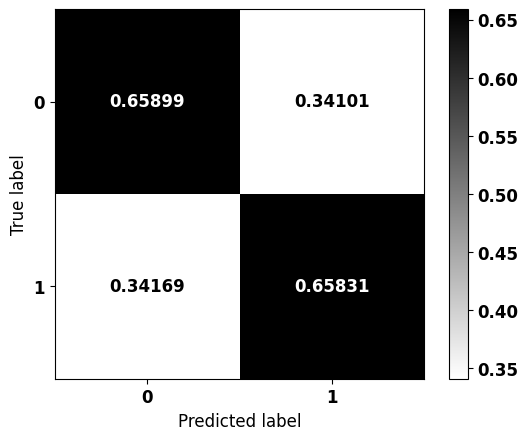


              precision    recall  f1-score   support

           0    0.84648   0.65899   0.74106       912
           1    0.40307   0.65831   0.50000       319

    accuracy                        0.65881      1231
   macro avg    0.62477   0.65865   0.62053      1231
weighted avg    0.73157   0.65881   0.67859      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.744}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

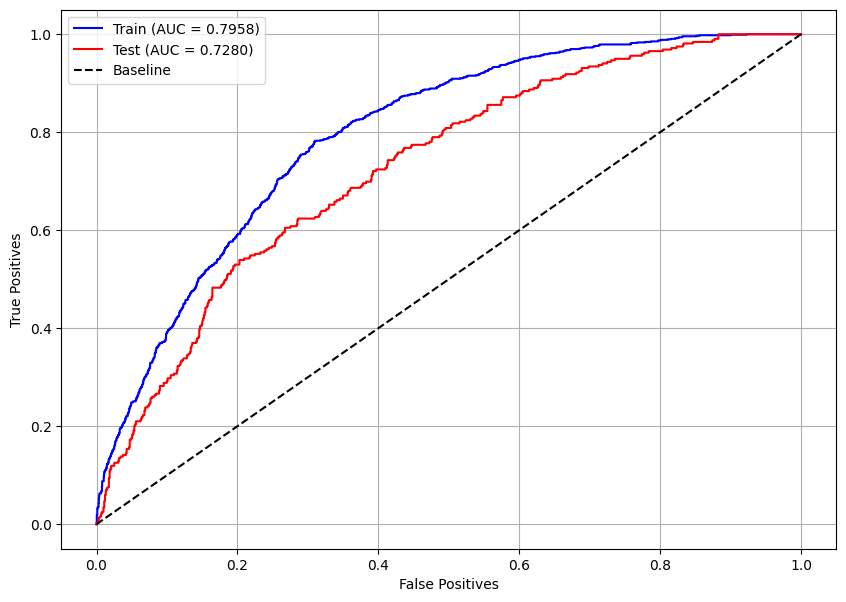

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 51,
 'max_depth': 3,
 'learning_rate': 0.16,
 'min_child_weight': 7,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 2.8, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

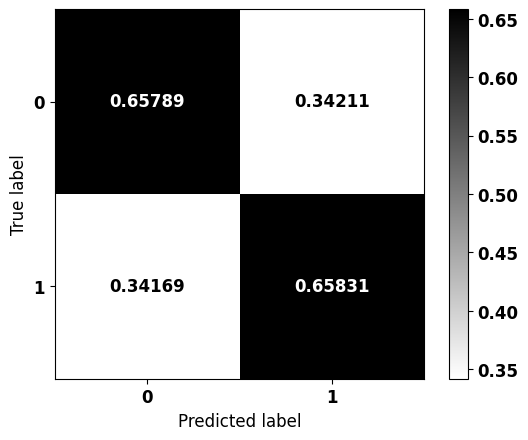


              precision    recall  f1-score   support

           0    0.84626   0.65789   0.74028       912
           1    0.40230   0.65831   0.49941       319

    accuracy                        0.65800      1231
   macro avg    0.62428   0.65810   0.61984      1231
weighted avg    0.73121   0.65800   0.67786      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.752}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

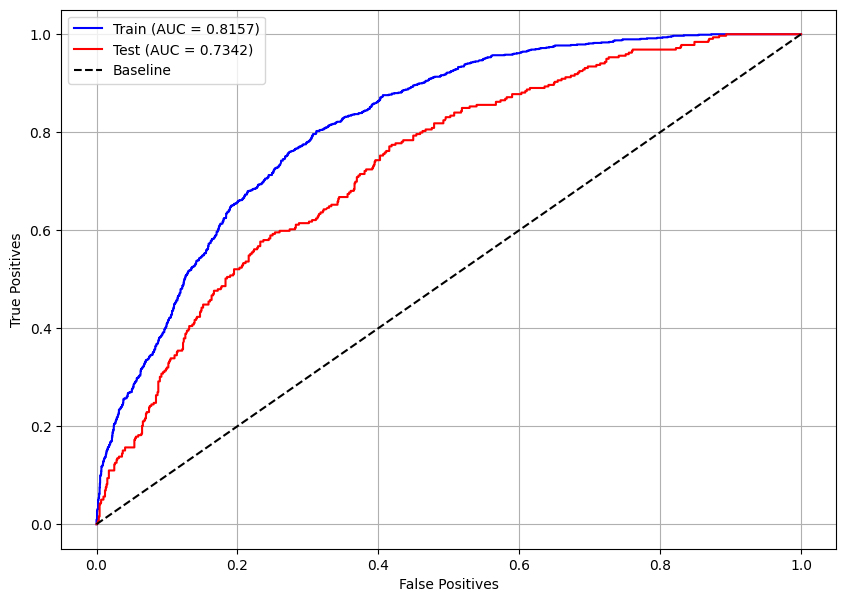

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 79,
 'max_depth': 2,
 'learning_rate': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.7, 2.9, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.0012:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

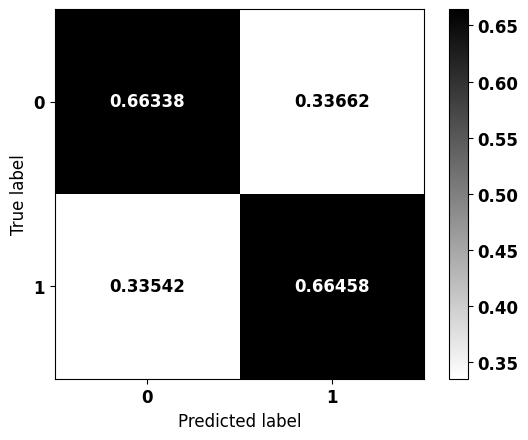


              precision    recall  f1-score   support

           0    0.84972   0.66338   0.74507       912
           1    0.40848   0.66458   0.50597       319

    accuracy                        0.66369      1231
   macro avg    0.62910   0.66398   0.62552      1231
weighted avg    0.73538   0.66369   0.68311      1231



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.748}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

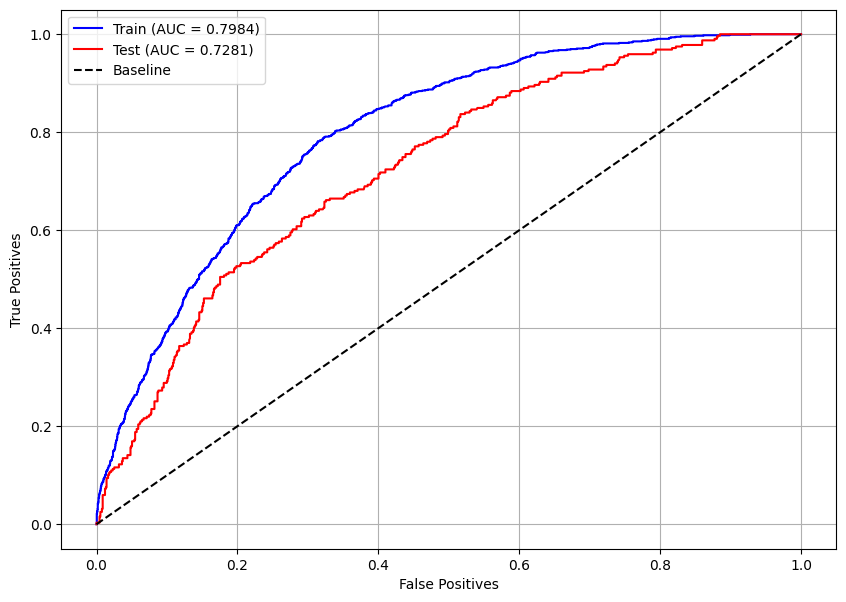

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 2.748}, colsample_bytree=0.4,
               learning_rate=0.2, max_depth=2, min_child_weight=6,
               n_estimators=79, random_state=7, verbose=-1)


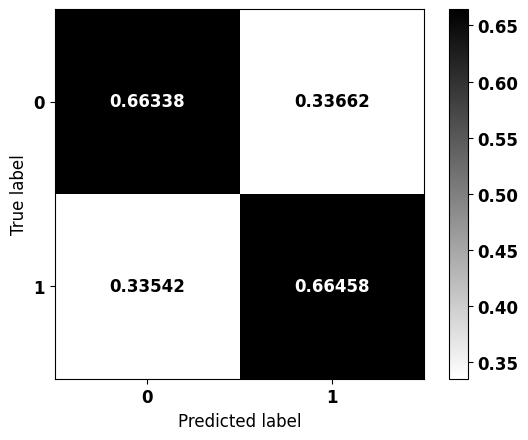


              precision    recall  f1-score   support

           0    0.84972   0.66338   0.74507       912
           1    0.40848   0.66458   0.50597       319

    accuracy                        0.66369      1231
   macro avg    0.62910   0.66398   0.62552      1231
weighted avg    0.73538   0.66369   0.68311      1231



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

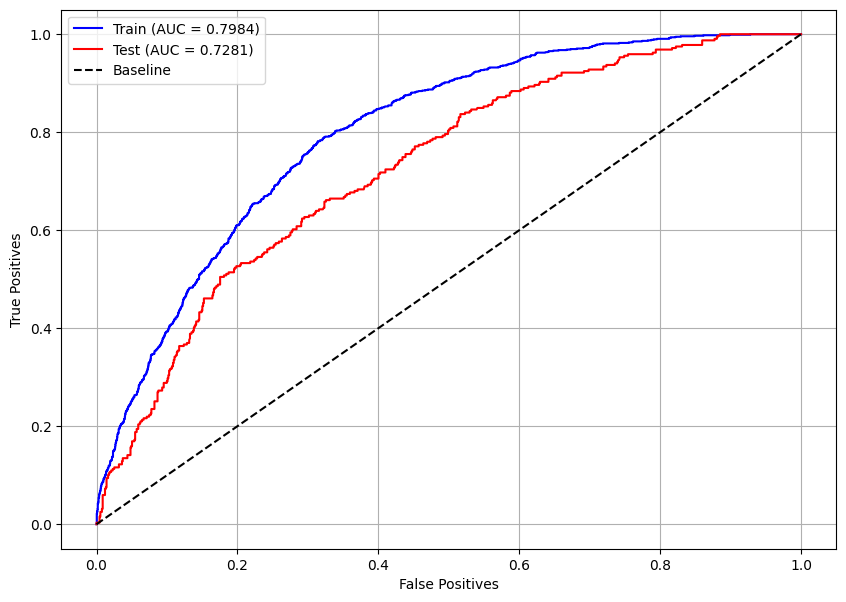

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


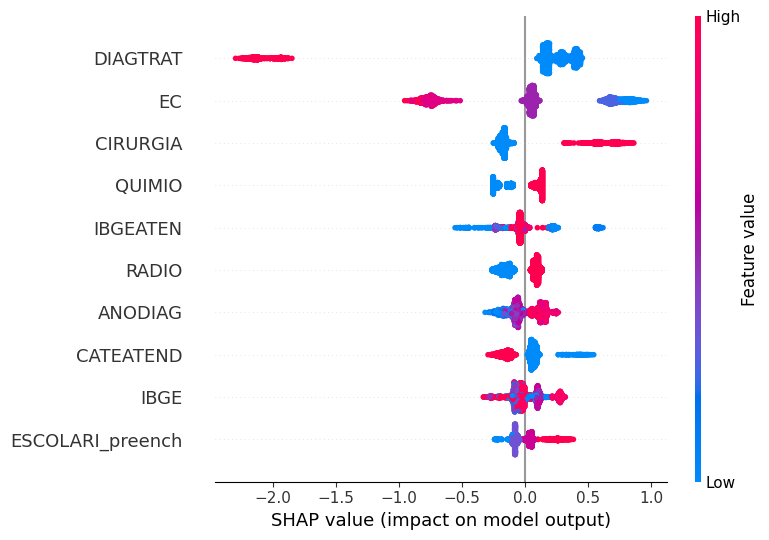

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.6548, Optuna = 0.6621

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.6556, Optuna = 0.6637

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 2.748}, colsample_bytree=0.4,
               learning_rate=0.2, max_depth=2, min_child_weight=6,
               n_estimators=79, random_state=7, verbose=-1)

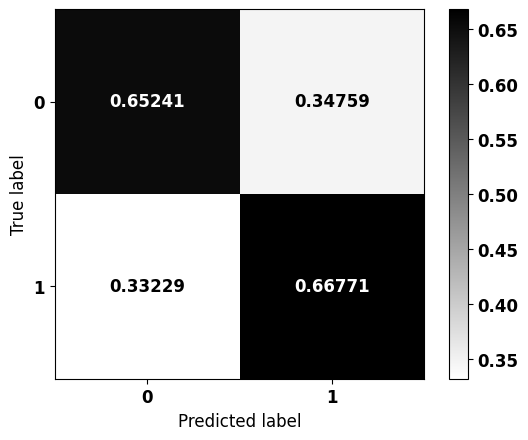


              precision    recall  f1-score   support

           0    0.84879   0.65241   0.73776       912
           1    0.40189   0.66771   0.50177       319

    accuracy                        0.65638      1231
   macro avg    0.62534   0.66006   0.61976      1231
weighted avg    0.73298   0.65638   0.67660      1231



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

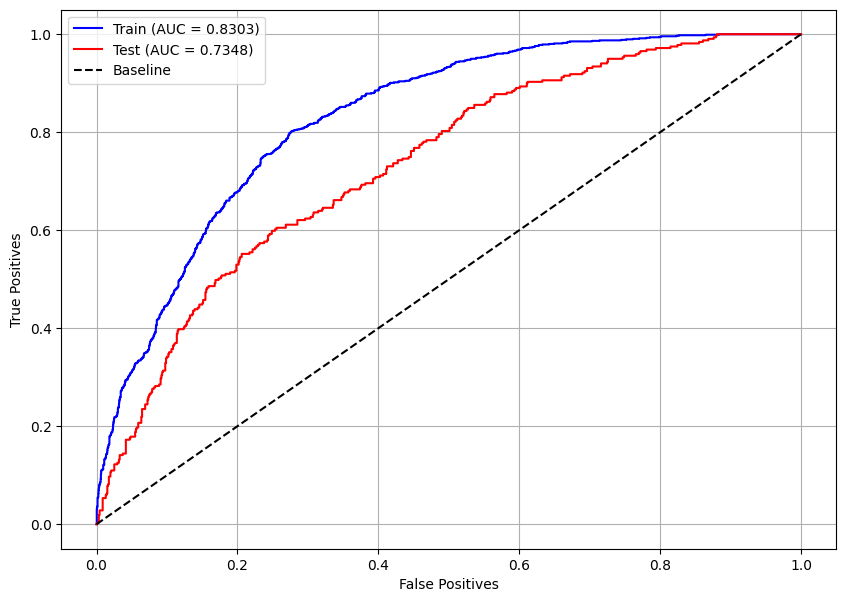

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 2.748}, colsample_bytree=0.4,
               learning_rate=0.2, max_depth=2, min_child_weight=6,
               n_estimators=79, random_state=7, verbose=-1)


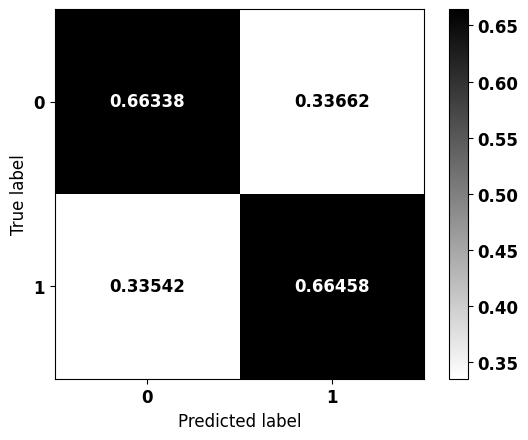


              precision    recall  f1-score   support

           0    0.84972   0.66338   0.74507       912
           1    0.40848   0.66458   0.50597       319

    accuracy                        0.66369      1231
   macro avg    0.62910   0.66398   0.62552      1231
weighted avg    0.73538   0.66369   0.68311      1231



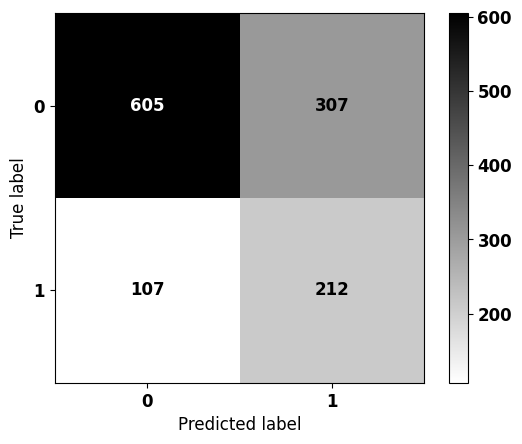


              precision    recall  f1-score   support

           0    0.84972   0.66338   0.74507       912
           1    0.40848   0.66458   0.50597       319

    accuracy                        0.66369      1231
   macro avg    0.62910   0.66398   0.62552      1231
weighted avg    0.73538   0.66369   0.68311      1231



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

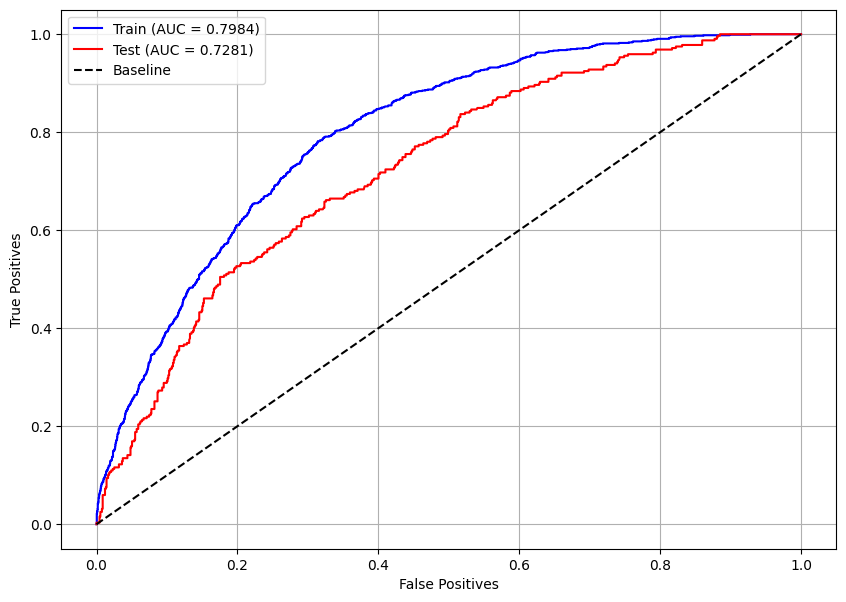

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


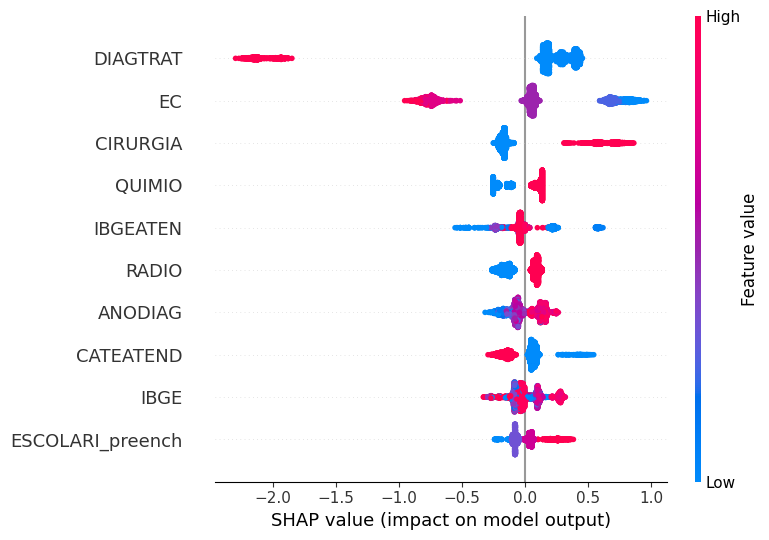

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


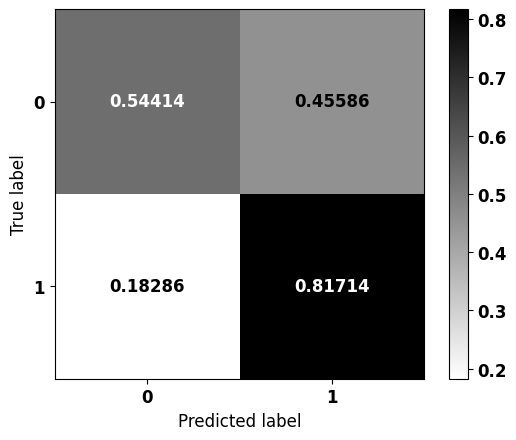


              precision    recall  f1-score   support

           0    0.81105   0.54414   0.65131      3534
           1    0.55411   0.81714   0.66040      2450

    accuracy                        0.65592      5984
   macro avg    0.68258   0.68064   0.65586      5984
weighted avg    0.70585   0.65592   0.65503      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


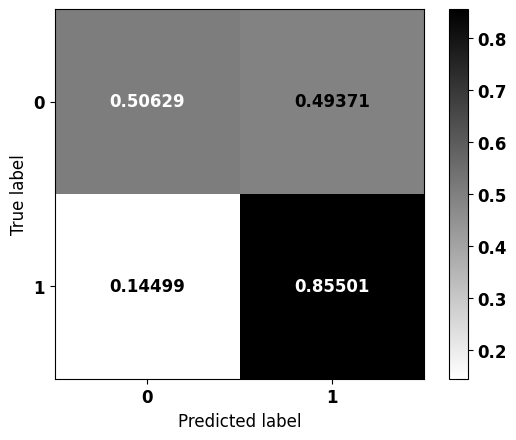


              precision    recall  f1-score   support

           0    0.95745   0.50629   0.66234      3022
           1    0.21183   0.85501   0.33954       469

    accuracy                        0.55314      3491
   macro avg    0.58464   0.68065   0.50094      3491
weighted avg    0.85728   0.55314   0.61897      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


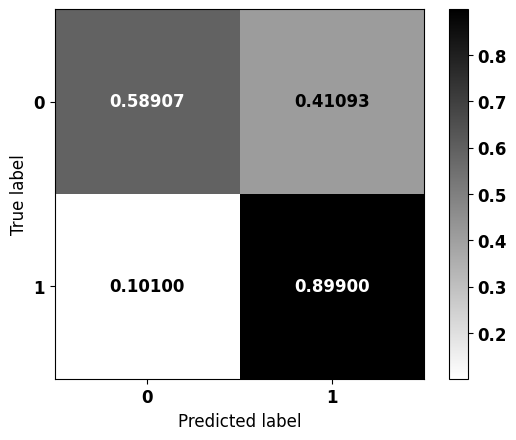


              precision    recall  f1-score   support

           0    0.93969   0.58907   0.72418      5052
           1    0.45021   0.89900   0.59996      1891

    accuracy                        0.67348      6943
   macro avg    0.69495   0.74403   0.66207      6943
weighted avg    0.80638   0.67348   0.69035      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


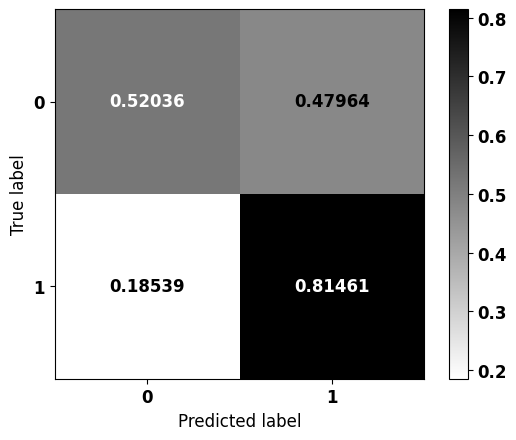


              precision    recall  f1-score   support

           0    0.77703   0.52036   0.62331       221
           1    0.57769   0.81461   0.67599       178

    accuracy                        0.65163       399
   macro avg    0.67736   0.66748   0.64965       399
weighted avg    0.68810   0.65163   0.64681       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


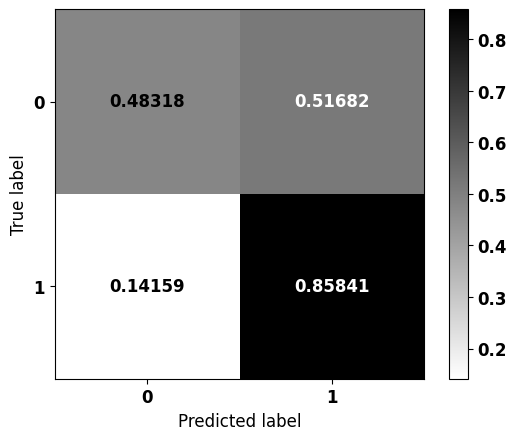


              precision    recall  f1-score   support

           0    0.73408   0.48318   0.58277      6273
           1    0.67249   0.85841   0.75416      7755

    accuracy                        0.69062     14028
   macro avg    0.70328   0.67080   0.66847     14028
weighted avg    0.70003   0.69062   0.67752     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


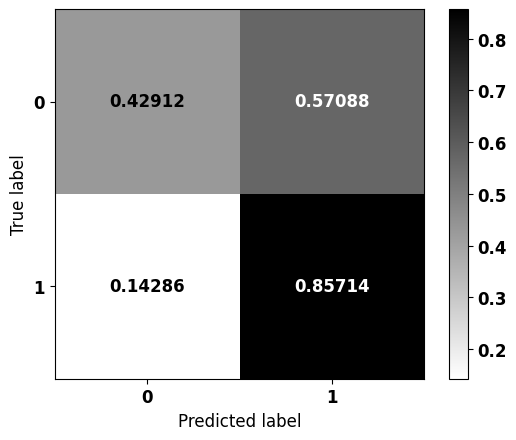


              precision    recall  f1-score   support

           0    0.71795   0.42912   0.53717       261
           1    0.63923   0.85714   0.73232       308

    accuracy                        0.66081       569
   macro avg    0.67859   0.64313   0.63474       569
weighted avg    0.67534   0.66081   0.64280       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Esophagus**

In [ ]:
# Missing values
df_eso.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the esophagus cancer dataset
corr_matrix = df_eso.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3      1.000000
sobrevida_ano5      0.704455
obito_geral         0.635032
sobrevida_ano1      0.484520
CIRURGIA            0.180428
NENHUM              0.144830
TRATCONS            0.143891
DIAGTRAT            0.143725
presenca_rec        0.108631
CATEATEND           0.074496
QUIMIO              0.071812
RADIO               0.064687
SEXO                0.056364
ANODIAG             0.053457
CONSDIAG            0.039530
ESCOLARI_preench    0.038253
OUTROS              0.037220
IMUNO               0.028714
IBGEATEN            0.022549
DIAGPREV            0.019119
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_eso.sobrevida_ano3.value_counts()

sobrevida_ano3
0    12086
1     1875
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_eso,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (10470, 23), X_test = (3491, 23)
y_train = (10470,), y_test = (3491,)


In [ ]:
# Training dataset for Esophagus Cancer

# Create a DataFrame for training data with selected features
eso_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Esôfago' for Esophagus Cancer)
eso_treino['TOPOGRUP'] = 'Esôfago'

# Add the target variable (survival after 3 years) to the training dataset
eso_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Esophagus Cancer

# Create a DataFrame for testing data with selected features
eso_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Esôfago' for Esophagus Cancer)
eso_teste['TOPOGRUP'] = 'Esôfago'

# Add the target variable (survival after 3 years) to the testing dataset
eso_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

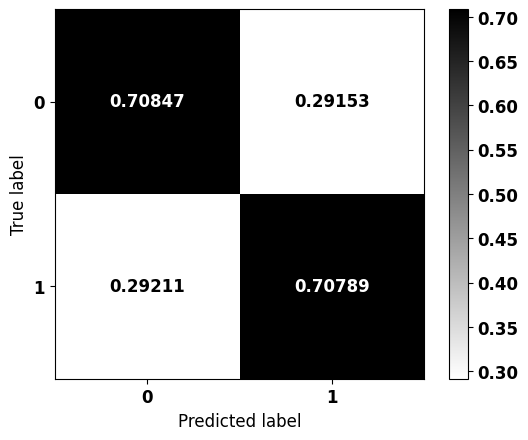


              precision    recall  f1-score   support

           0    0.93986   0.70847   0.80792      3022
           1    0.27370   0.70789   0.39477       469

    accuracy                        0.70839      3491
   macro avg    0.60678   0.70818   0.60135      3491
weighted avg    0.85036   0.70839   0.75242      3491



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=2,            # Set maximum tree depth to 4
                    scale_pos_weight=6.62,  # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

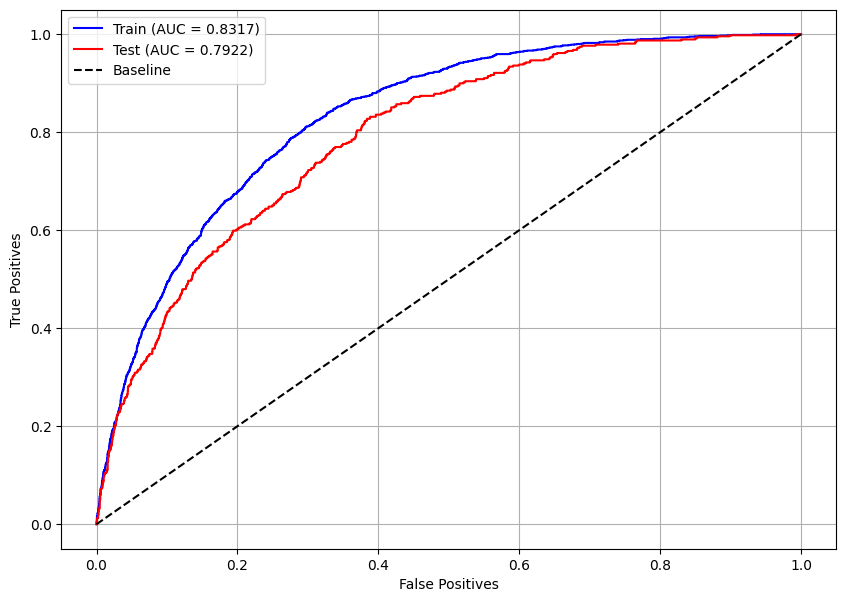

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

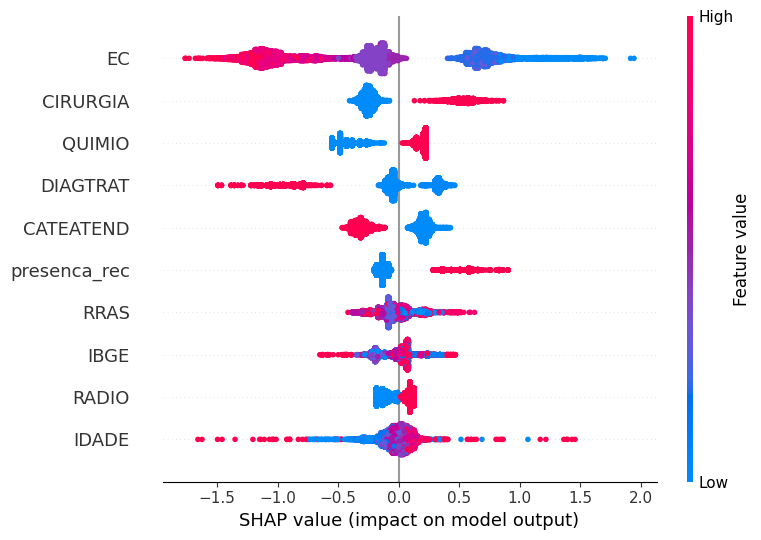

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):


    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 140,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.1,
 'min_child_weight': 7,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(6.67, 6.71, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

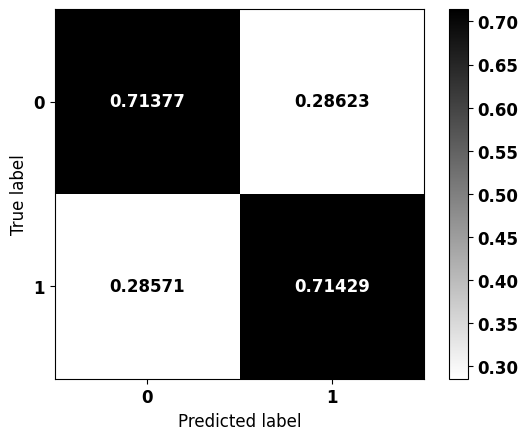


              precision    recall  f1-score   support

           0    0.94151   0.71377   0.81197      3022
           1    0.27917   0.71429   0.40144       469

    accuracy                        0.71384      3491
   macro avg    0.61034   0.71403   0.60670      3491
weighted avg    0.85253   0.71384   0.75682      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 6.676  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

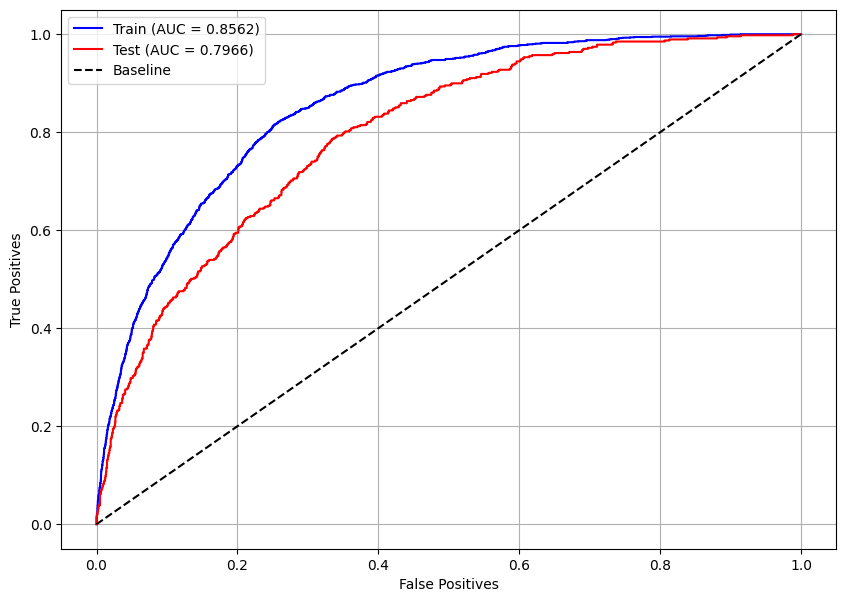

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 131,
 'max_depth': 3,
 'learning_rate': 0.1,
 'gamma': 0.2,
 'min_child_weight': 4,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(6.3, 6.7, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

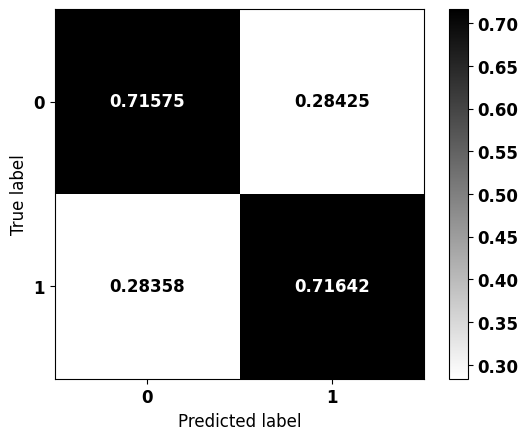


              precision    recall  f1-score   support

           0    0.94207   0.71575   0.81346      3022
           1    0.28117   0.71642   0.40385       469

    accuracy                        0.71584      3491
   macro avg    0.61162   0.71608   0.60865      3491
weighted avg    0.85328   0.71584   0.75843      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 6.426  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

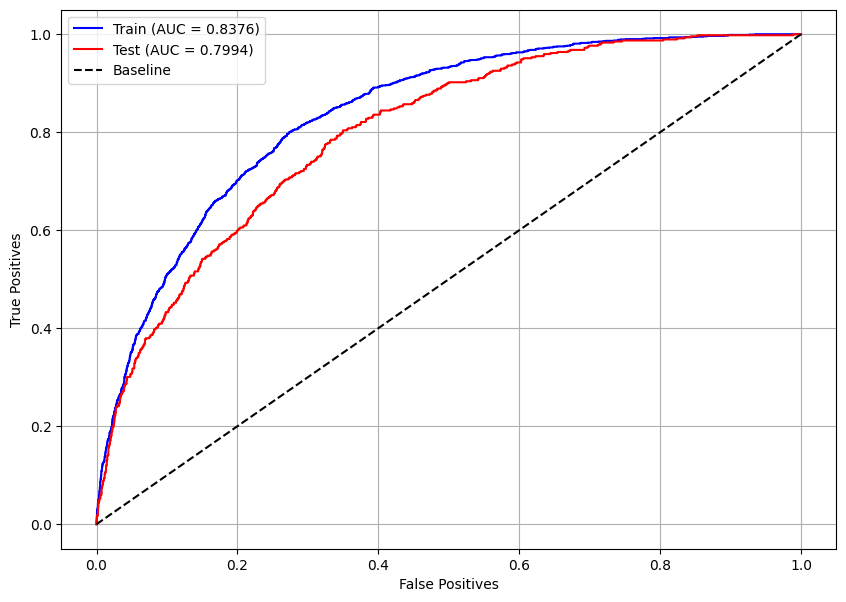

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 103,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.1,
 'min_child_weight': 5,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(6.4, 6.75, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

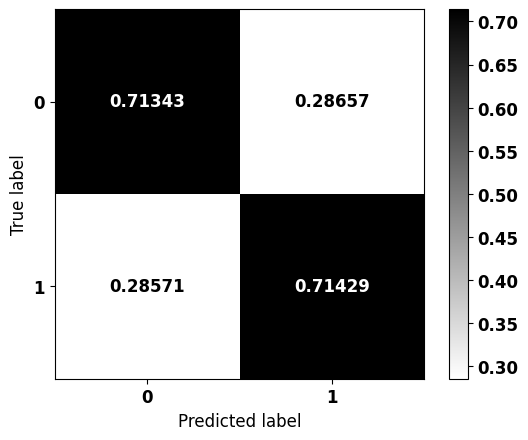


              precision    recall  f1-score   support

           0    0.94148   0.71343   0.81175      3022
           1    0.27893   0.71429   0.40120       469

    accuracy                        0.71355      3491
   macro avg    0.61021   0.71386   0.60647      3491
weighted avg    0.85247   0.71355   0.75659      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 6.526  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

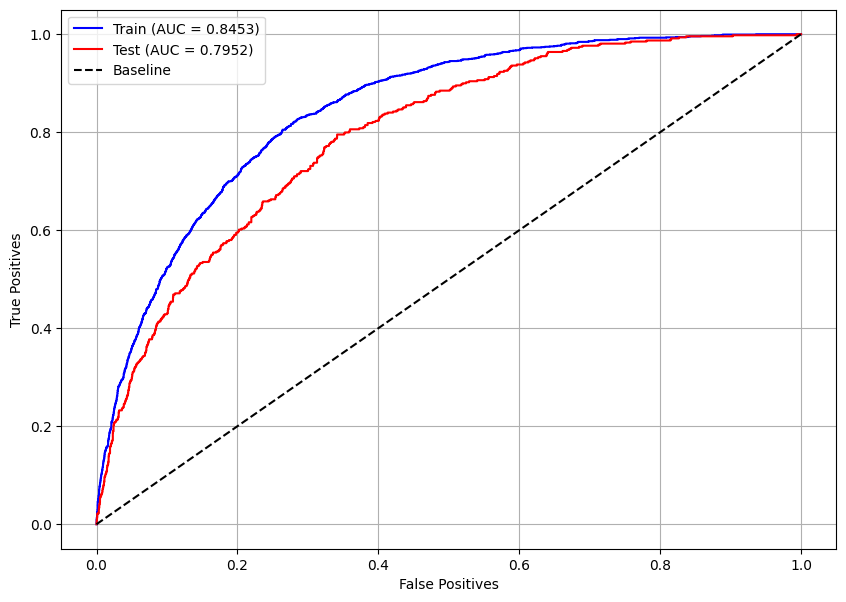

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=131, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


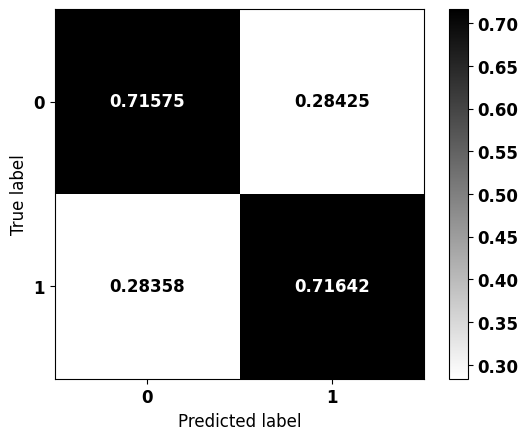


              precision    recall  f1-score   support

           0    0.94207   0.71575   0.81346      3022
           1    0.28117   0.71642   0.40385       469

    accuracy                        0.71584      3491
   macro avg    0.61162   0.71608   0.60865      3491
weighted avg    0.85328   0.71584   0.75843      3491



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

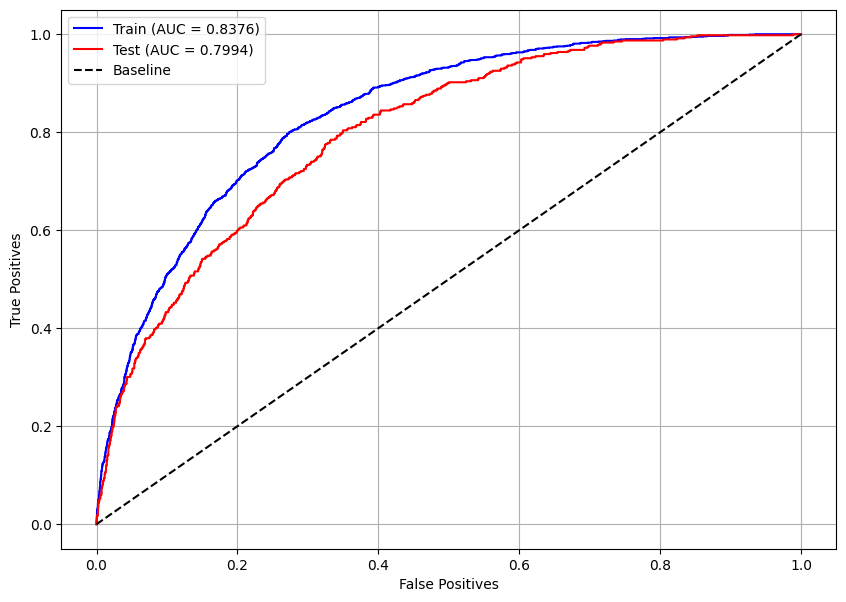

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

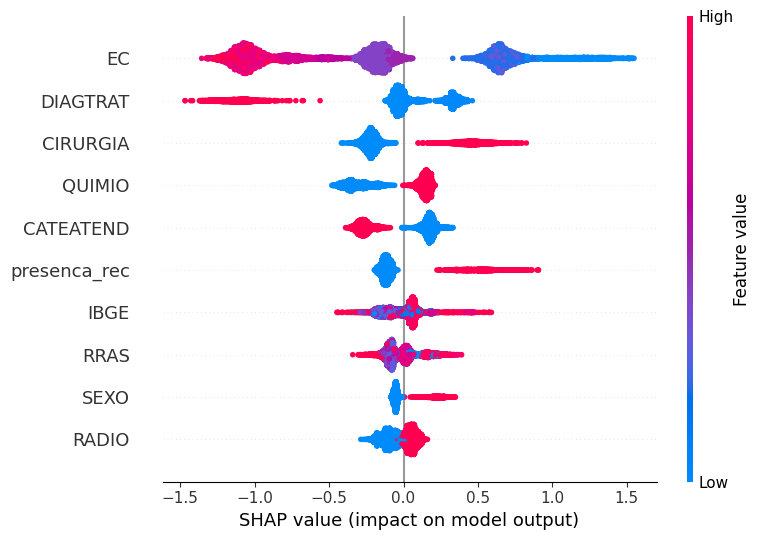

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

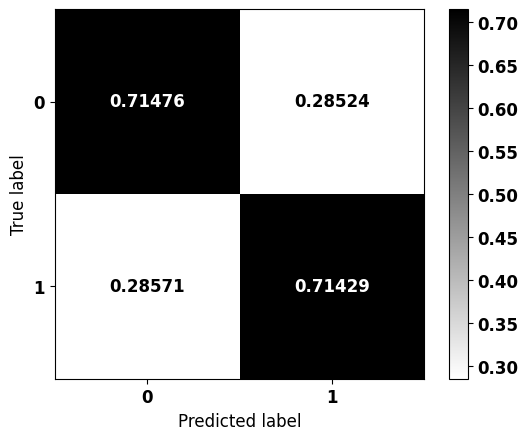


              precision    recall  f1-score   support

           0    0.94159   0.71476   0.81264      3022
           1    0.27987   0.71429   0.40216       469

    accuracy                        0.71469      3491
   macro avg    0.61073   0.71452   0.60740      3491
weighted avg    0.85269   0.71469   0.75749      3491



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=2,                  # Set maximum tree depth to 2
                      class_weight={0:1, 1:6.2},    # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

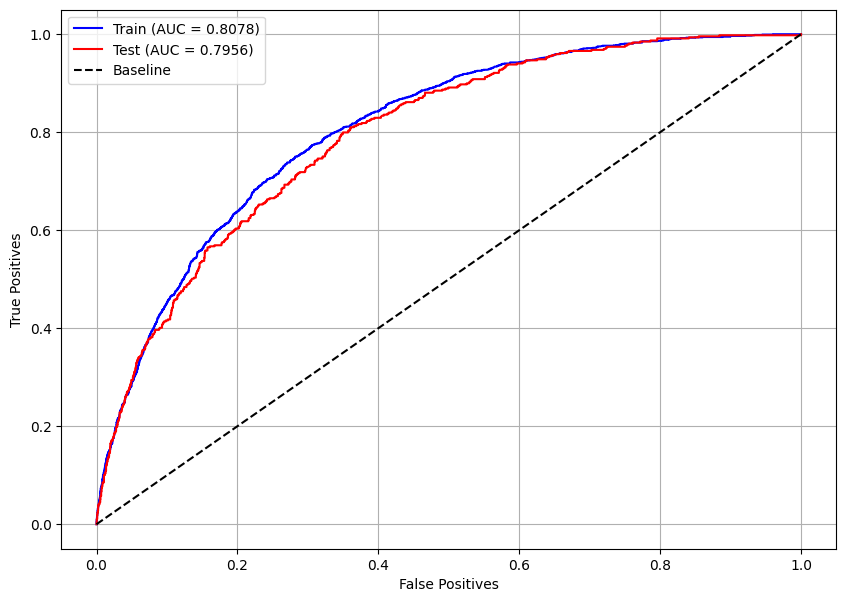

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


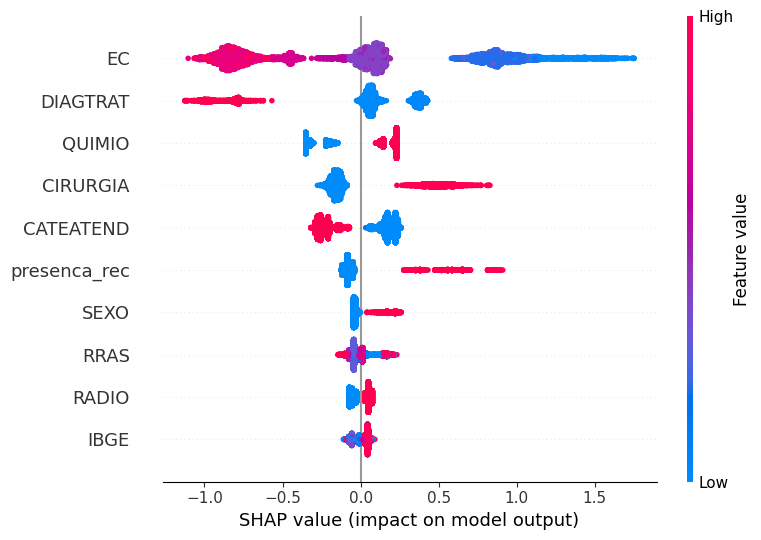

In [ ]:
# Importância das features pelos valores SHAP
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 52,
 'max_depth': 3,
 'learning_rate': 0.2,
 'min_child_weight': 5,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(6.3, 6.6, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.0015:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

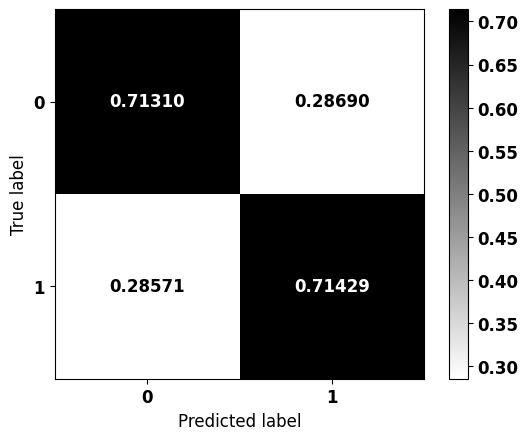


              precision    recall  f1-score   support

           0    0.94146   0.71310   0.81152      3022
           1    0.27870   0.71429   0.40096       469

    accuracy                        0.71326      3491
   macro avg    0.61008   0.71369   0.60624      3491
weighted avg    0.85242   0.71326   0.75637      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:6.337}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

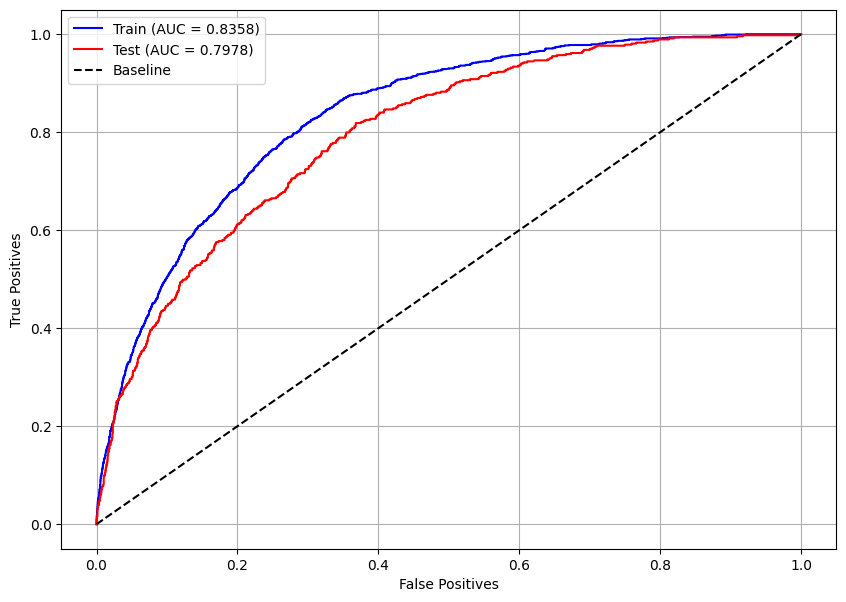

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 84,
 'max_depth': 3,
 'learning_rate': 0.13,
 'min_child_weight': 4,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(6.2, 6.6, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

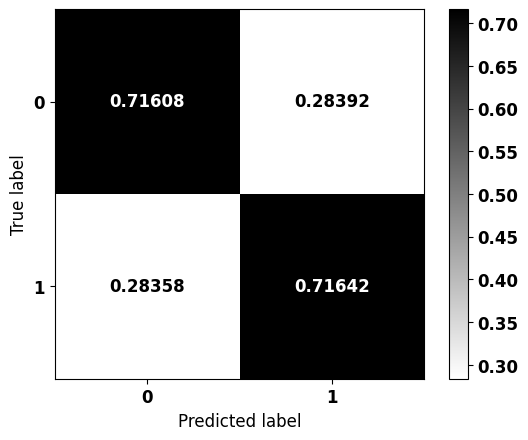


              precision    recall  f1-score   support

           0    0.94210   0.71608   0.81369      3022
           1    0.28141   0.71642   0.40409       469

    accuracy                        0.71613      3491
   macro avg    0.61175   0.71625   0.60889      3491
weighted avg    0.85334   0.71613   0.75866      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:6.29}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

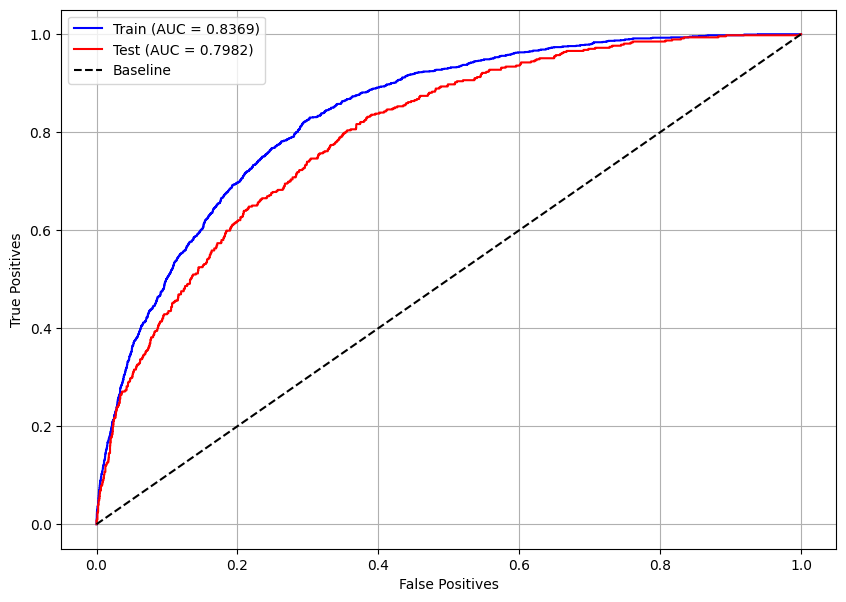

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 94,
 'max_depth': 3,
 'learning_rate': 0.12000000000000001,
 'min_child_weight': 4,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(6.3, 6.7, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

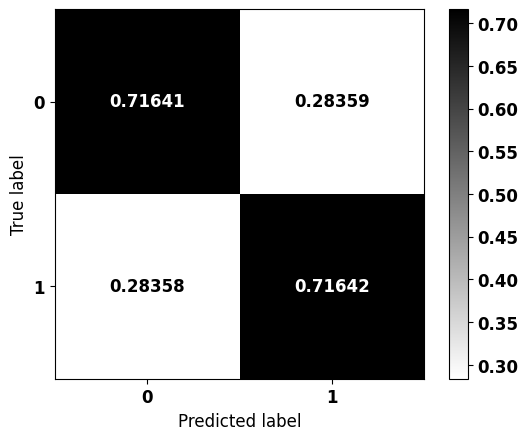


              precision    recall  f1-score   support

           0    0.94212   0.71641   0.81391      3022
           1    0.28164   0.71642   0.40433       469

    accuracy                        0.71641      3491
   macro avg    0.61188   0.71642   0.60912      3491
weighted avg    0.85339   0.71641   0.75888      3491



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:6.488}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

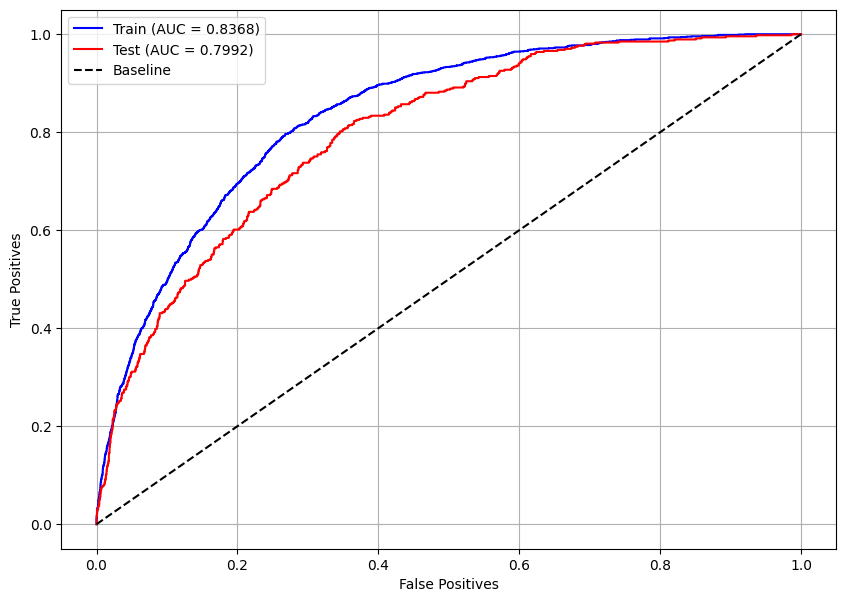

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 6.488}, colsample_bytree=0.6,
               learning_rate=0.12, max_depth=3, min_child_weight=4,
               n_estimators=94, random_state=7, verbose=-1)


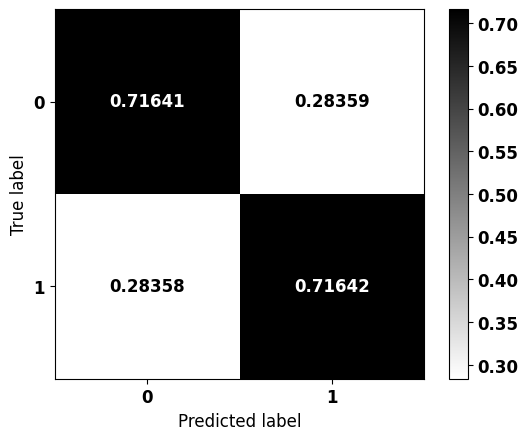


              precision    recall  f1-score   support

           0    0.94212   0.71641   0.81391      3022
           1    0.28164   0.71642   0.40433       469

    accuracy                        0.71641      3491
   macro avg    0.61188   0.71642   0.60912      3491
weighted avg    0.85339   0.71641   0.75888      3491



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

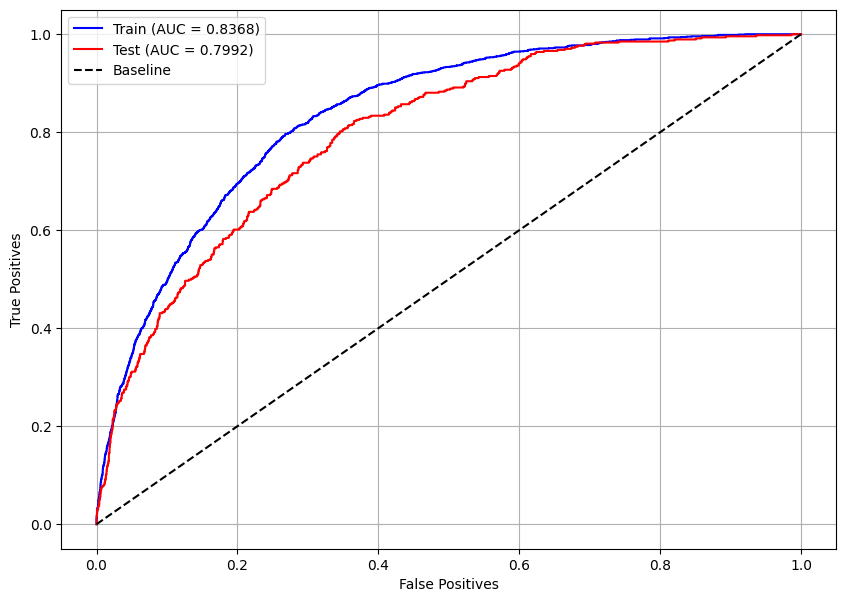

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


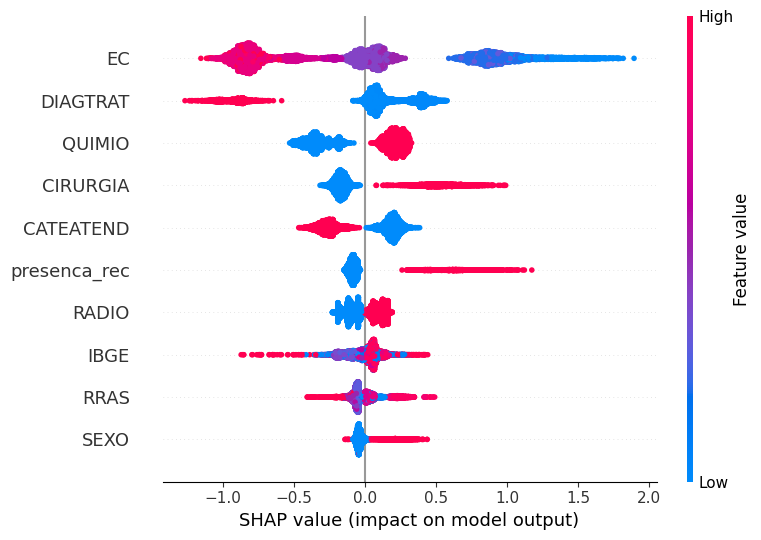

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7084, Optuna = 0.7158

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7147, Optuna = 0.7164

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 6.488}, colsample_bytree=0.6,
               learning_rate=0.12, max_depth=3, min_child_weight=4,
               n_estimators=94, random_state=7, verbose=-1)

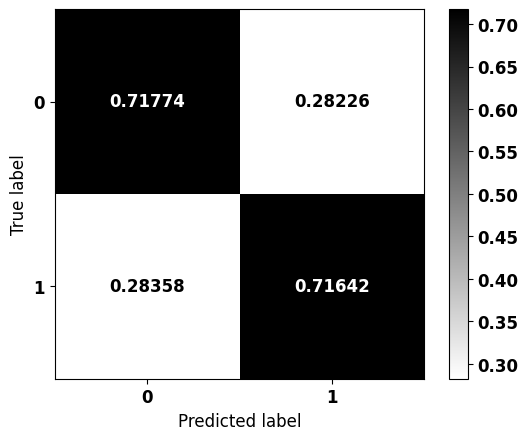


              precision    recall  f1-score   support

           0    0.94222   0.71774   0.81480      3022
           1    0.28259   0.71642   0.40531       469

    accuracy                        0.71756      3491
   macro avg    0.61241   0.71708   0.61005      3491
weighted avg    0.85361   0.71756   0.75979      3491



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

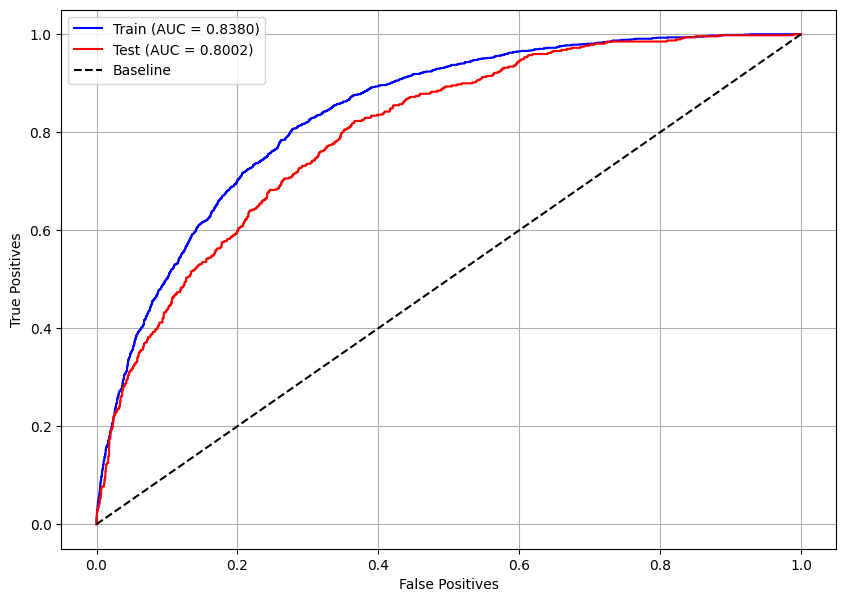

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 6.488}, colsample_bytree=0.6,
               learning_rate=0.12, max_depth=3, min_child_weight=4,
               n_estimators=94, random_state=7, verbose=-1)


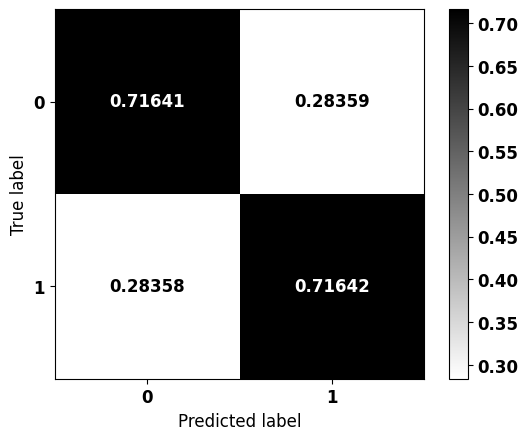


              precision    recall  f1-score   support

           0    0.94212   0.71641   0.81391      3022
           1    0.28164   0.71642   0.40433       469

    accuracy                        0.71641      3491
   macro avg    0.61188   0.71642   0.60912      3491
weighted avg    0.85339   0.71641   0.75888      3491



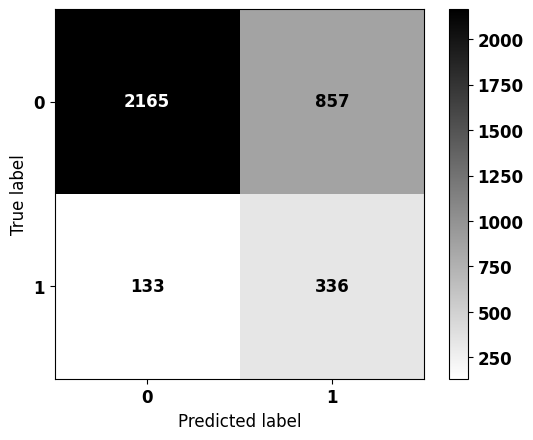


              precision    recall  f1-score   support

           0    0.94212   0.71641   0.81391      3022
           1    0.28164   0.71642   0.40433       469

    accuracy                        0.71641      3491
   macro avg    0.61188   0.71642   0.60912      3491
weighted avg    0.85339   0.71641   0.75888      3491



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

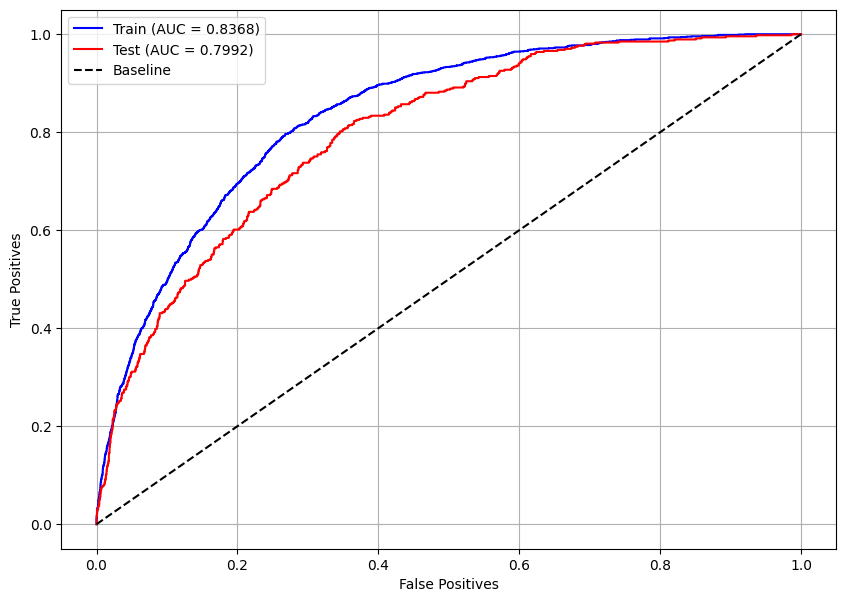

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


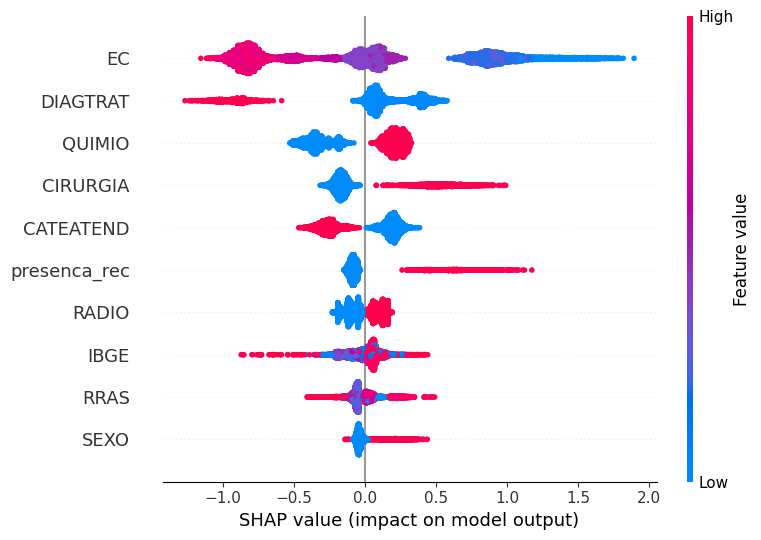

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


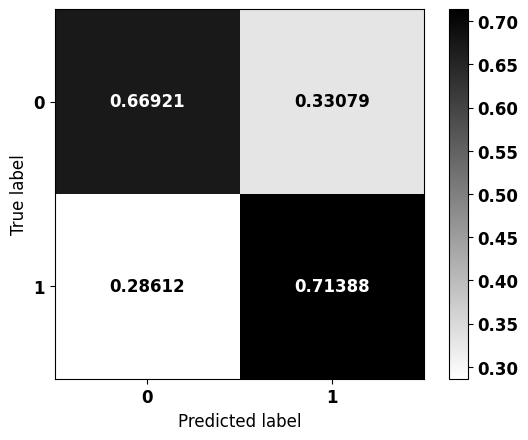


              precision    recall  f1-score   support

           0    0.77136   0.66921   0.71667      3534
           1    0.59938   0.71388   0.65164      2450

    accuracy                        0.68750      5984
   macro avg    0.68537   0.69155   0.68415      5984
weighted avg    0.70095   0.68750   0.69004      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


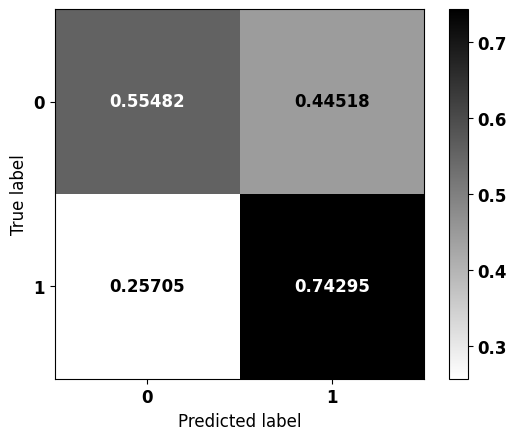


              precision    recall  f1-score   support

           0    0.86054   0.55482   0.67467       912
           1    0.36858   0.74295   0.49272       319

    accuracy                        0.60357      1231
   macro avg    0.61456   0.64889   0.58370      1231
weighted avg    0.73306   0.60357   0.62752      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


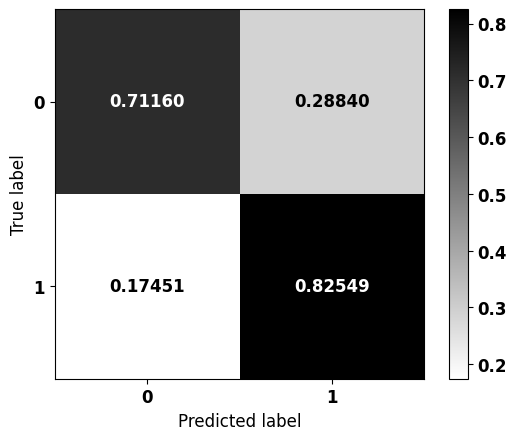


              precision    recall  f1-score   support

           0    0.91592   0.71160   0.80094      5052
           1    0.51723   0.82549   0.63597      1891

    accuracy                        0.74262      6943
   macro avg    0.71658   0.76854   0.71846      6943
weighted avg    0.80734   0.74262   0.75601      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


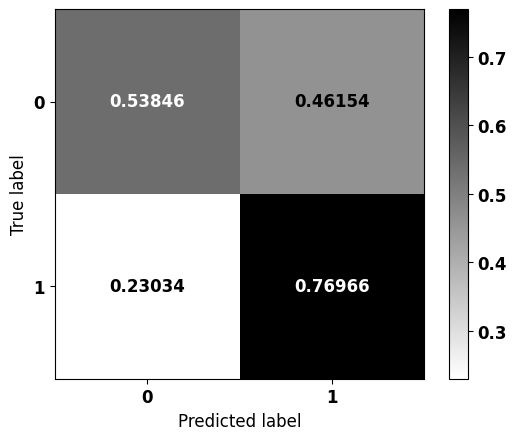


              precision    recall  f1-score   support

           0    0.74375   0.53846   0.62467       221
           1    0.57322   0.76966   0.65707       178

    accuracy                        0.64160       399
   macro avg    0.65849   0.65406   0.64087       399
weighted avg    0.66767   0.64160   0.63913       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


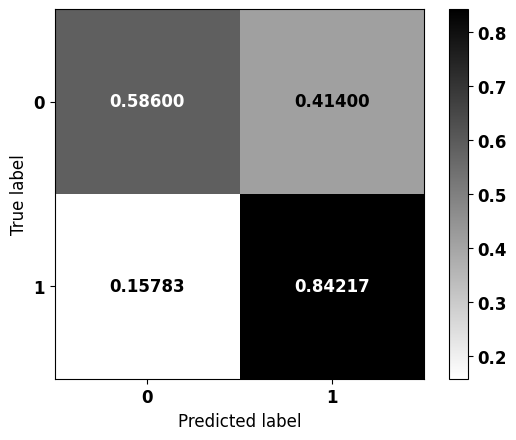


              precision    recall  f1-score   support

           0    0.75020   0.58600   0.65801      6273
           1    0.71549   0.84217   0.77368      7755

    accuracy                        0.72762     14028
   macro avg    0.73285   0.71408   0.71585     14028
weighted avg    0.73101   0.72762   0.72196     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


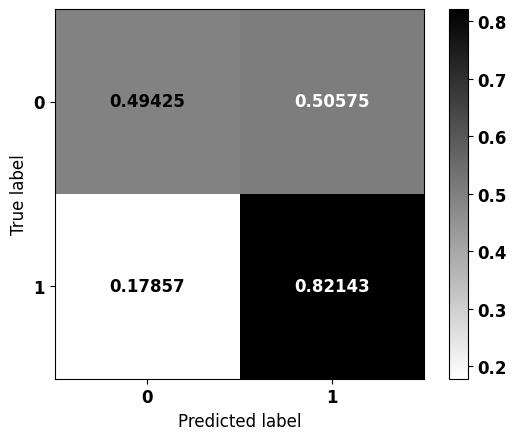


              precision    recall  f1-score   support

           0    0.70109   0.49425   0.57978       261
           1    0.65714   0.82143   0.73016       308

    accuracy                        0.67135       569
   macro avg    0.67911   0.65784   0.65497       569
weighted avg    0.67730   0.67135   0.66118       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Stomach**

In [ ]:
# Missing values
df_esto.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the breast cancer dataset
corr_matrix = df_esto.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3      1.000000
sobrevida_ano5      0.763719
obito_geral         0.720807
sobrevida_ano1      0.608091
CIRURGIA            0.358020
TRATCONS            0.217307
DIAGTRAT            0.216680
NENHUM              0.216618
CATEATEND           0.088961
SEXO                0.083182
OUTROS              0.076980
IDADE               0.076097
RADIO               0.067373
ESCOLARI_preench    0.066151
CONSDIAG            0.052235
QUIMIO              0.027780
HORMONIO            0.022277
DIAGPREV            0.021275
presenca_rec        0.020109
RRAS                0.016772
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_esto.sobrevida_ano3.value_counts()

sobrevida_ano3
0    20207
1     7563
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_esto,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (20827, 23), X_test = (6943, 23)
y_train = (20827,), y_test = (6943,)


In [ ]:
# Training dataset for Stomach Cancer

# Create a DataFrame for training data with selected features
esto_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Estômago' for Stomach Cancer)
esto_treino['TOPOGRUP'] = 'Estômago'

# Add the target variable (survival after 3 years) to the training dataset
esto_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Stomach Cancer

# Create a DataFrame for testing data with selected features
esto_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Estômago' for Stomach Cancer)
esto_teste['TOPOGRUP'] = 'Estômago'

# Add the target variable (survival after 3 years) to the testing dataset
esto_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

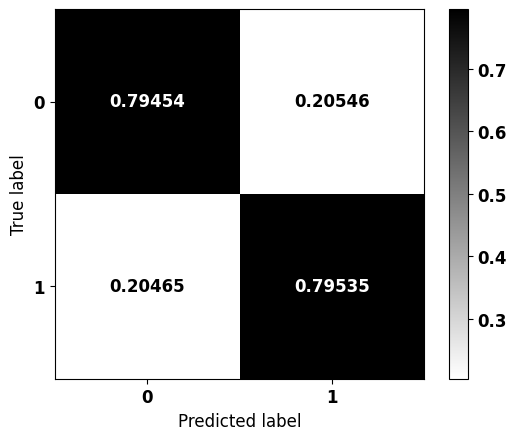


              precision    recall  f1-score   support

           0    0.91207   0.79454   0.84925      5052
           1    0.59166   0.79535   0.67855      1891

    accuracy                        0.79476      6943
   macro avg    0.75186   0.79494   0.76390      6943
weighted avg    0.82480   0.79476   0.80276      6943



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=3,            # Set maximum tree depth to 3
                    scale_pos_weight=2.325, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

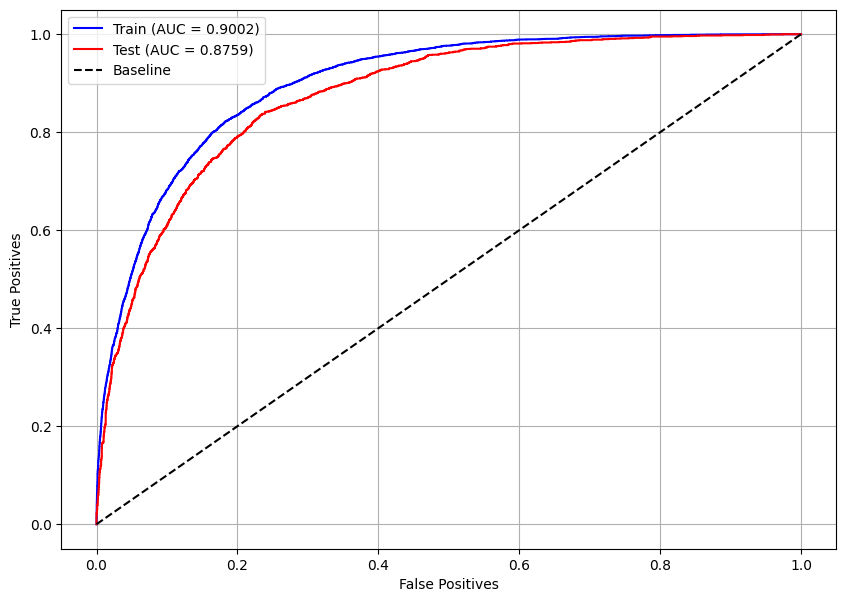

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

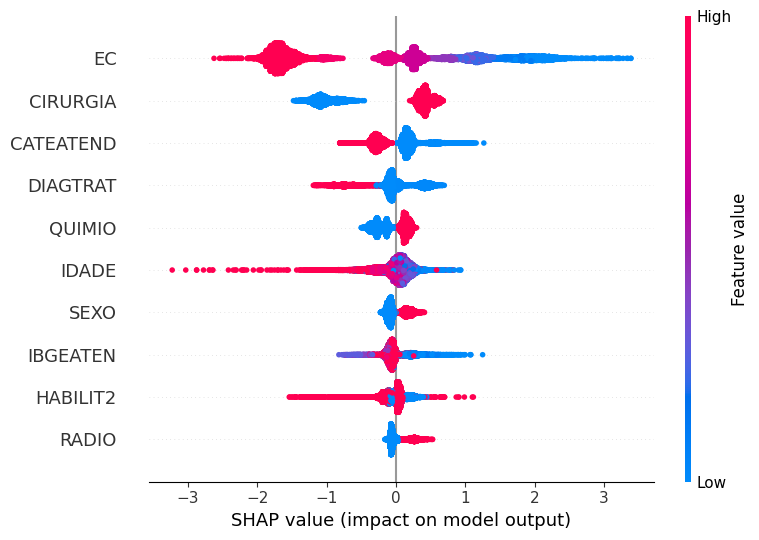

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 5)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 107,
 'max_depth': 5,
 'learning_rate': 0.1,
 'gamma': 0.3,
 'min_child_weight': 2,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.38, 2.42, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

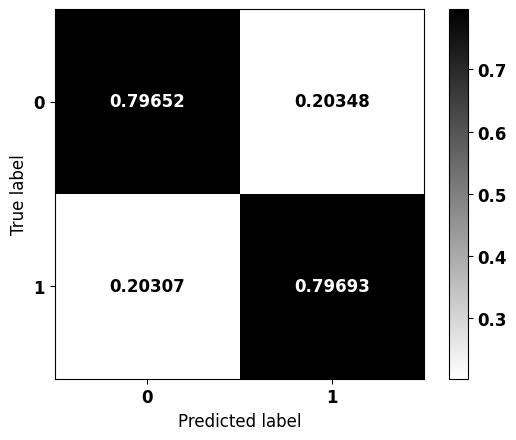


              precision    recall  f1-score   support

           0    0.91289   0.79652   0.85074      5052
           1    0.59448   0.79693   0.68098      1891

    accuracy                        0.79663      6943
   macro avg    0.75368   0.79672   0.76586      6943
weighted avg    0.82616   0.79663   0.80450      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.397  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

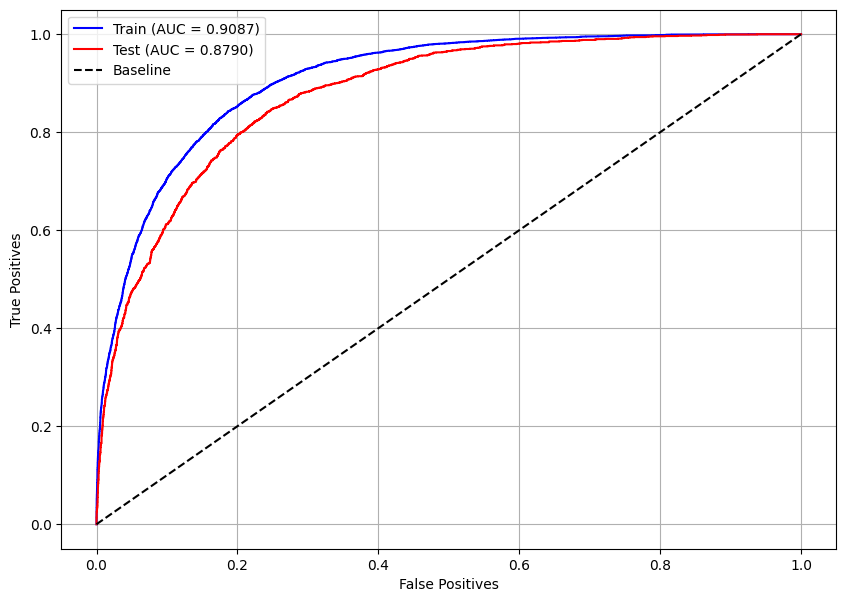

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 70,
 'max_depth': 5,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 7,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.39, 2.425, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

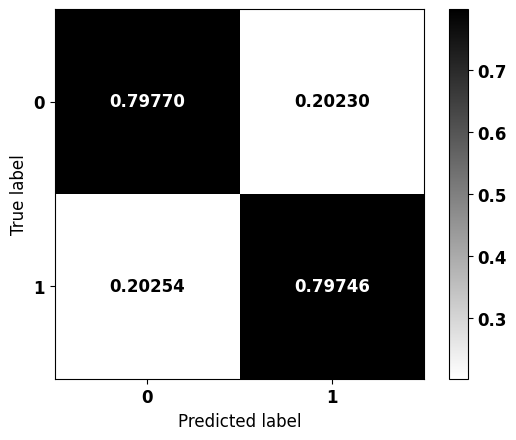


              precision    recall  f1-score   support

           0    0.91321   0.79770   0.85156      5052
           1    0.59605   0.79746   0.68220      1891

    accuracy                        0.79764      6943
   macro avg    0.75463   0.79758   0.76688      6943
weighted avg    0.82683   0.79764   0.80543      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.403  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

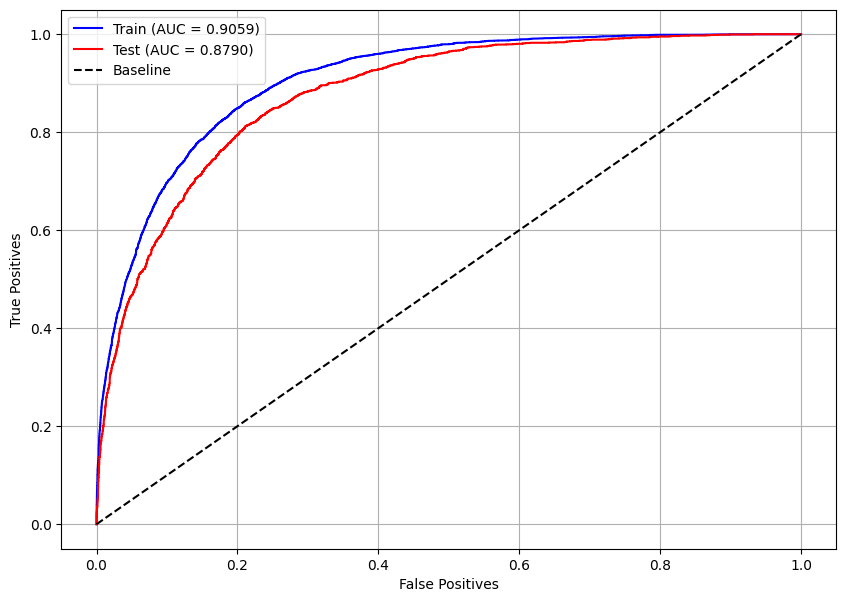

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 134,
 'max_depth': 5,
 'learning_rate': 0.1,
 'gamma': 0.2,
 'min_child_weight': 3,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(2.39, 2.43, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

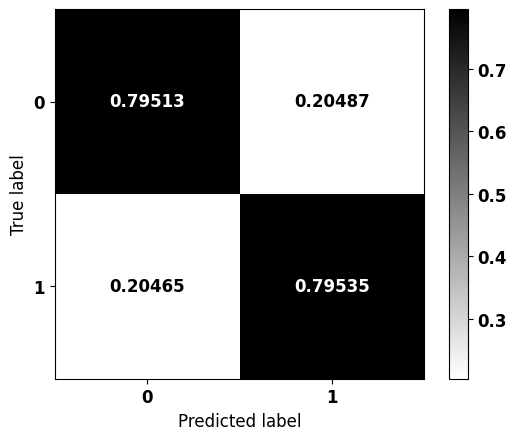


              precision    recall  f1-score   support

           0    0.91213   0.79513   0.84962      5052
           1    0.59236   0.79535   0.67901      1891

    accuracy                        0.79519      6943
   macro avg    0.75224   0.79524   0.76431      6943
weighted avg    0.82503   0.79519   0.80315      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 2.42  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

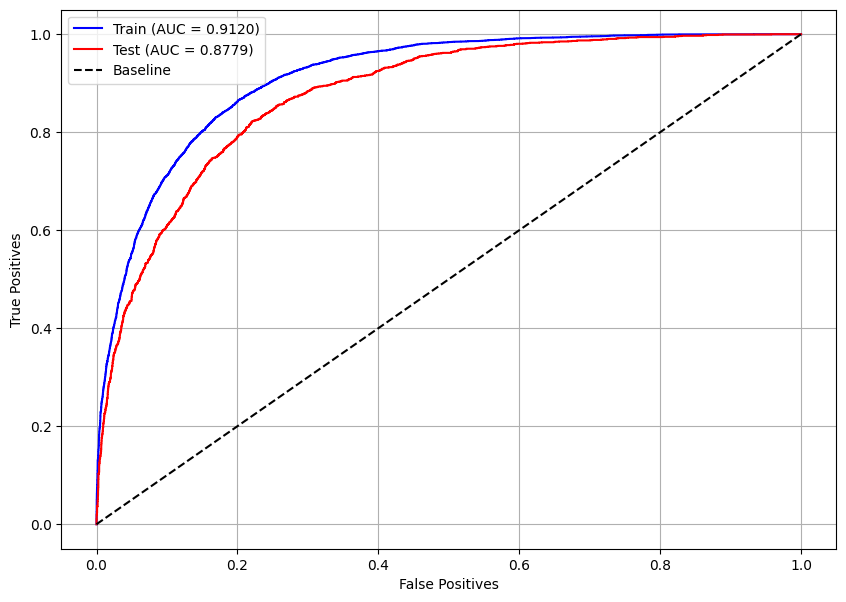

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=70, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


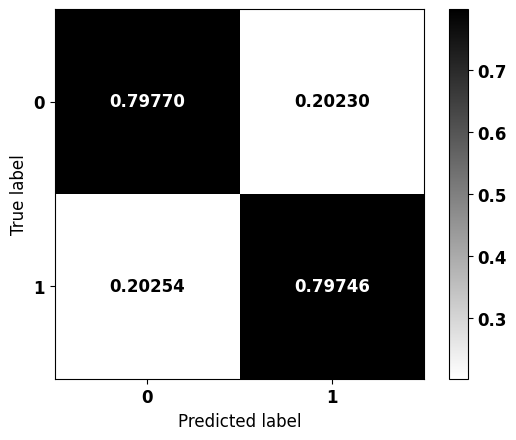


              precision    recall  f1-score   support

           0    0.91321   0.79770   0.85156      5052
           1    0.59605   0.79746   0.68220      1891

    accuracy                        0.79764      6943
   macro avg    0.75463   0.79758   0.76688      6943
weighted avg    0.82683   0.79764   0.80543      6943



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

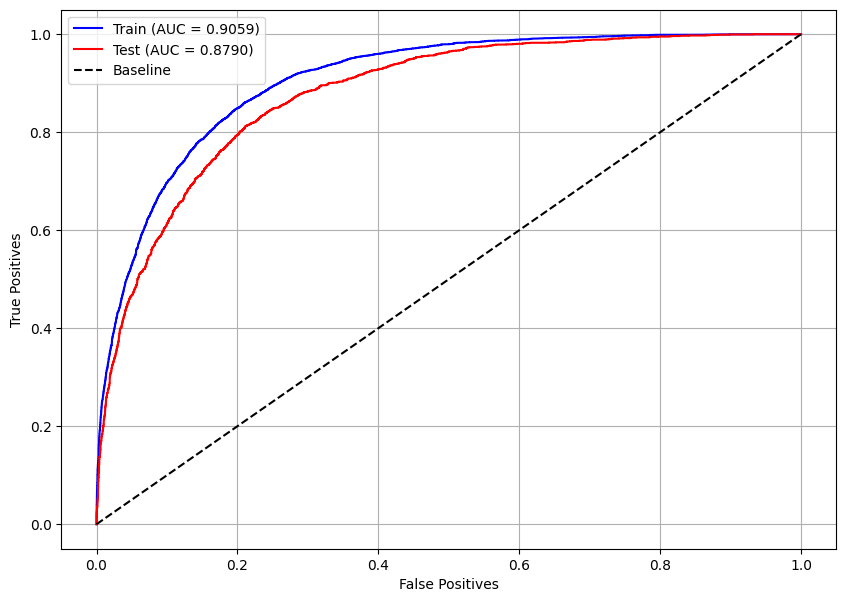

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

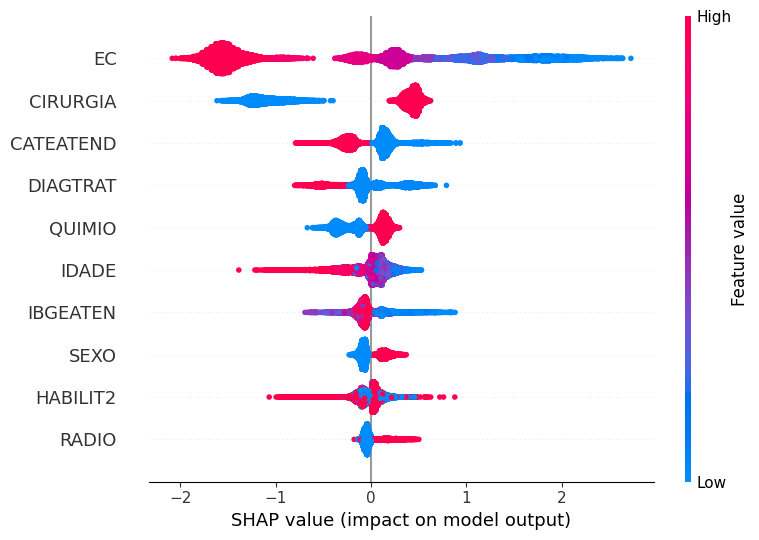

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

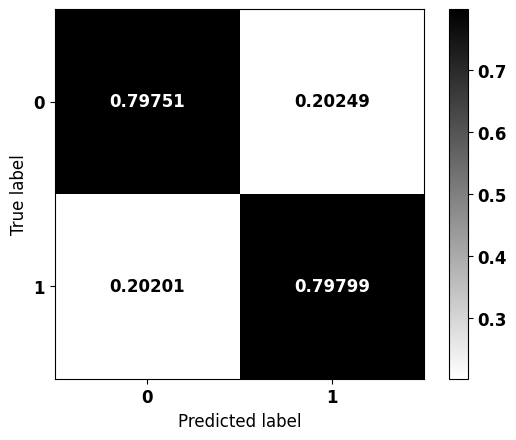


              precision    recall  f1-score   support

           0    0.91340   0.79751   0.85153      5052
           1    0.59597   0.79799   0.68234      1891

    accuracy                        0.79764      6943
   macro avg    0.75468   0.79775   0.76693      6943
weighted avg    0.82694   0.79764   0.80545      6943



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=5,                  # Set maximum tree depth to 10
                      class_weight={0:1, 1:2.34},   # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

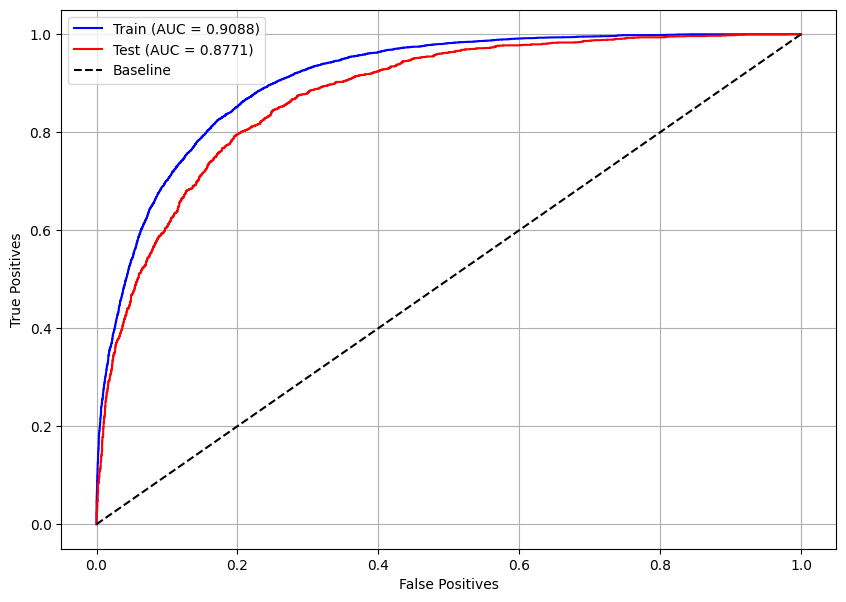

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


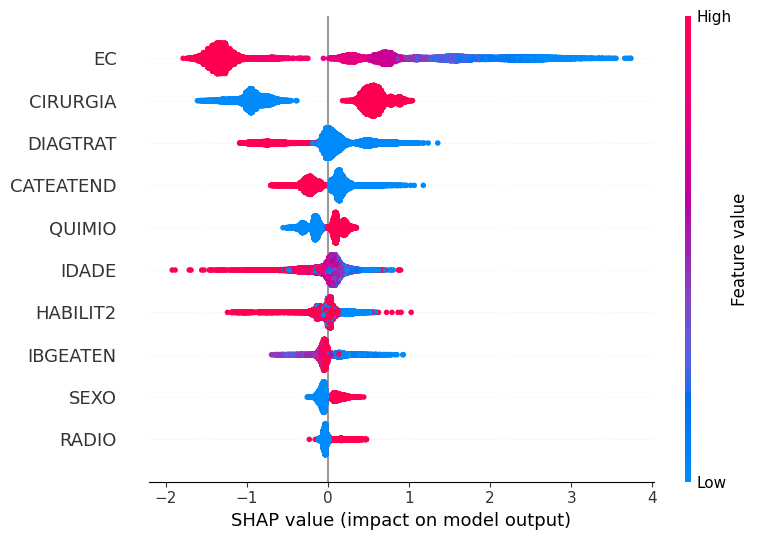

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 5)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 150,
 'max_depth': 4,
 'learning_rate': 0.12000000000000001,
 'min_child_weight': 3,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.25, 2.65, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

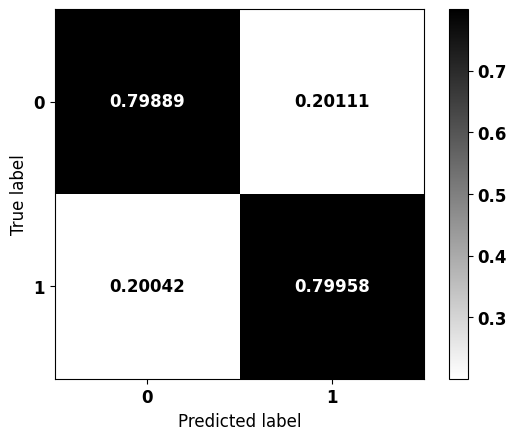


              precision    recall  f1-score   support

           0    0.91416   0.79889   0.85265      5052
           1    0.59810   0.79958   0.68432      1891

    accuracy                        0.79908      6943
   macro avg    0.75613   0.79923   0.76848      6943
weighted avg    0.82808   0.79908   0.80680      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.422}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

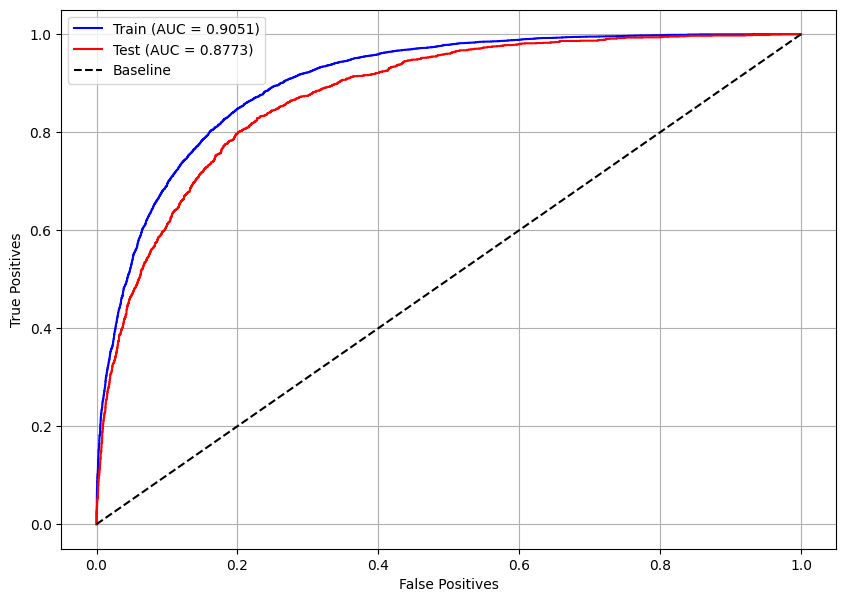

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 126,
 'max_depth': 4,
 'learning_rate': 0.15000000000000002,
 'min_child_weight': 5,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.35, 2.4, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

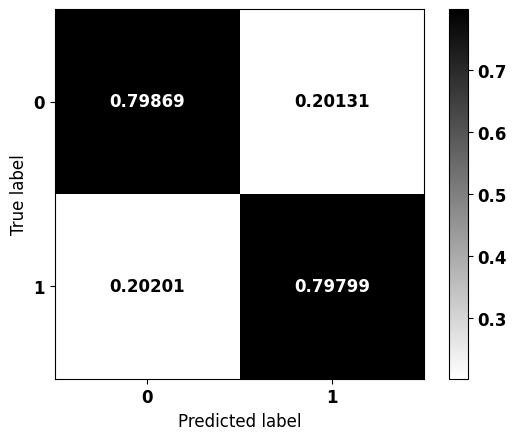


              precision    recall  f1-score   support

           0    0.91352   0.79869   0.85225      5052
           1    0.59739   0.79799   0.68327      1891

    accuracy                        0.79850      6943
   macro avg    0.75545   0.79834   0.76776      6943
weighted avg    0.82741   0.79850   0.80623      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.374}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

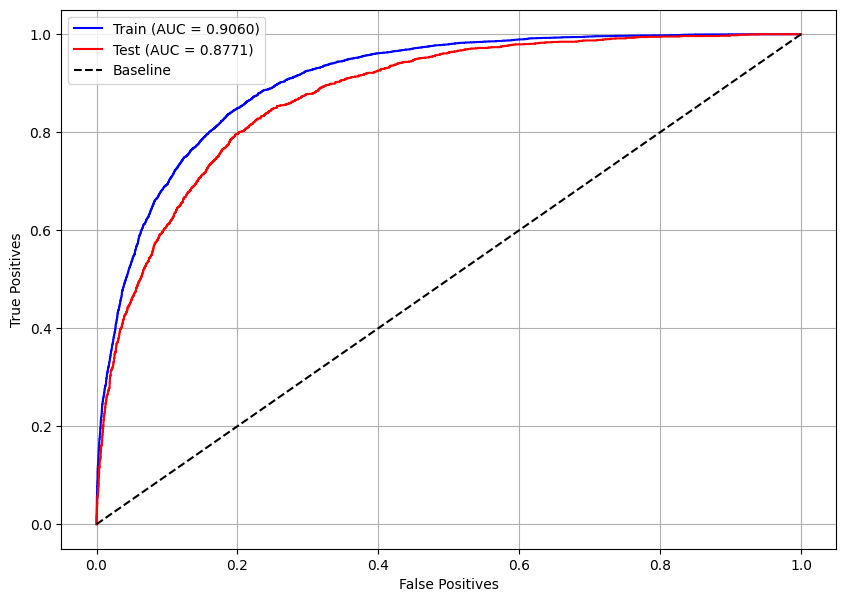

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 111,
 'max_depth': 4,
 'learning_rate': 0.16,
 'min_child_weight': 2,
 'colsample_bytree': 0.3}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(2.31, 2.36, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

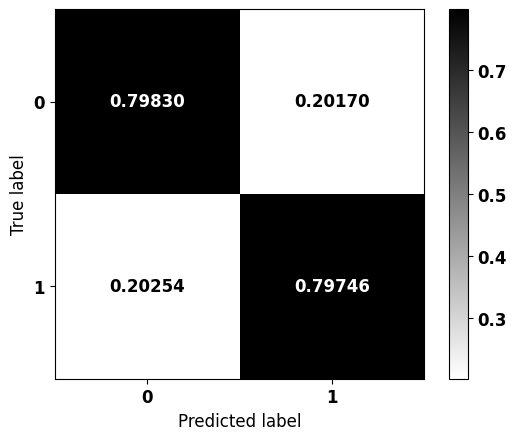


              precision    recall  f1-score   support

           0    0.91327   0.79830   0.85192      5052
           1    0.59676   0.79746   0.68266      1891

    accuracy                        0.79807      6943
   macro avg    0.75501   0.79788   0.76729      6943
weighted avg    0.82706   0.79807   0.80582      6943



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:2.348}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

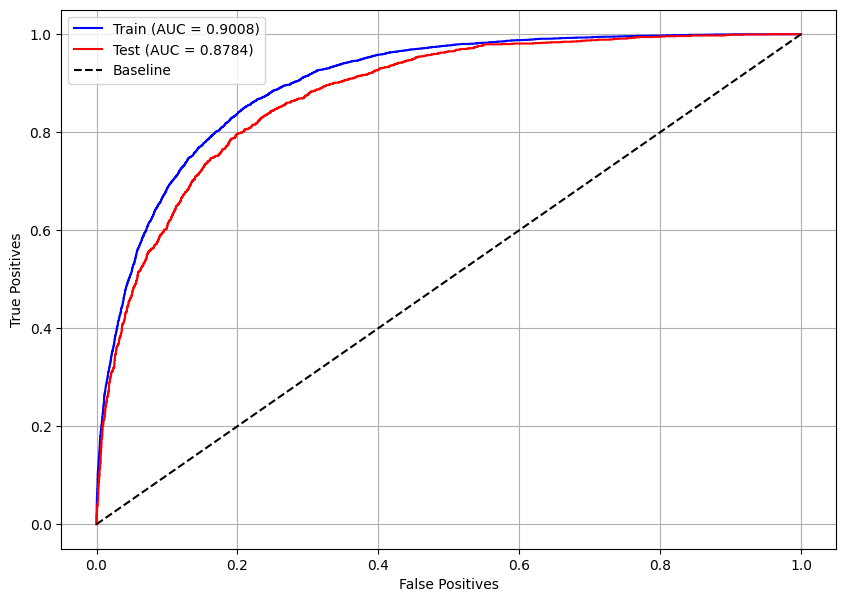

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 2.422}, colsample_bytree=0.7,
               learning_rate=0.12, max_depth=4, min_child_weight=3,
               n_estimators=150, random_state=7, verbose=-1)


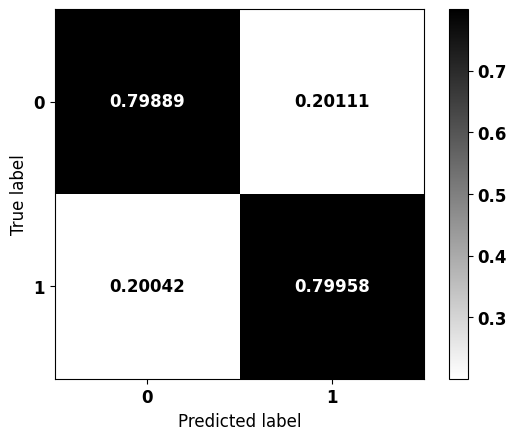


              precision    recall  f1-score   support

           0    0.91416   0.79889   0.85265      5052
           1    0.59810   0.79958   0.68432      1891

    accuracy                        0.79908      6943
   macro avg    0.75613   0.79923   0.76848      6943
weighted avg    0.82808   0.79908   0.80680      6943



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

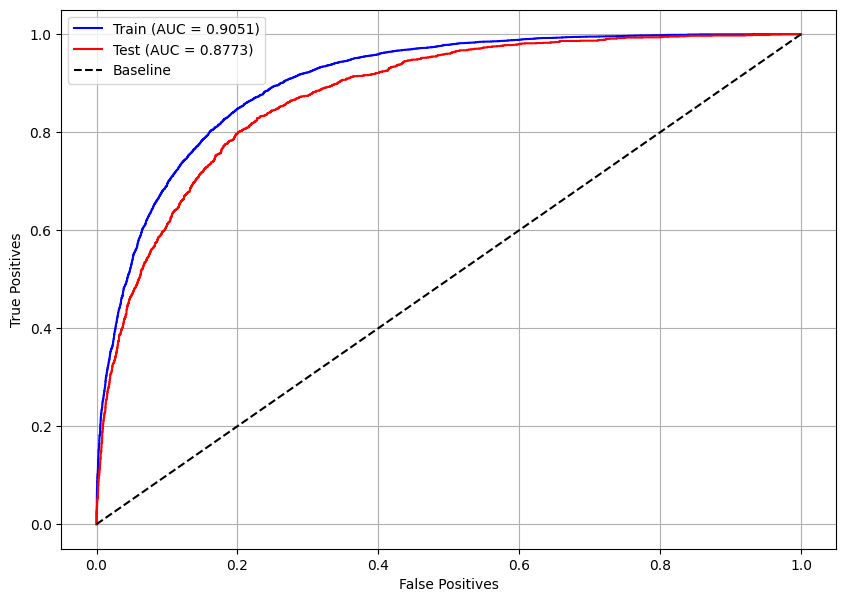

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


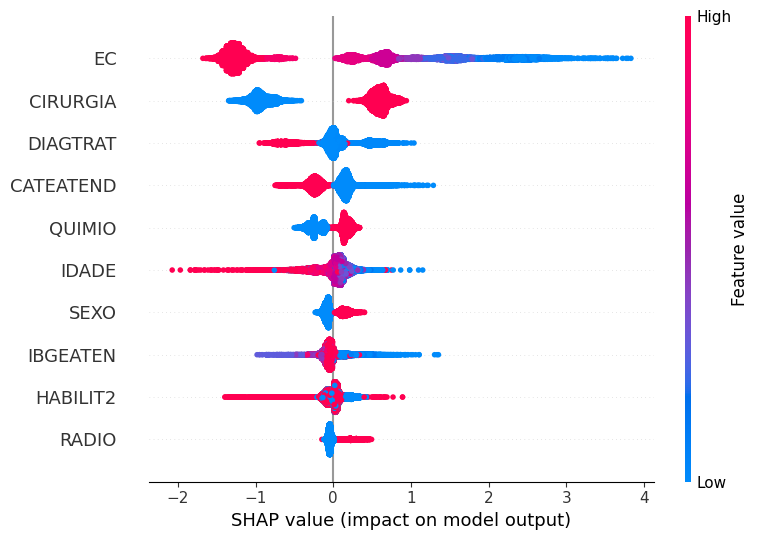

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7948, Optuna = 0.7976

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7976, Optuna = 0.7991

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 2.422}, colsample_bytree=0.7,
               learning_rate=0.12, max_depth=4, min_child_weight=3,
               n_estimators=150, random_state=7, verbose=-1)

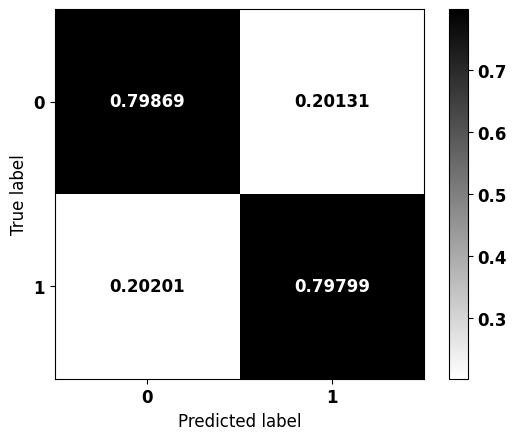


              precision    recall  f1-score   support

           0    0.91352   0.79869   0.85225      5052
           1    0.59739   0.79799   0.68327      1891

    accuracy                        0.79850      6943
   macro avg    0.75545   0.79834   0.76776      6943
weighted avg    0.82741   0.79850   0.80623      6943



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

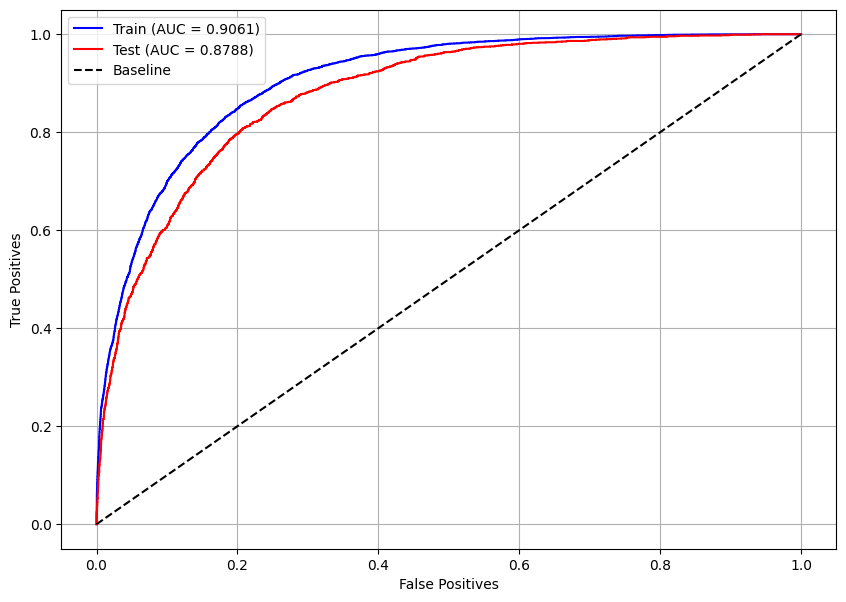

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 2.422}, colsample_bytree=0.7,
               learning_rate=0.12, max_depth=4, min_child_weight=3,
               n_estimators=150, random_state=7, verbose=-1)


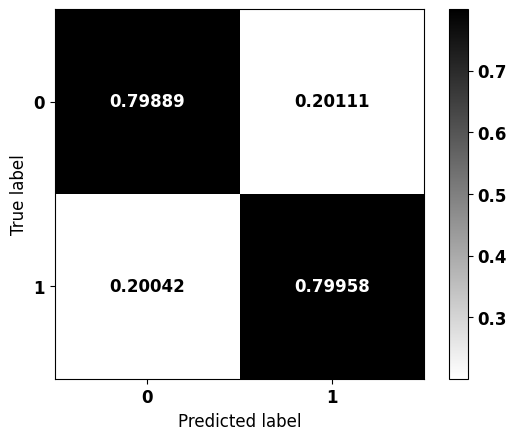


              precision    recall  f1-score   support

           0    0.91416   0.79889   0.85265      5052
           1    0.59810   0.79958   0.68432      1891

    accuracy                        0.79908      6943
   macro avg    0.75613   0.79923   0.76848      6943
weighted avg    0.82808   0.79908   0.80680      6943



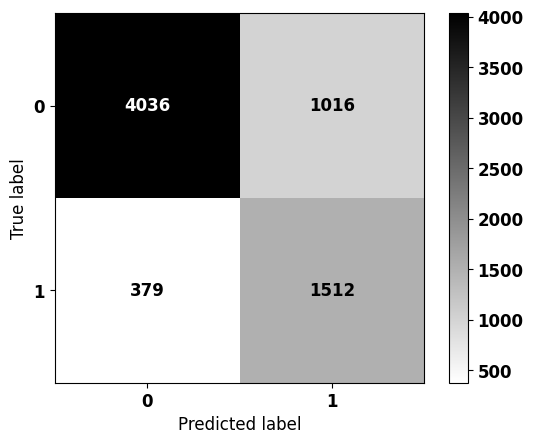


              precision    recall  f1-score   support

           0    0.91416   0.79889   0.85265      5052
           1    0.59810   0.79958   0.68432      1891

    accuracy                        0.79908      6943
   macro avg    0.75613   0.79923   0.76848      6943
weighted avg    0.82808   0.79908   0.80680      6943



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

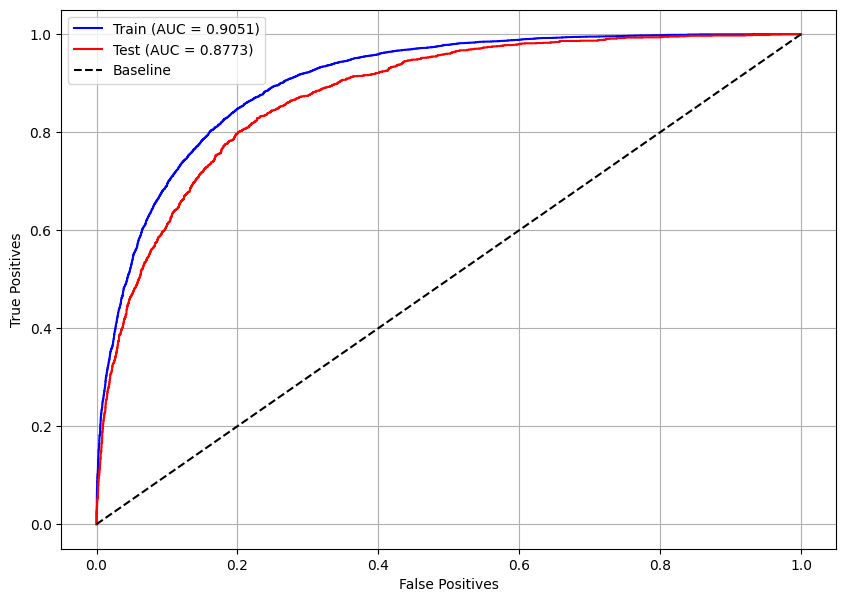

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

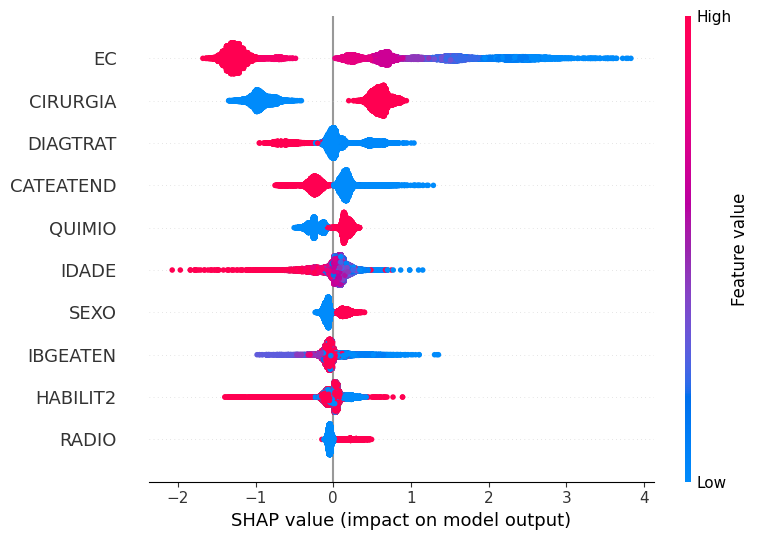

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


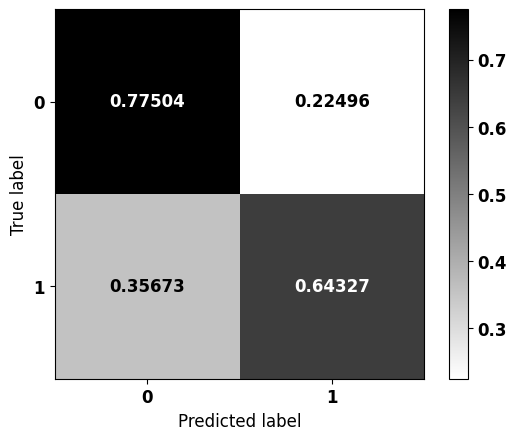


              precision    recall  f1-score   support

           0    0.75810   0.77504   0.76648      3534
           1    0.66470   0.64327   0.65381      2450

    accuracy                        0.72109      5984
   macro avg    0.71140   0.70915   0.71014      5984
weighted avg    0.71986   0.72109   0.72035      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


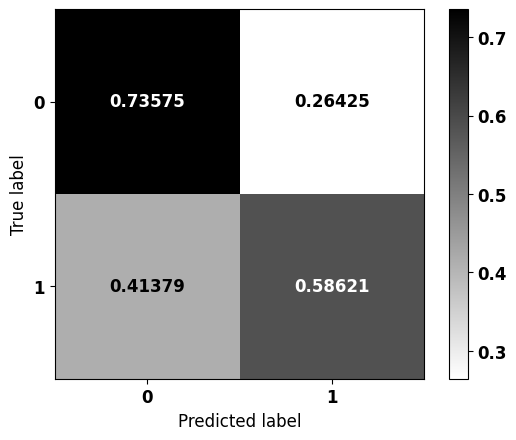


              precision    recall  f1-score   support

           0    0.83562   0.73575   0.78251       912
           1    0.43692   0.58621   0.50067       319

    accuracy                        0.69699      1231
   macro avg    0.63627   0.66098   0.64159      1231
weighted avg    0.73230   0.69699   0.70947      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


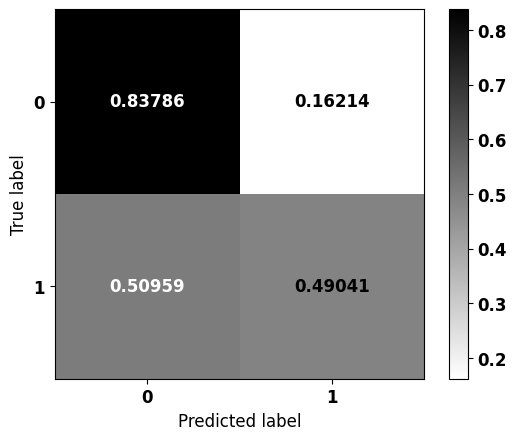


              precision    recall  f1-score   support

           0    0.91375   0.83786   0.87416      3022
           1    0.31944   0.49041   0.38688       469

    accuracy                        0.79118      3491
   macro avg    0.61660   0.66413   0.63052      3491
weighted avg    0.83391   0.79118   0.80869      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


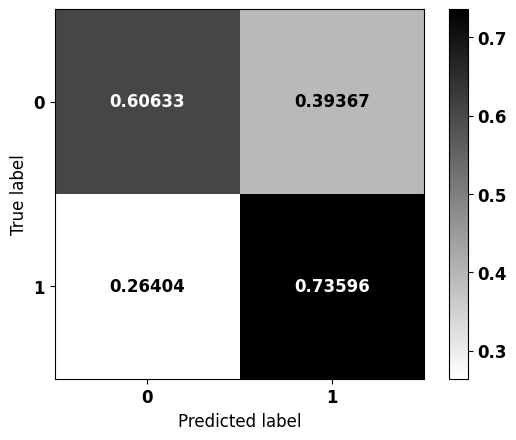


              precision    recall  f1-score   support

           0    0.74033   0.60633   0.66667       221
           1    0.60092   0.73596   0.66162       178

    accuracy                        0.66416       399
   macro avg    0.67062   0.67114   0.66414       399
weighted avg    0.67814   0.66416   0.66441       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


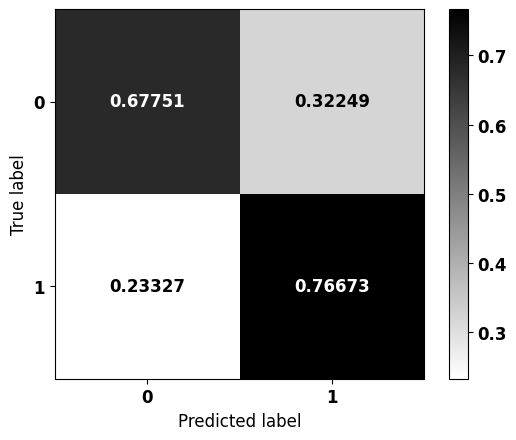


              precision    recall  f1-score   support

           0    0.70144   0.67751   0.68926      6273
           1    0.74614   0.76673   0.75630      7755

    accuracy                        0.72683     14028
   macro avg    0.72379   0.72212   0.72278     14028
weighted avg    0.72615   0.72683   0.72632     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


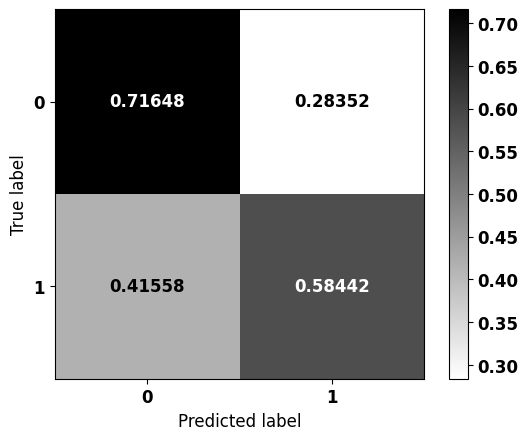


              precision    recall  f1-score   support

           0    0.59365   0.71648   0.64931       261
           1    0.70866   0.58442   0.64057       308

    accuracy                        0.64499       569
   macro avg    0.65116   0.65045   0.64494       569
weighted avg    0.65591   0.64499   0.64458       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Small Intestine**

In [ ]:
# Missing values
df_delg.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the small intestine cancer dataset
corr_matrix = df_delg.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3      1.000000
obito_geral         0.726068
sobrevida_ano5      0.703268
sobrevida_ano1      0.679576
CIRURGIA            0.225027
NENHUM              0.221980
TRATCONS            0.219049
DIAGTRAT            0.218934
IDADE               0.169769
CATEATEND           0.166750
ESCOLARI_preench    0.097944
RADIO               0.071953
ANODIAG             0.068609
DIAGPREV            0.060149
HORMONIO            0.058971
presenca_rec        0.058500
OUTROS              0.054935
QUIMIO              0.047308
IMUNO               0.039499
CONSDIAG            0.037890
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_delg.sobrevida_ano3.value_counts()

sobrevida_ano3
0    883
1    711
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_delg,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (1195, 23), X_test = (399, 23)
y_train = (1195,), y_test = (399,)


In [ ]:
# Training dataset for Small Intestine Cancer

# Create a DataFrame for training data with selected features
delg_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Delgado' for Small Intestine Cancer)
delg_treino['TOPOGRUP'] = 'Delgado'

# Add the target variable (survival after 3 years) to the training dataset
delg_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Small Intestine Cancer

# Create a DataFrame for testing data with selected features
delg_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Delgado' for Small Intestine Cancer)
delg_teste['TOPOGRUP'] = 'Delgado'

# Add the target variable (survival after 3 years) to the testing dataset
delg_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

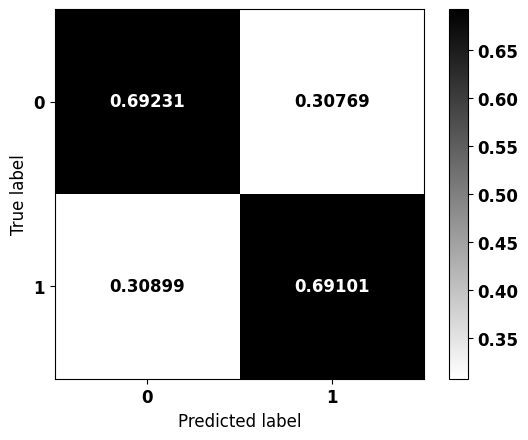


              precision    recall  f1-score   support

           0    0.73558   0.69231   0.71329       221
           1    0.64398   0.69101   0.66667       178

    accuracy                        0.69173       399
   macro avg    0.68978   0.69166   0.68998       399
weighted avg    0.69471   0.69173   0.69249       399



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=2,            # Set maximum tree depth to 2
                    n_estimators=50,        # Set number of trees to 50
                    scale_pos_weight=1.1,   # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

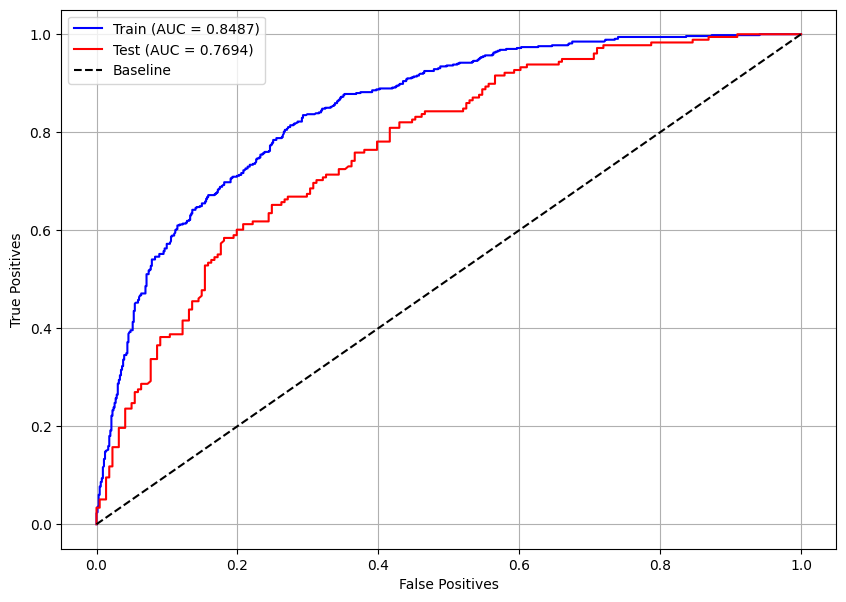

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

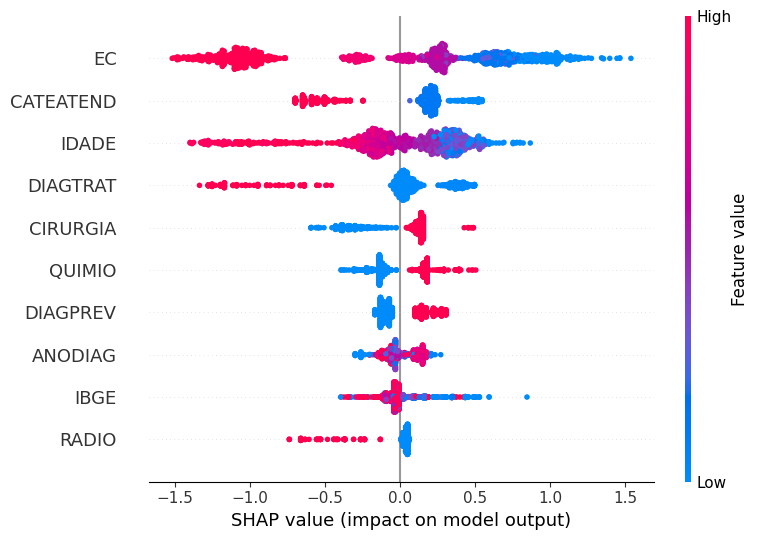

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 85,
 'max_depth': 3,
 'learning_rate': 0.1,
 'gamma': 0.3,
 'min_child_weight': 3,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

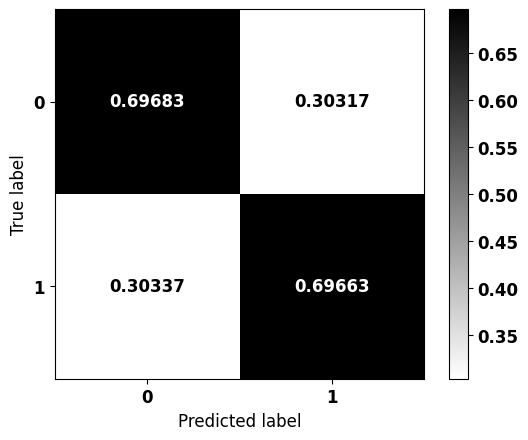


              precision    recall  f1-score   support

           0    0.74038   0.69683   0.71795       221
           1    0.64921   0.69663   0.67209       178

    accuracy                        0.69674       399
   macro avg    0.69480   0.69673   0.69502       399
weighted avg    0.69971   0.69674   0.69749       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.101  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

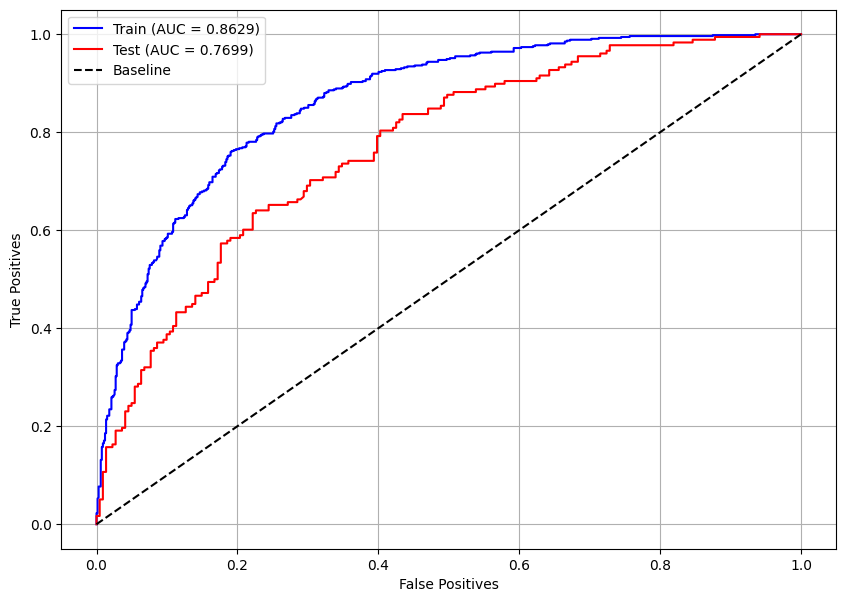

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 50,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.3,
 'min_child_weight': 1,
 'colsample_bytree': 0.3}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

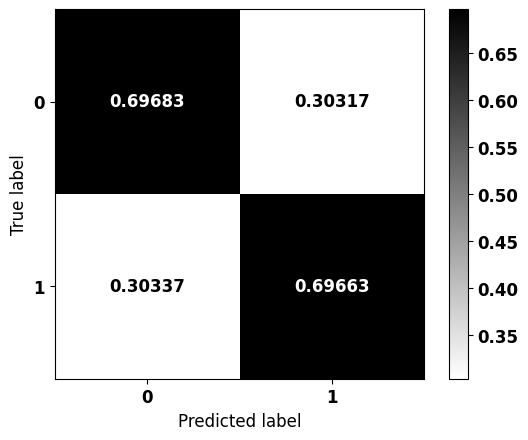


              precision    recall  f1-score   support

           0    0.74038   0.69683   0.71795       221
           1    0.64921   0.69663   0.67209       178

    accuracy                        0.69674       399
   macro avg    0.69480   0.69673   0.69502       399
weighted avg    0.69971   0.69674   0.69749       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.114  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

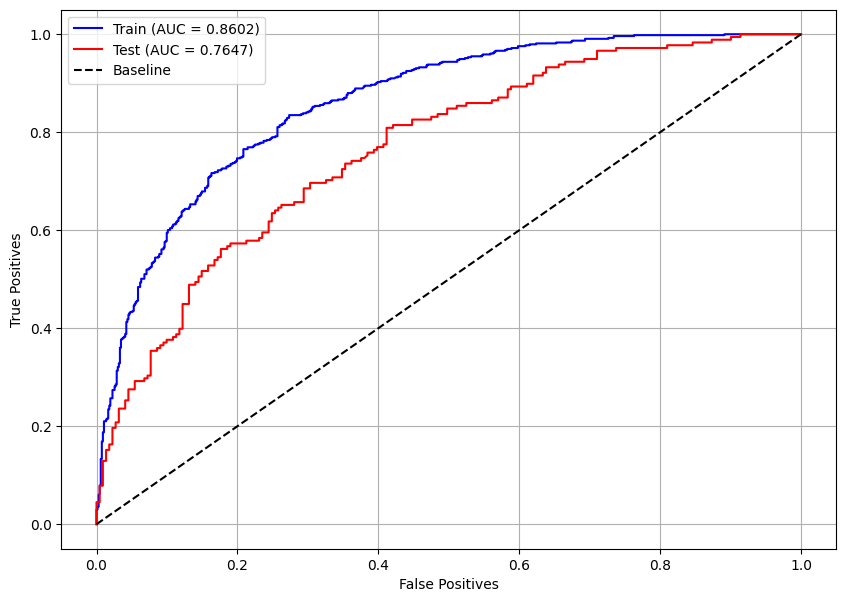

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 74,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 1,
 'colsample_bytree': 0.3}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

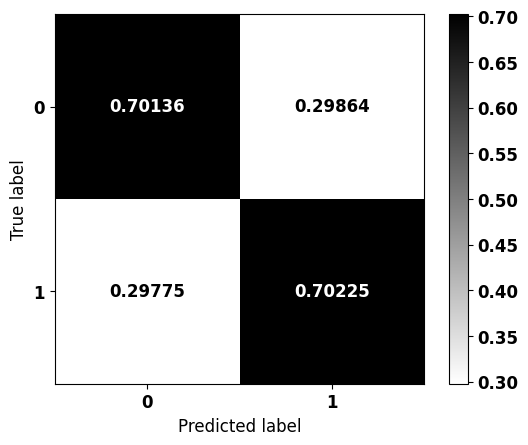


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 1.126  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

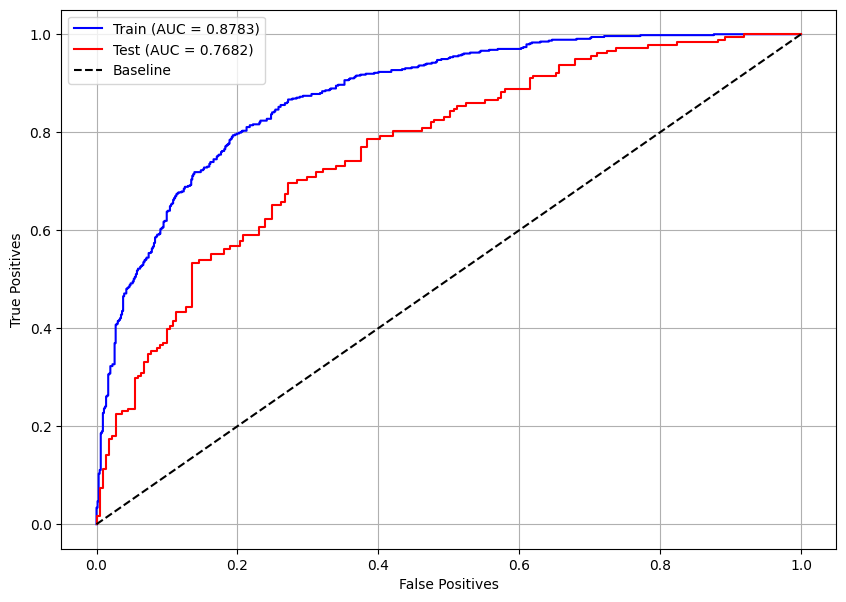

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.3, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=74, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


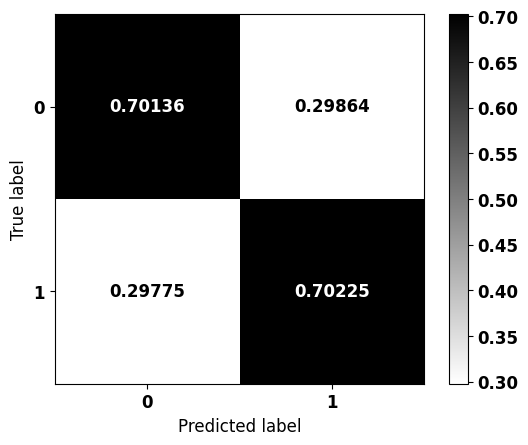


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

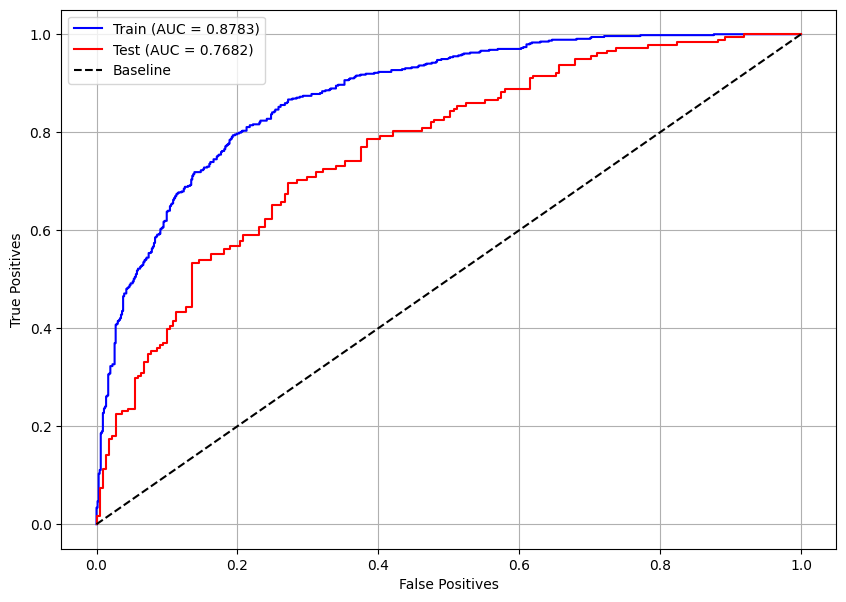

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

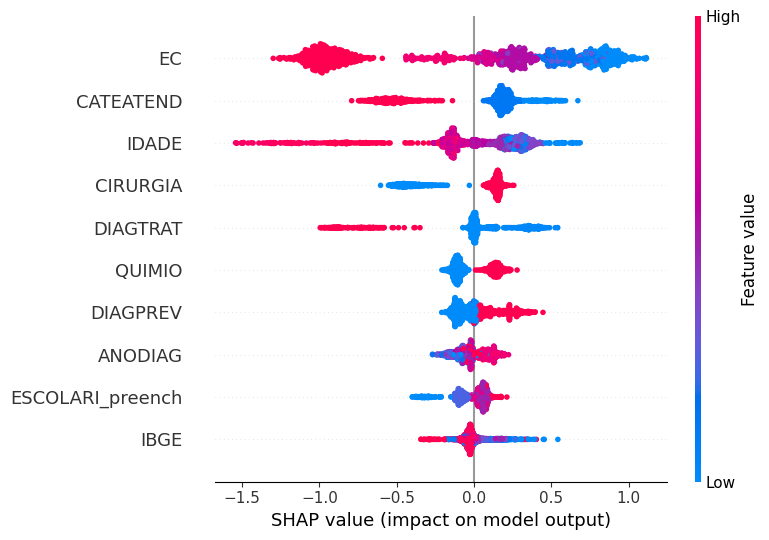

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

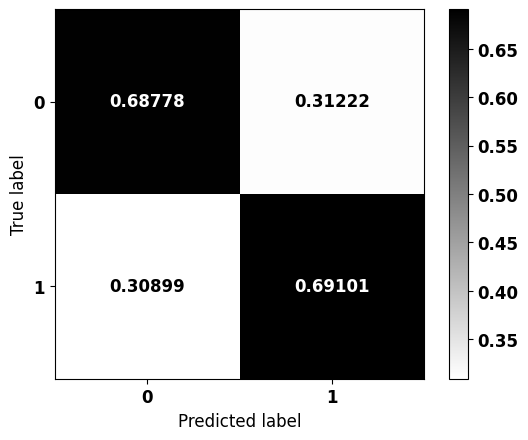


              precision    recall  f1-score   support

           0    0.73430   0.68778   0.71028       221
           1    0.64062   0.69101   0.66486       178

    accuracy                        0.68922       399
   macro avg    0.68746   0.68940   0.68757       399
weighted avg    0.69251   0.68922   0.69002       399



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=2,                  # Set maximum tree depth to 2
                      n_estimators=50,              # Set number of trees to 50
                      class_weight={0:1, 1:1.1041}, # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

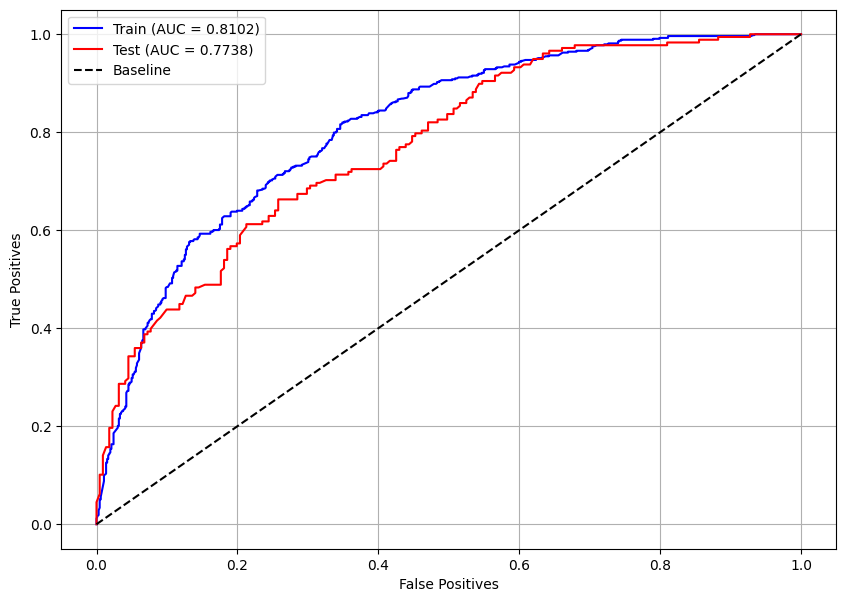

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


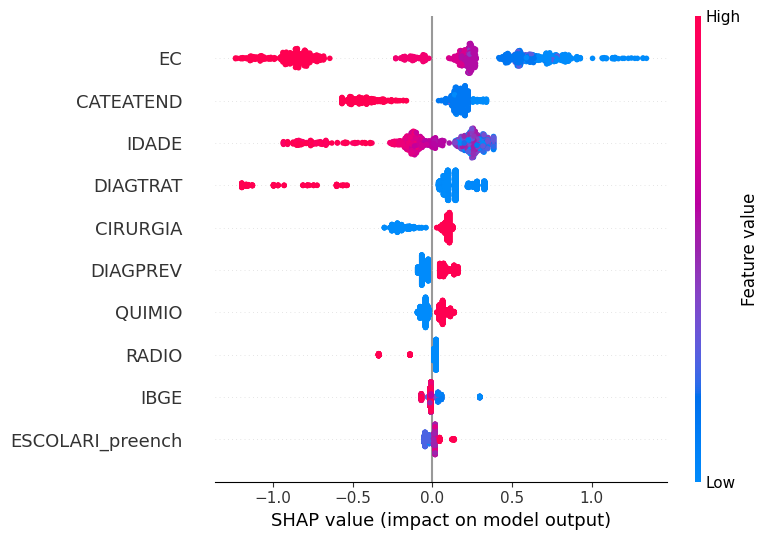

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 67,
 'max_depth': 3,
 'learning_rate': 0.14,
 'min_child_weight': 2,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

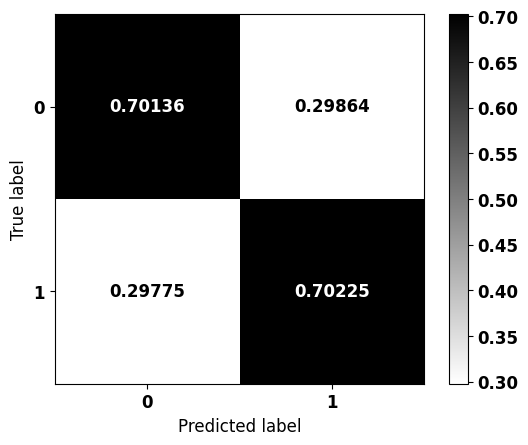


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.048}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

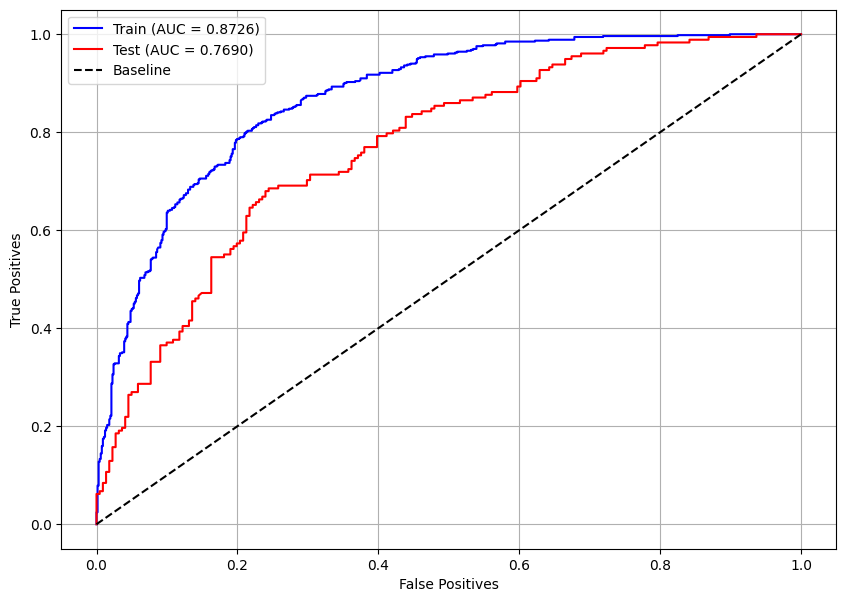

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 65,
 'max_depth': 3,
 'learning_rate': 0.13,
 'min_child_weight': 4,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

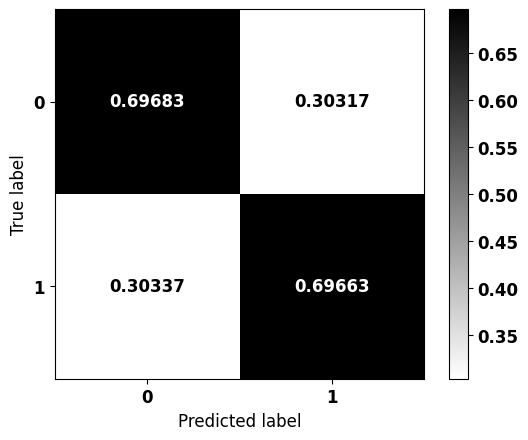


              precision    recall  f1-score   support

           0    0.74038   0.69683   0.71795       221
           1    0.64921   0.69663   0.67209       178

    accuracy                        0.69674       399
   macro avg    0.69480   0.69673   0.69502       399
weighted avg    0.69971   0.69674   0.69749       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.111}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

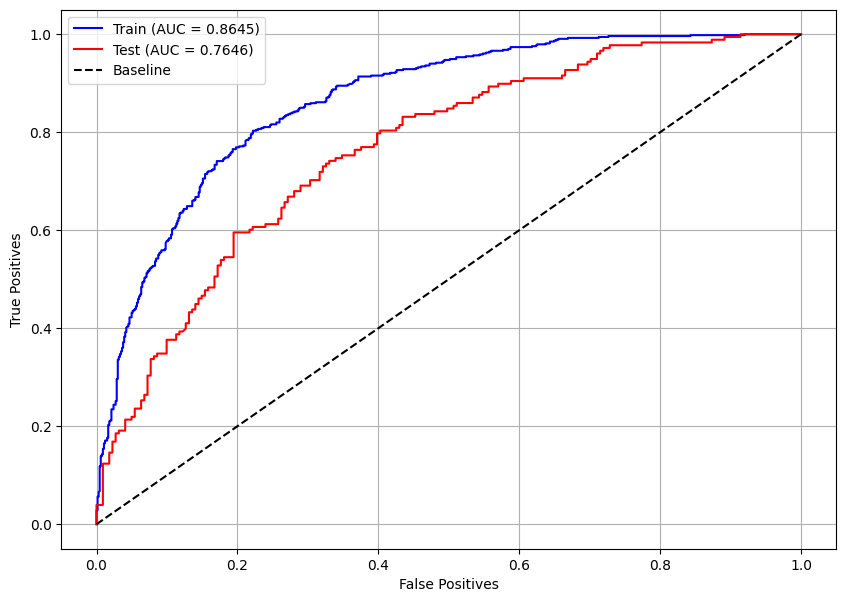

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 69,
 'max_depth': 3,
 'learning_rate': 0.09,
 'min_child_weight': 1,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1, 1.5, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

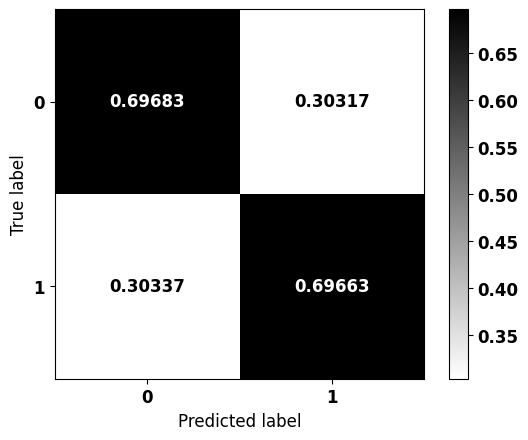


              precision    recall  f1-score   support

           0    0.74038   0.69683   0.71795       221
           1    0.64921   0.69663   0.67209       178

    accuracy                        0.69674       399
   macro avg    0.69480   0.69673   0.69502       399
weighted avg    0.69971   0.69674   0.69749       399



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:1.155}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

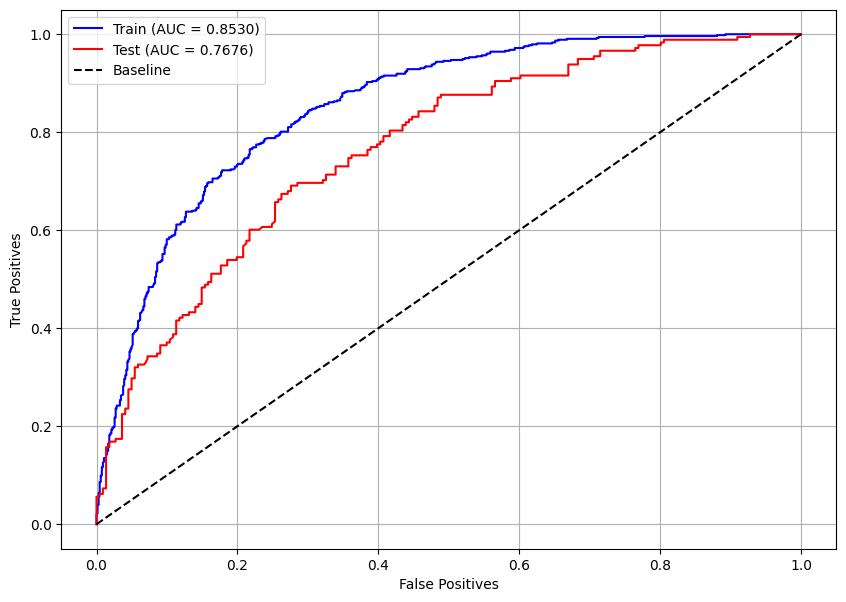

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 1.048}, colsample_bytree=0.6,
               learning_rate=0.14, max_depth=3, min_child_weight=2,
               n_estimators=67, random_state=7, verbose=-1)


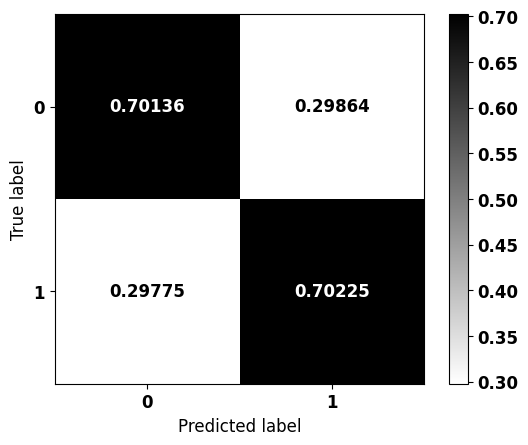


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

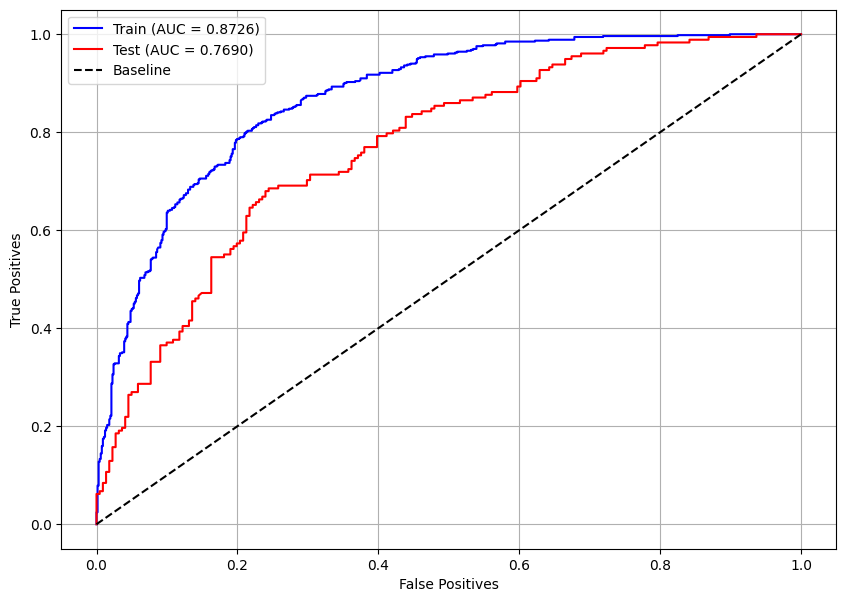

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


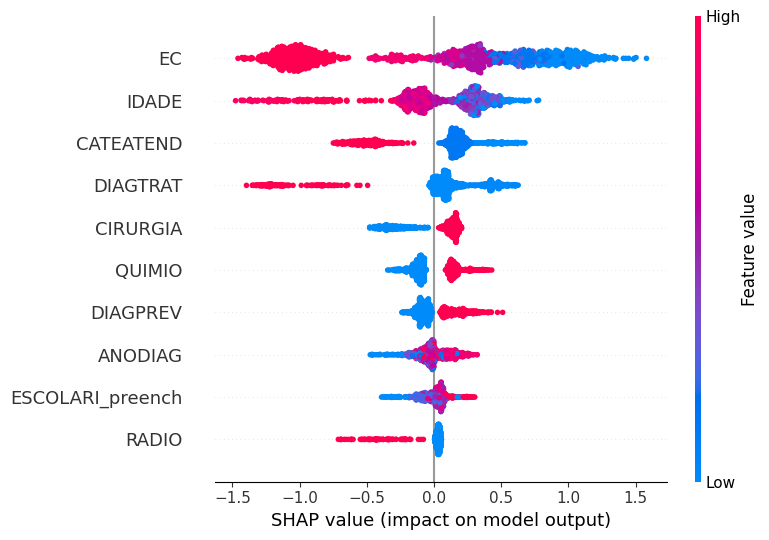

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.6917, Optuna = 0.7018

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.6892, Optuna = 0.7018

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 1.048}, colsample_bytree=0.6,
               learning_rate=0.14, max_depth=3, min_child_weight=2,
               n_estimators=67, random_state=7, verbose=-1)

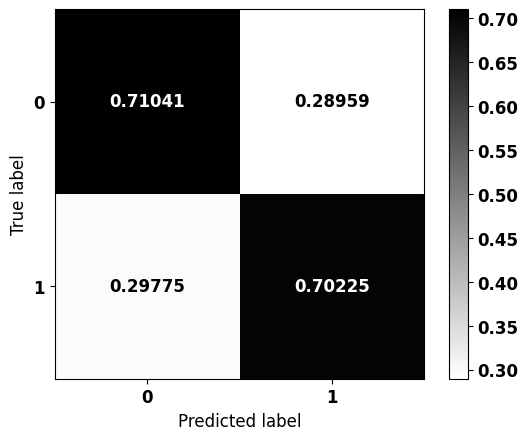


              precision    recall  f1-score   support

           0    0.74762   0.71041   0.72854       221
           1    0.66138   0.70225   0.68120       178

    accuracy                        0.70677       399
   macro avg    0.70450   0.70633   0.70487       399
weighted avg    0.70914   0.70677   0.70742       399



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

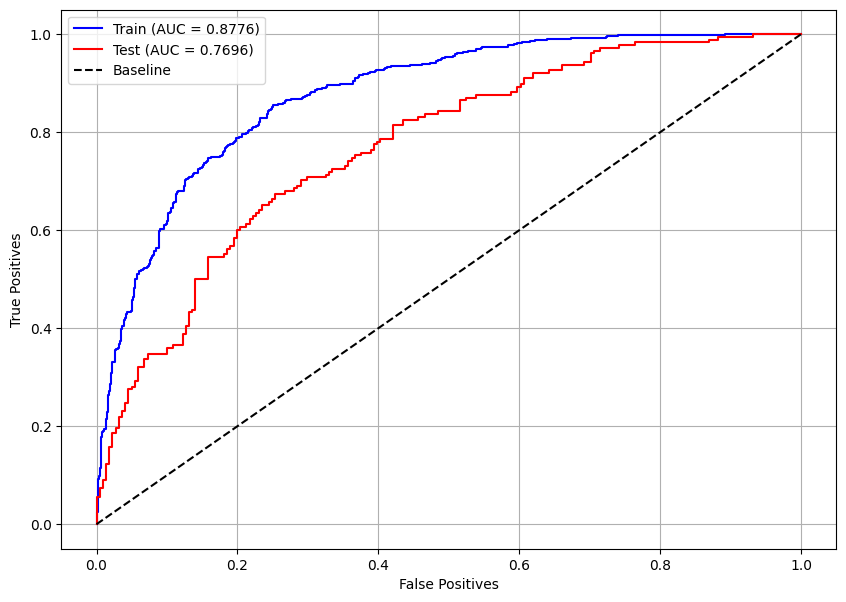

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.3, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=74, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


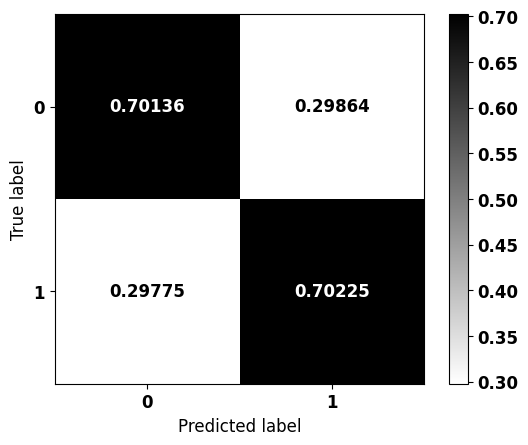


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



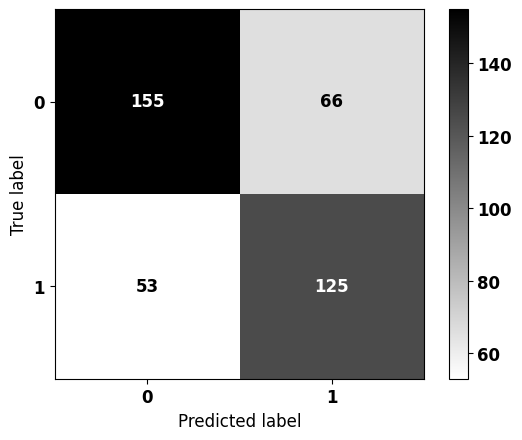


              precision    recall  f1-score   support

           0    0.74519   0.70136   0.72261       221
           1    0.65445   0.70225   0.67751       178

    accuracy                        0.70175       399
   macro avg    0.69982   0.70180   0.70006       399
weighted avg    0.70471   0.70175   0.70249       399



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

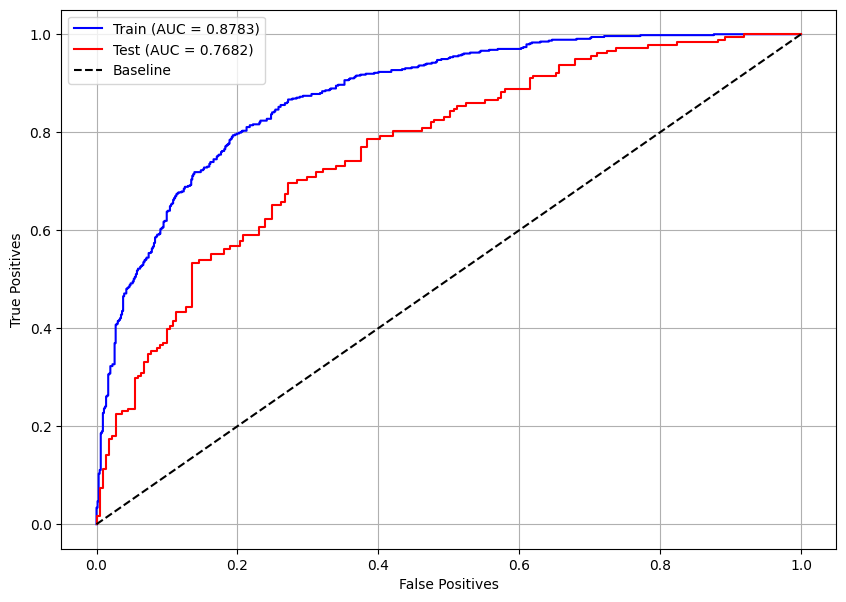

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

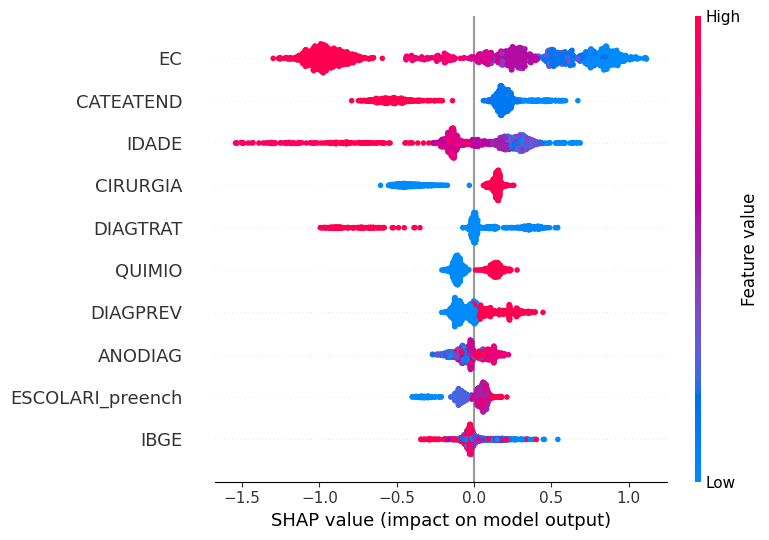

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


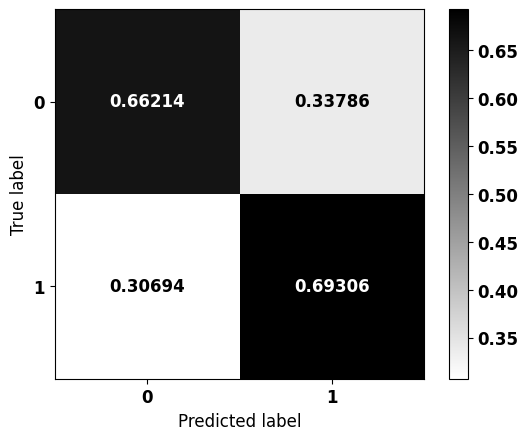


              precision    recall  f1-score   support

           0    0.75679   0.66214   0.70631      3534
           1    0.58714   0.69306   0.63572      2450

    accuracy                        0.67480      5984
   macro avg    0.67196   0.67760   0.67101      5984
weighted avg    0.68733   0.67480   0.67741      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


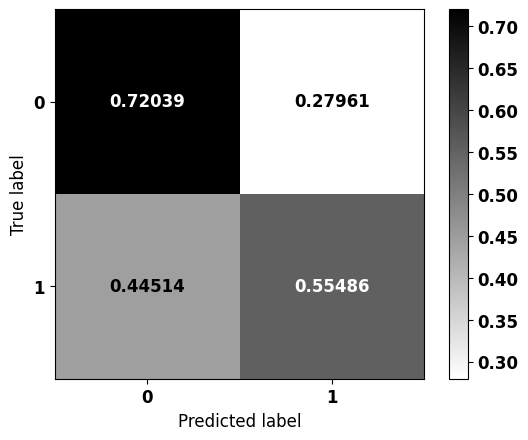


              precision    recall  f1-score   support

           0    0.82228   0.72039   0.76797       912
           1    0.40972   0.55486   0.47137       319

    accuracy                        0.67750      1231
   macro avg    0.61600   0.63763   0.61967      1231
weighted avg    0.71537   0.67750   0.69111      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


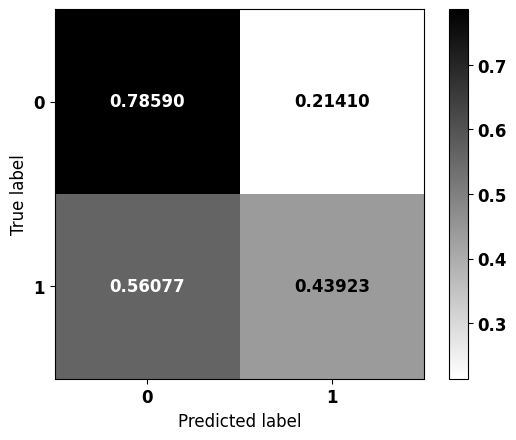


              precision    recall  f1-score   support

           0    0.90030   0.78590   0.83922      3022
           1    0.24150   0.43923   0.31165       469

    accuracy                        0.73933      3491
   macro avg    0.57090   0.61257   0.57544      3491
weighted avg    0.81180   0.73933   0.76835      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


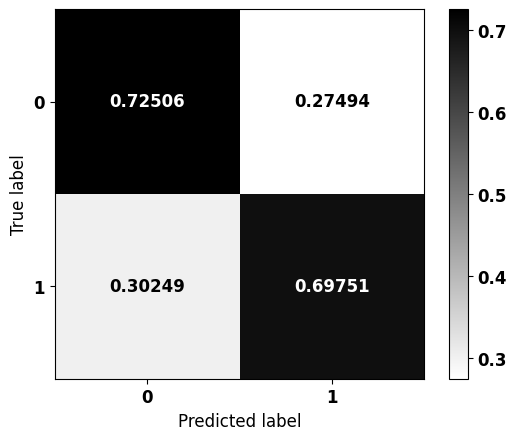


              precision    recall  f1-score   support

           0    0.86494   0.72506   0.78884      5052
           1    0.48708   0.69751   0.57360      1891

    accuracy                        0.71756      6943
   macro avg    0.67601   0.71129   0.68122      6943
weighted avg    0.76202   0.71756   0.73022      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


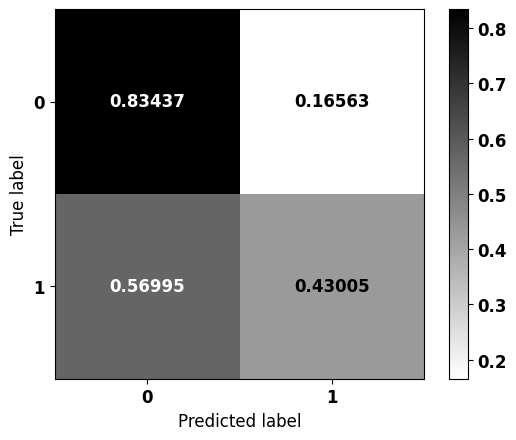


              precision    recall  f1-score   support

           0    0.54216   0.83437   0.65725      6273
           1    0.76246   0.43005   0.54992      7755

    accuracy                        0.61085     14028
   macro avg    0.65231   0.63221   0.60359     14028
weighted avg    0.66395   0.61085   0.59792     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


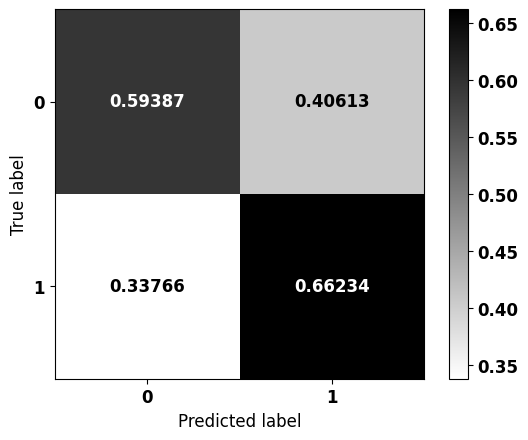


              precision    recall  f1-score   support

           0    0.59846   0.59387   0.59615       261
           1    0.65806   0.66234   0.66019       308

    accuracy                        0.63093       569
   macro avg    0.62826   0.62810   0.62817       569
weighted avg    0.63072   0.63093   0.63082       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Colorectal**

In [ ]:
# Missing values
df_colo.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the colorectal cancer dataset
corr_matrix = df_colo.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3        1.000000
sobrevida_ano5        0.685366
obito_geral           0.672258
sobrevida_ano1        0.616970
CIRURGIA              0.272532
TRATCONS              0.189798
DIAGTRAT              0.188500
NENHUM                0.188264
IDADE                 0.106721
CATEATEND             0.092419
ESCOLARI_preench      0.073127
DIAGPREV              0.063064
OUTROS                0.060598
QUIMIO                0.055128
SEXO                  0.039709
IBGE_idem_IBGEATEN    0.030832
IBGEATEN              0.030181
HORMONIO              0.029209
RADIO                 0.024731
ANODIAG               0.021351
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_colo.sobrevida_ano3.value_counts()

sobrevida_ano3
1    31019
0    25092
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_colo,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (42083, 23), X_test = (14028, 23)
y_train = (42083,), y_test = (14028,)


In [ ]:
# Training dataset for Colorectal Cancer

# Create a DataFrame for training data with selected features
colo_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the target variable (survival after 3 years) to the training dataset
colo_treino['TOPOGRUP'] = 'Colorretal'

# Add the target variable (survival after 3 years) to the training dataset
colo_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Colorectal Cancer

# Create a DataFrame for testing data with selected features
colo_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Colorretal' for Colorectal Cancer)
colo_teste['TOPOGRUP'] = 'Colorretal'

# Add the target variable (survival after 3 years) to the testing dataset
colo_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

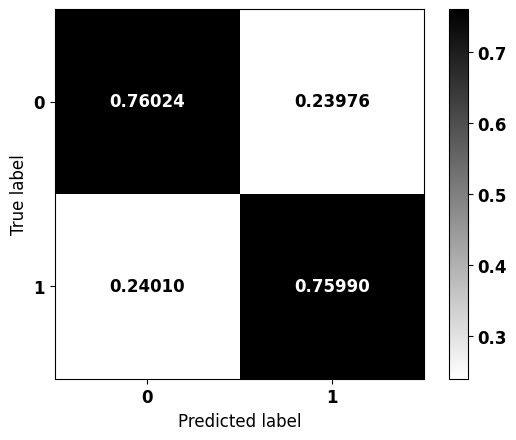


              precision    recall  f1-score   support

           0    0.71920   0.76024   0.73915      6273
           1    0.79667   0.75990   0.77785      7755

    accuracy                        0.76005     14028
   macro avg    0.75794   0.76007   0.75850     14028
weighted avg    0.76203   0.76005   0.76055     14028



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=4,            # Set maximum tree depth to 4
                    scale_pos_weight=0.645, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

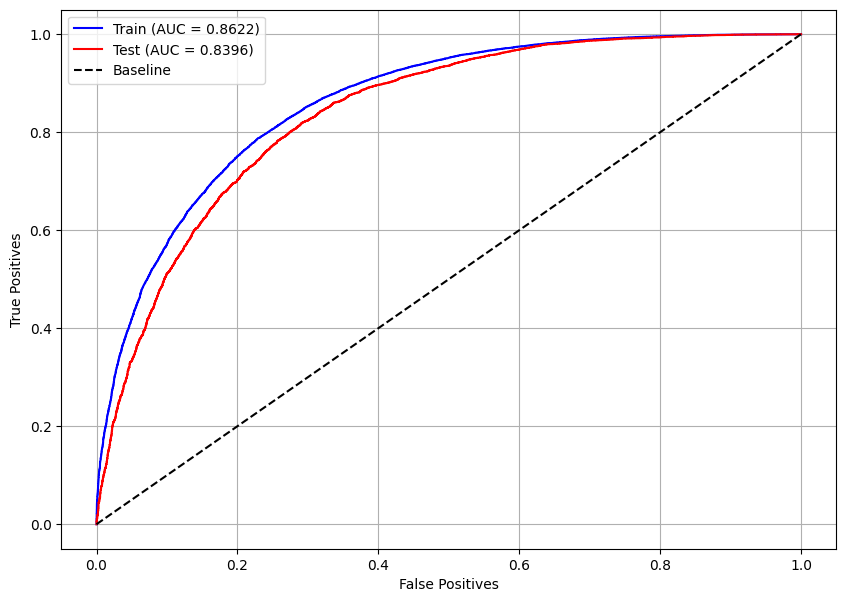

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

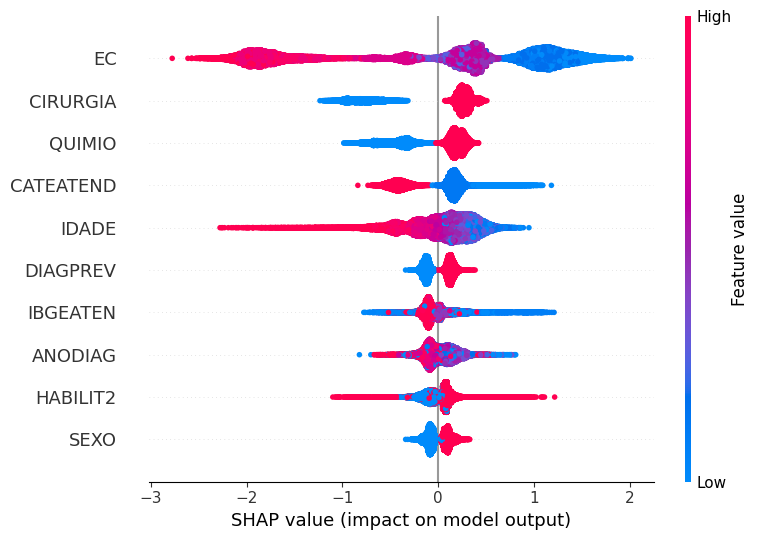

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 107,
 'max_depth': 6,
 'learning_rate': 0.1,
 'gamma': 0.3,
 'min_child_weight': 5,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.63, 0.66, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

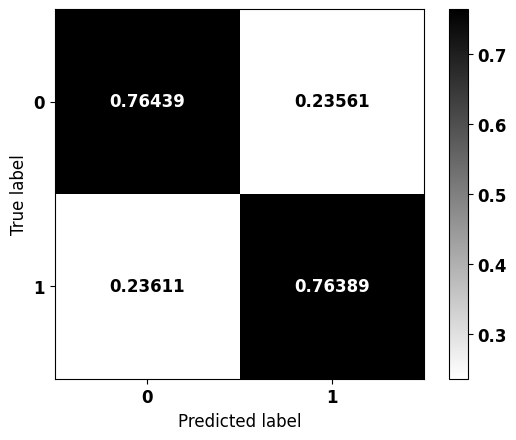


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6488  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

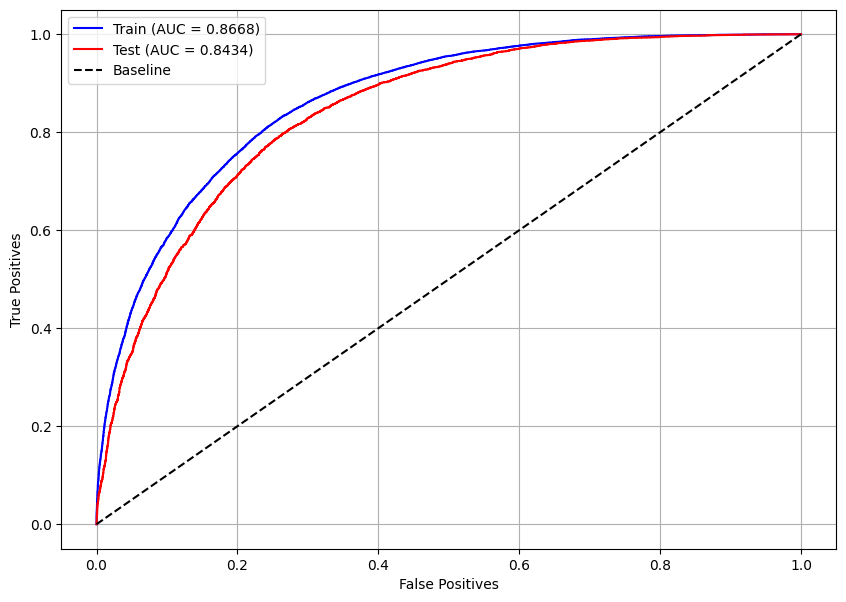

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 102,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.645, 0.67, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

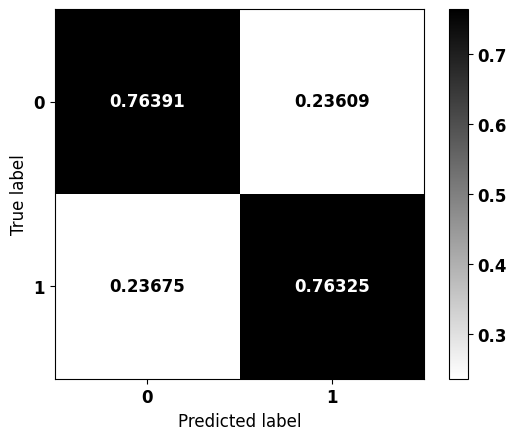


              precision    recall  f1-score   support

           0    0.72299   0.76391   0.74289      6273
           1    0.79986   0.76325   0.78113      7755

    accuracy                        0.76354     14028
   macro avg    0.76143   0.76358   0.76201     14028
weighted avg    0.76549   0.76354   0.76403     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6518  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

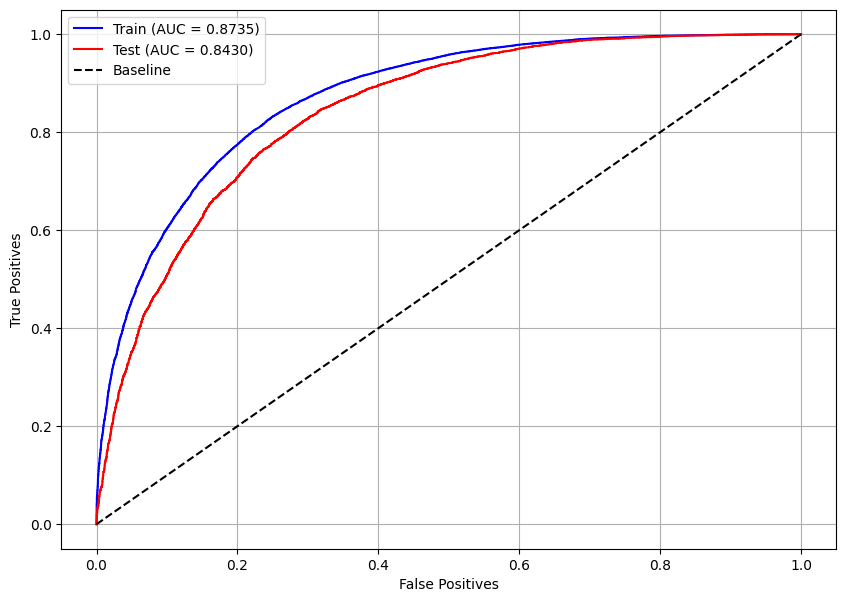

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 105,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.64, 0.66, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

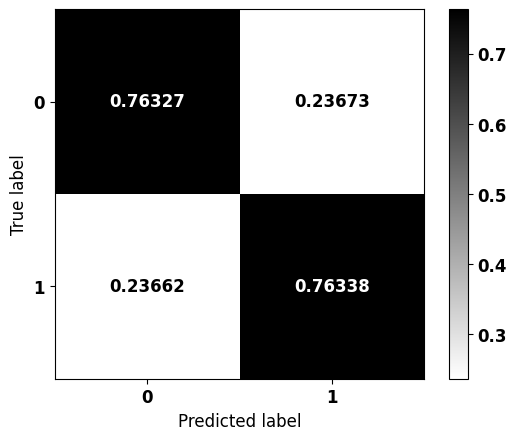


              precision    recall  f1-score   support

           0    0.72294   0.76327   0.74256      6273
           1    0.79946   0.76338   0.78100      7755

    accuracy                        0.76333     14028
   macro avg    0.76120   0.76332   0.76178     14028
weighted avg    0.76524   0.76333   0.76381     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6517  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

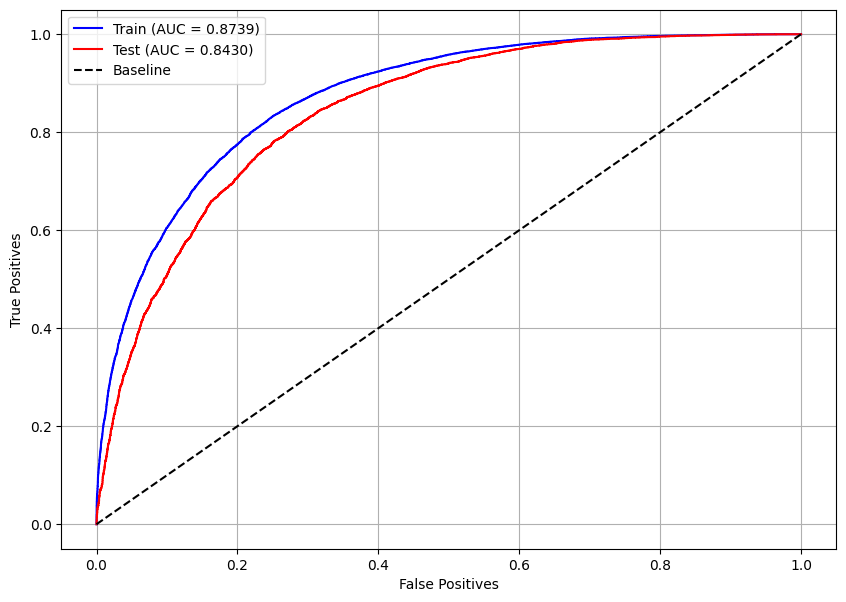

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=107, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


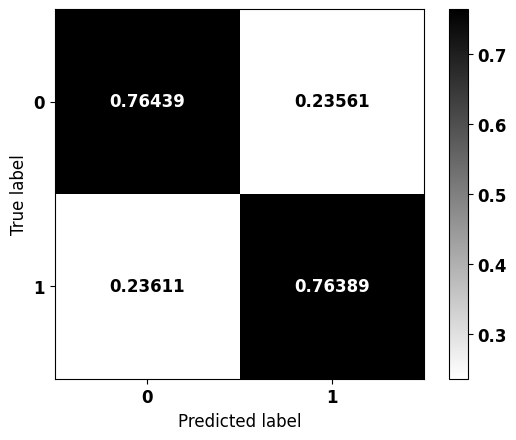


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

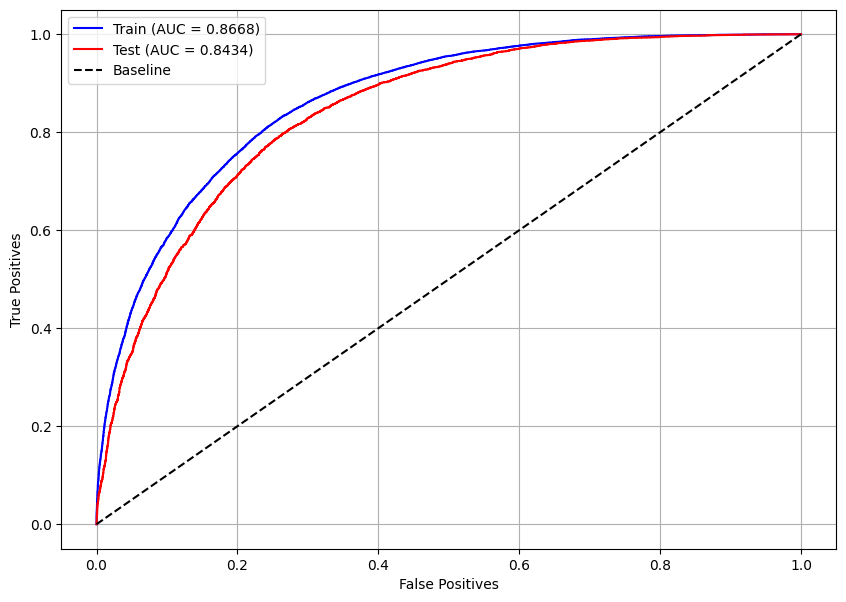

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

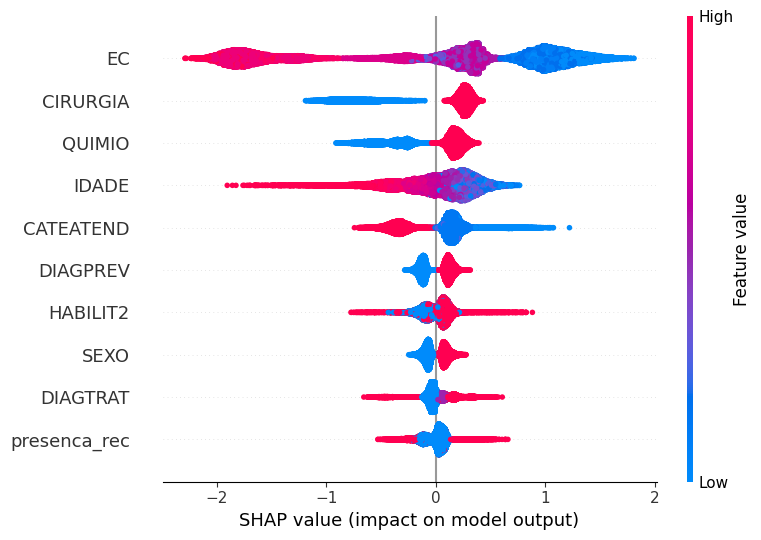

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

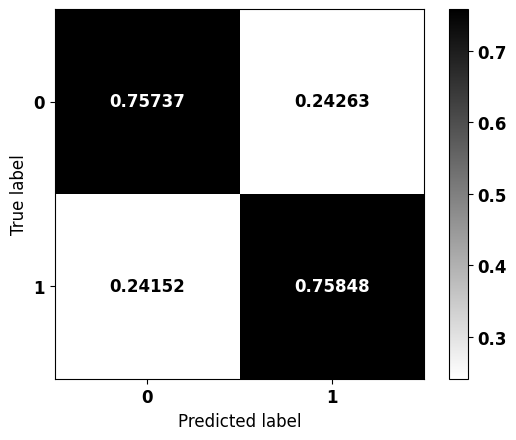


              precision    recall  f1-score   support

           0    0.71724   0.75737   0.73676      6273
           1    0.79444   0.75848   0.77604      7755

    accuracy                        0.75798     14028
   macro avg    0.75584   0.75793   0.75640     14028
weighted avg    0.75992   0.75798   0.75848     14028



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=10,                     # Set maximum tree depth to 10
                      class_weight={0: 1.4662, 1: 1},   # Adjust class imbalance using class_weight
                      random_state=seed,                # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

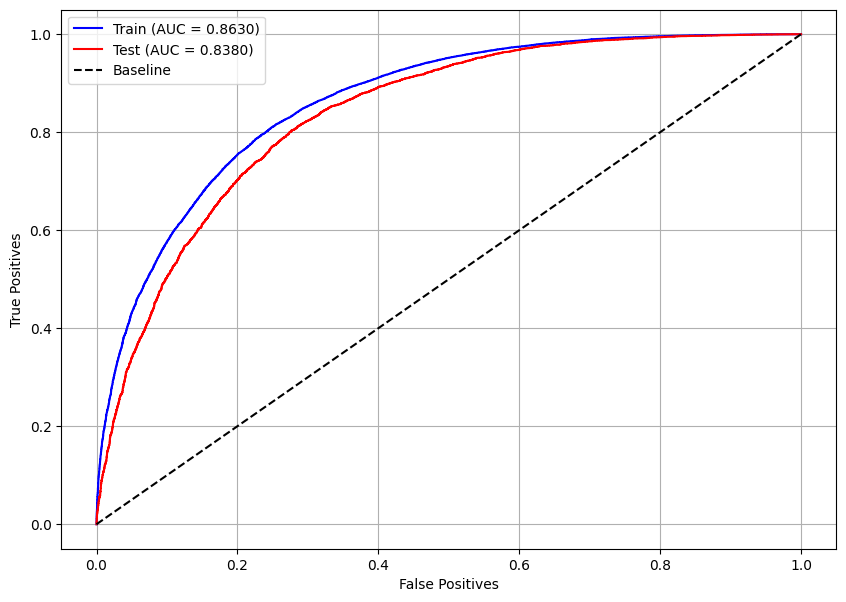

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


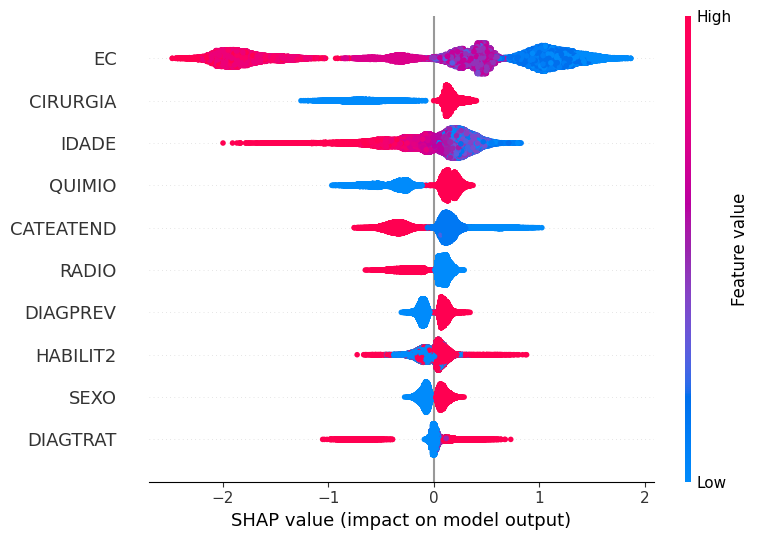

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 10)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 88,
 'max_depth': 6,
 'learning_rate': 0.16,
 'min_child_weight': 2,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.44, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

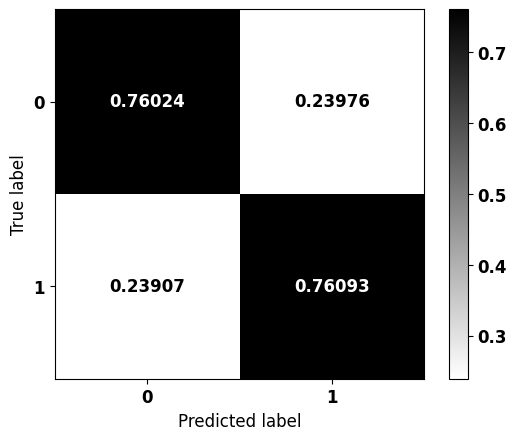


              precision    recall  f1-score   support

           0    0.72007   0.76024   0.73961      6273
           1    0.79689   0.76093   0.77850      7755

    accuracy                        0.76062     14028
   macro avg    0.75848   0.76059   0.75905     14028
weighted avg    0.76254   0.76062   0.76111     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4211, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

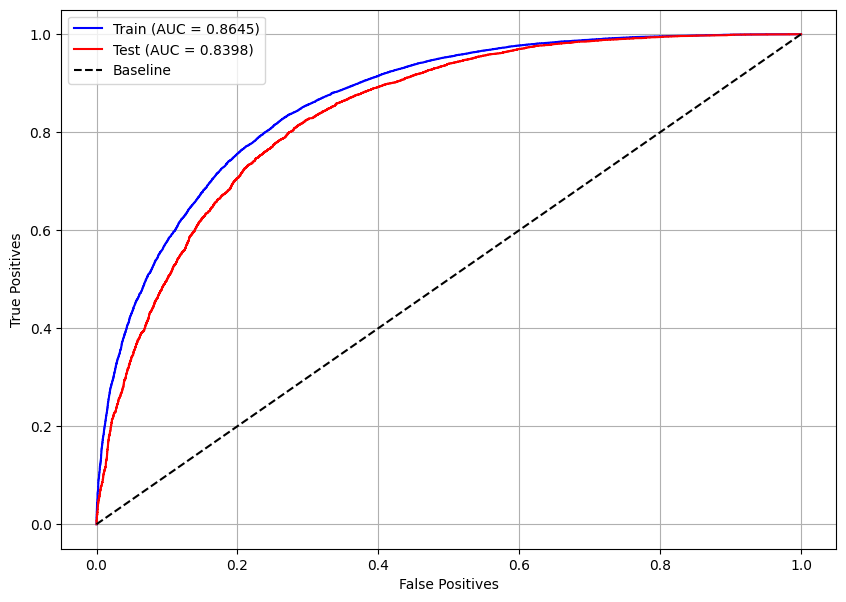

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 143,
 'max_depth': 10,
 'learning_rate': 0.12000000000000001,
 'min_child_weight': 1,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.425, 1.46, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

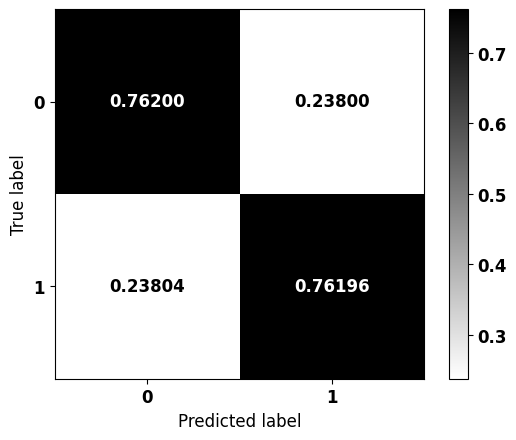


              precision    recall  f1-score   support

           0    0.72140   0.76200   0.74114      6273
           1    0.79830   0.76196   0.77971      7755

    accuracy                        0.76198     14028
   macro avg    0.75985   0.76198   0.76042     14028
weighted avg    0.76391   0.76198   0.76246     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4445, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

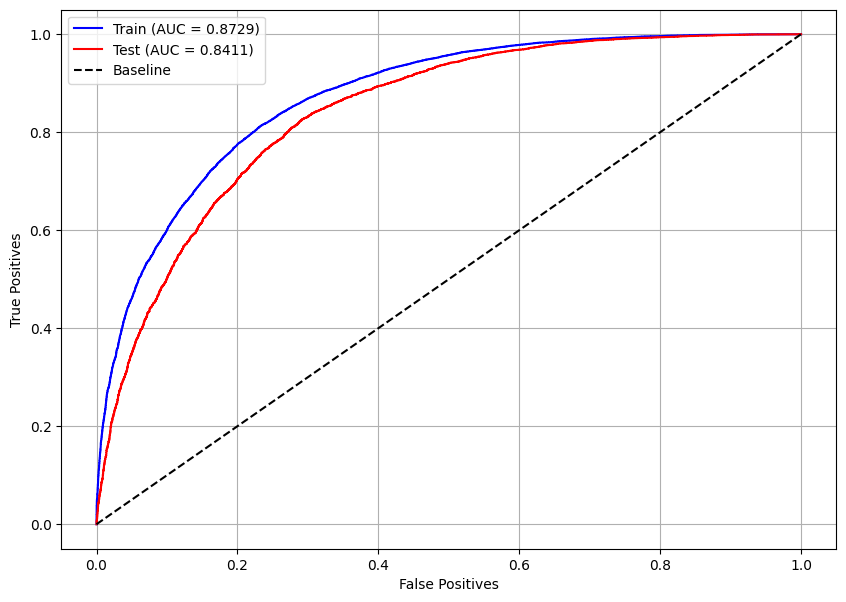

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 103,
 'max_depth': 7,
 'learning_rate': 0.11,
 'min_child_weight': 7,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.43, 1.45, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

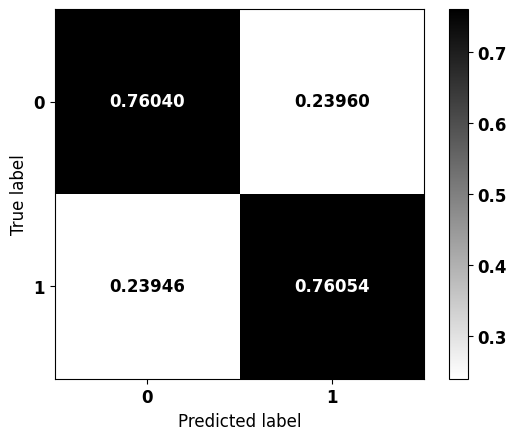


              precision    recall  f1-score   support

           0    0.71978   0.76040   0.73953      6273
           1    0.79692   0.76054   0.77831      7755

    accuracy                        0.76048     14028
   macro avg    0.75835   0.76047   0.75892     14028
weighted avg    0.76243   0.76048   0.76097     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4357, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

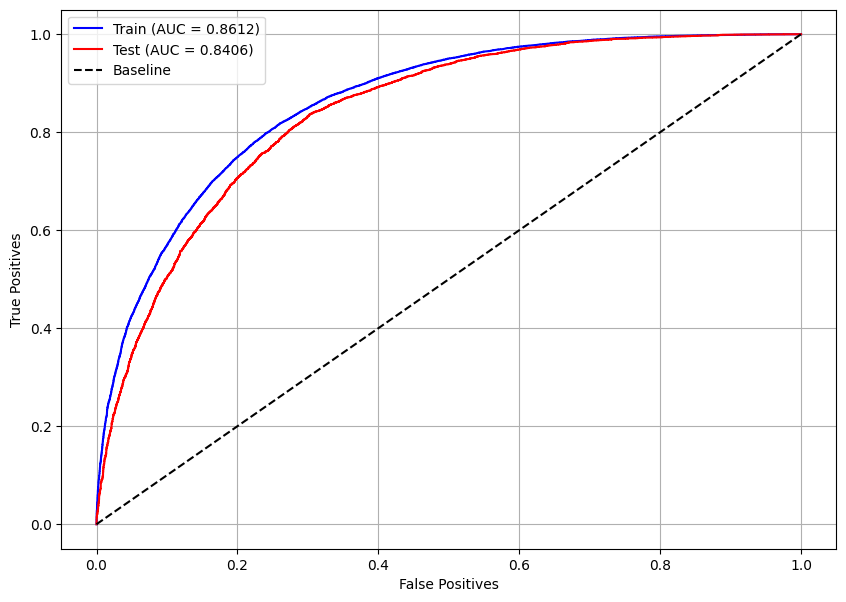

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1.4445, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=10, min_child_weight=1,
               n_estimators=143, random_state=7, verbose=-1)


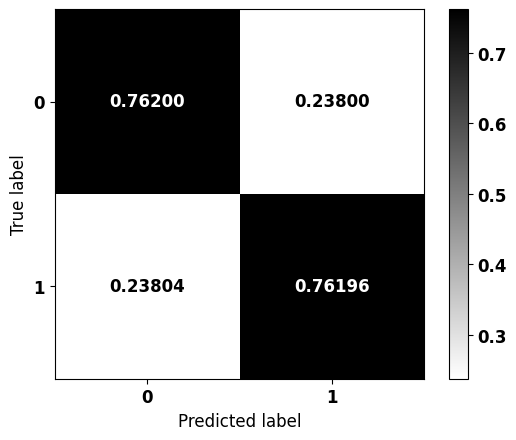


              precision    recall  f1-score   support

           0    0.72140   0.76200   0.74114      6273
           1    0.79830   0.76196   0.77971      7755

    accuracy                        0.76198     14028
   macro avg    0.75985   0.76198   0.76042     14028
weighted avg    0.76391   0.76198   0.76246     14028



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

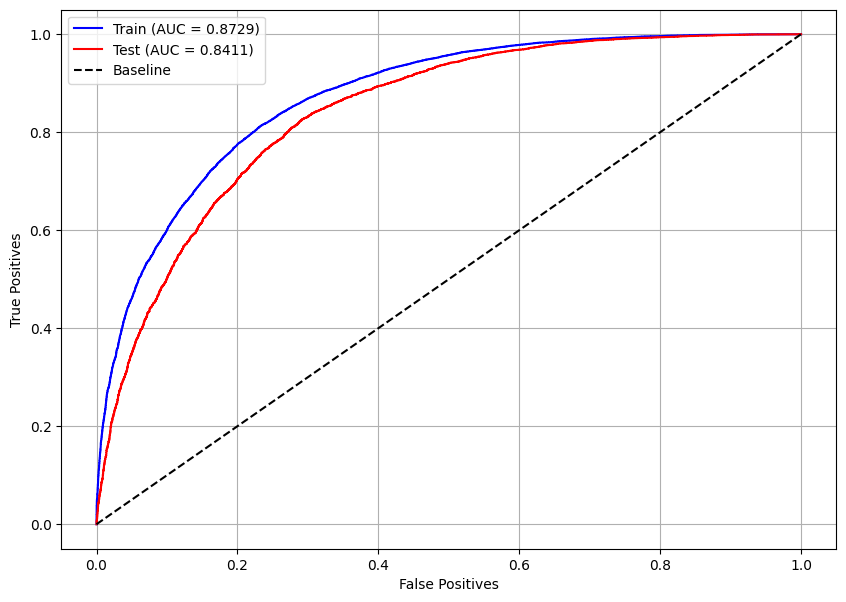

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


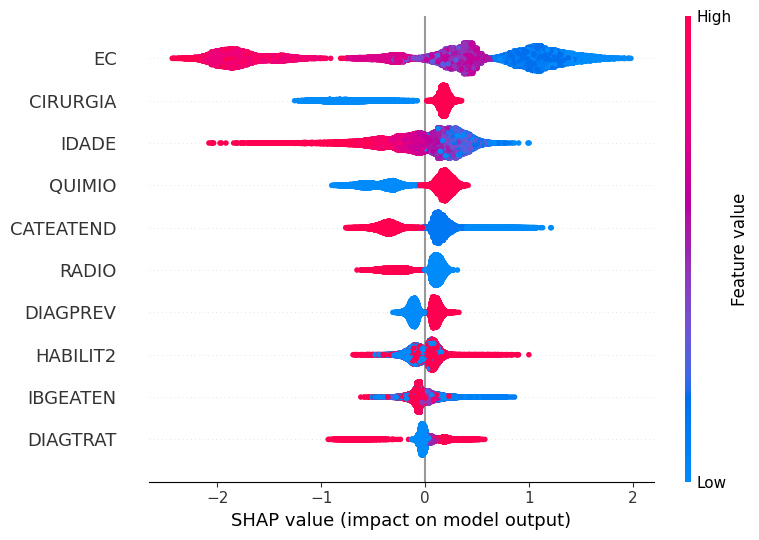

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7601, Optuna = 0.7641

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7580, Optuna = 0.7620

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1.4445, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=10, min_child_weight=1,
               n_estimators=143, random_state=7, verbose=-1)

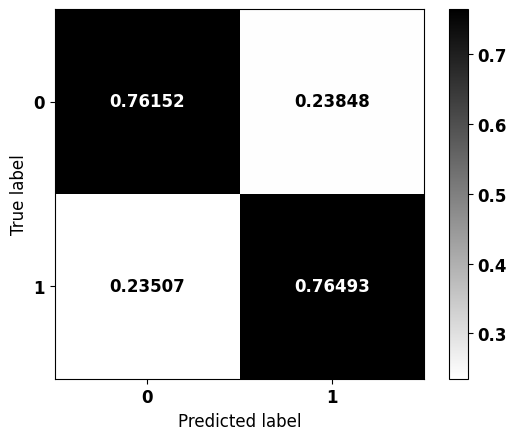


              precision    recall  f1-score   support

           0    0.72379   0.76152   0.74217      6273
           1    0.79860   0.76493   0.78140      7755

    accuracy                        0.76340     14028
   macro avg    0.76119   0.76322   0.76179     14028
weighted avg    0.76515   0.76340   0.76386     14028



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

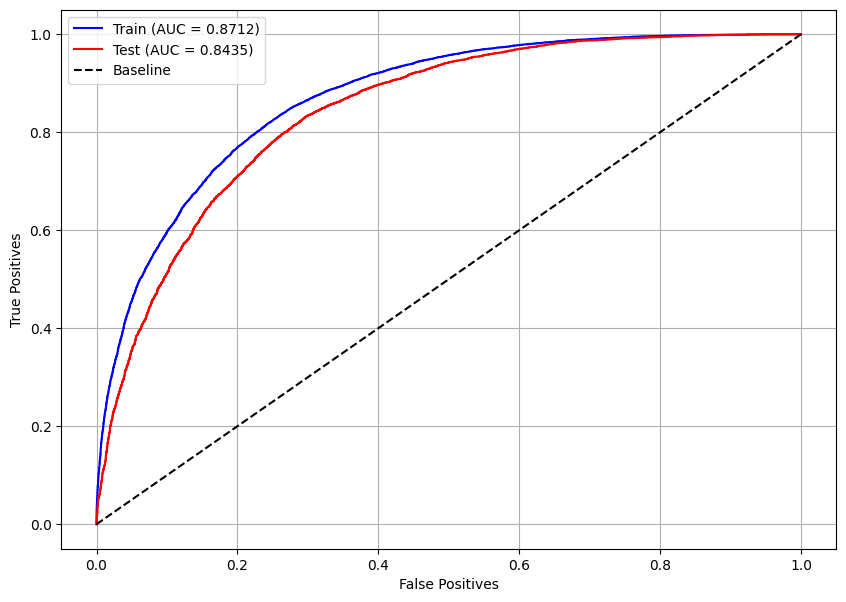

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=107, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


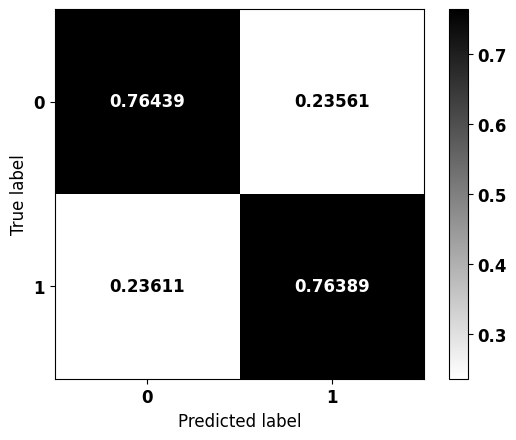


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



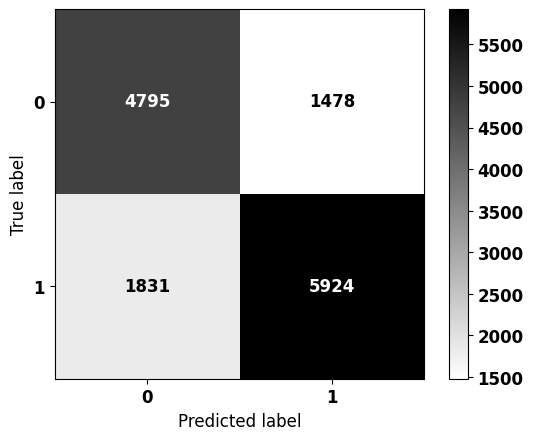


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

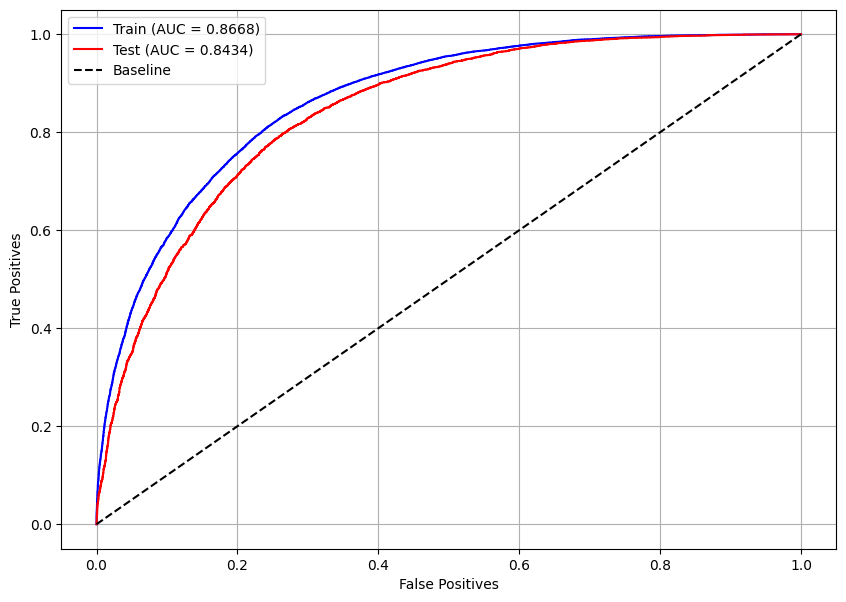

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

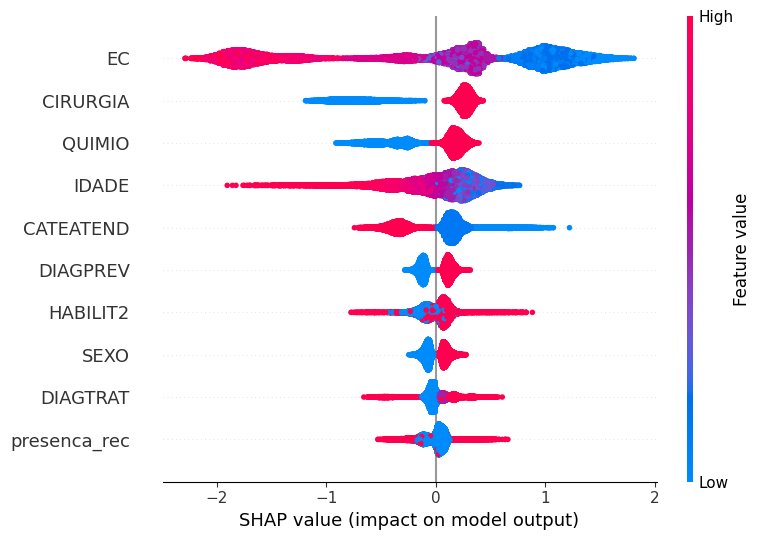

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


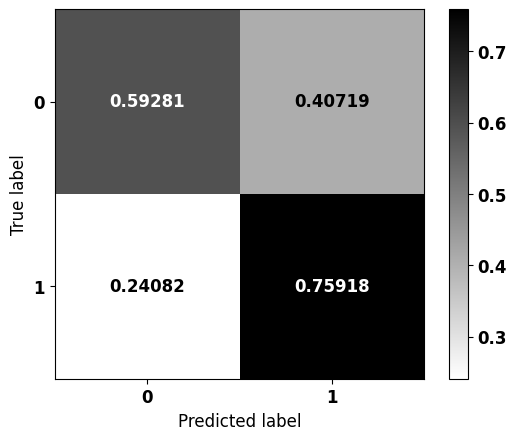


              precision    recall  f1-score   support

           0    0.78026   0.59281   0.67374      3534
           1    0.56381   0.75918   0.64707      2450

    accuracy                        0.66093      5984
   macro avg    0.67203   0.67600   0.66041      5984
weighted avg    0.69164   0.66093   0.66282      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


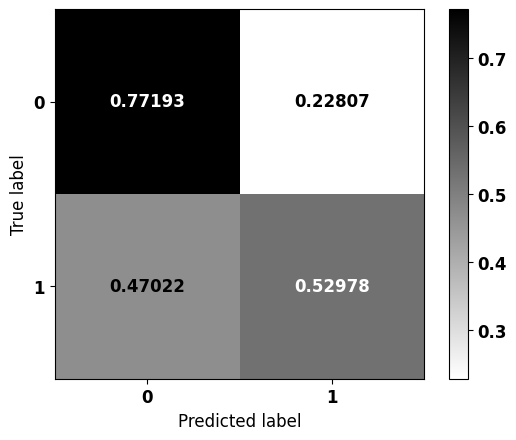


              precision    recall  f1-score   support

           0    0.82436   0.77193   0.79728       912
           1    0.44828   0.52978   0.48563       319

    accuracy                        0.70918      1231
   macro avg    0.63632   0.65086   0.64146      1231
weighted avg    0.72690   0.70918   0.71652      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


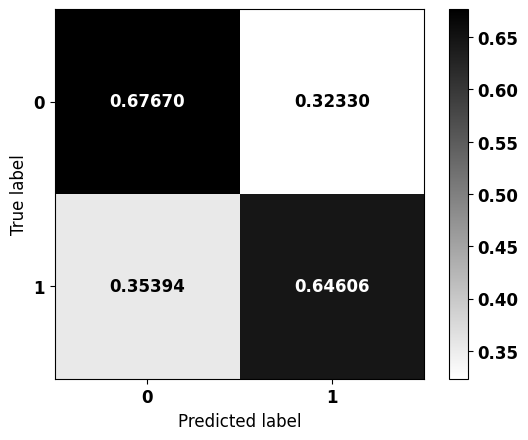


              precision    recall  f1-score   support

           0    0.92492   0.67670   0.78158      3022
           1    0.23672   0.64606   0.34648       469

    accuracy                        0.67259      3491
   macro avg    0.58082   0.66138   0.56403      3491
weighted avg    0.83246   0.67259   0.72313      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


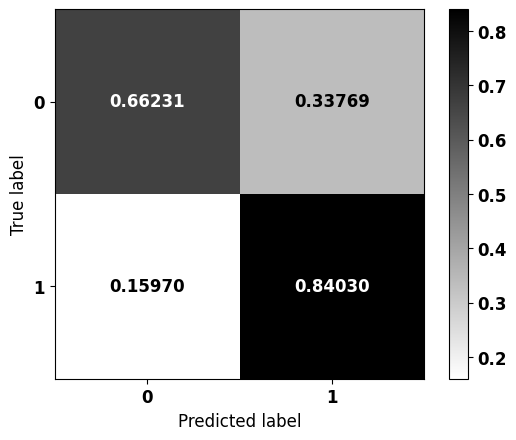


              precision    recall  f1-score   support

           0    0.91721   0.66231   0.76920      5052
           1    0.48225   0.84030   0.61280      1891

    accuracy                        0.71079      6943
   macro avg    0.69973   0.75130   0.69100      6943
weighted avg    0.79875   0.71079   0.72660      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


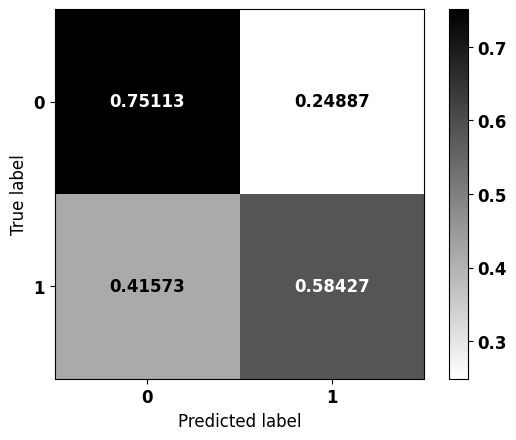


              precision    recall  f1-score   support

           0    0.69167   0.75113   0.72017       221
           1    0.65409   0.58427   0.61721       178

    accuracy                        0.67669       399
   macro avg    0.67288   0.66770   0.66869       399
weighted avg    0.67490   0.67669   0.67424       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Anus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'anus_teste' DataFrame
saida_anus = anus_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
anus_teste = anus_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'anus_teste' DataFrame
print(anus_teste.shape)
anus_teste.head(3)

(569, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
75,0.105488,0.665539,0.761284,-0.700979,0.764826,-0.779456,-0.598327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.178005,0.785994,1.787700,0.831801,0.614410,-1.212519,-0.815049,0.931458,-0.544176
234,-0.362425,-1.502542,0.791227,-0.700979,-1.307488,-0.779456,-0.598327,0.538748,0.528782,-0.059391,...,-0.306559,-0.178005,-0.532530,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176
289,-0.128468,0.665539,0.791227,-0.700979,-1.307488,1.682970,1.671327,-1.856155,0.528782,-0.059391,...,-0.306559,-0.271672,-0.720890,-0.756212,-0.555482,0.644067,0.457998,1.168256,0.931458,-0.544176


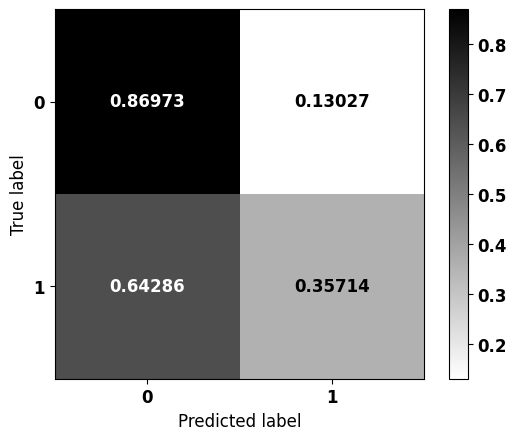


              precision    recall  f1-score   support

           0    0.53412   0.86973   0.66181       261
           1    0.76389   0.35714   0.48673       308

    accuracy                        0.59227       569
   macro avg    0.64900   0.61344   0.57427       569
weighted avg    0.65849   0.59227   0.56704       569



In [ ]:
# Plot the confusion matrix for the best model on the 'anus_teste' dataset
plot_confusion_matrix(best, anus_teste, saida_anus)

# **Anus**

In [ ]:
# Missing values
df_anus.isna().sum().sort_values(ascending=False).head(6)

,0
IDADE,0
SEXO,0
IBGE,0
CATEATEND,0
DIAGPREV,0
TOPO,0


In [ ]:
# Compute the correlation matrix for numerical features in the anus cancer dataset
corr_matrix = df_anus.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

,sobrevida_ano3
sobrevida_ano3,1.000000
sobrevida_ano5,0.698795
obito_geral,0.679074
sobrevida_ano1,0.547963
TRATCONS,0.188534
DIAGTRAT,0.186556
QUIMIO,0.180924
NENHUM,0.177381
SEXO,0.137478
RADIO,0.125399


In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_anus.sobrevida_ano3.value_counts()

,count
sobrevida_ano3,
1,1233
0,1043


## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_anus,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (1707, 23), X_test = (569, 23)
y_train = (1707,), y_test = (569,)


In [ ]:
# Training dataset for Anus Cancer

# Create a DataFrame for training data with selected features
anus_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Ânus' for Anus Cancer)
anus_treino['TOPOGRUP'] = 'Ânus'

# Add the target variable (survival after 3 years) to the training dataset
anus_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Anus Cancer

# Create a DataFrame for testing data with selected features
anus_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Ânus' for Anus Cancer)
anus_teste['TOPOGRUP'] = 'Ânus'

# Add the target variable (survival after 3 years) to the testing dataset
anus_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

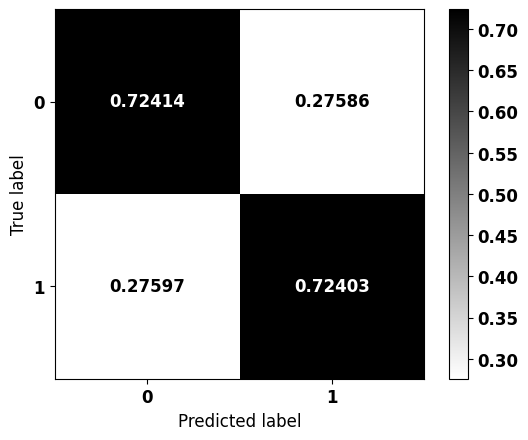


              precision    recall  f1-score   support

           0    0.68978   0.72414   0.70654       261
           1    0.75593   0.72403   0.73964       308

    accuracy                        0.72408       569
   macro avg    0.72286   0.72408   0.72309       569
weighted avg    0.72559   0.72408   0.72446       569



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=2,            # Set maximum tree depth to 4
                    scale_pos_weight=0.745, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

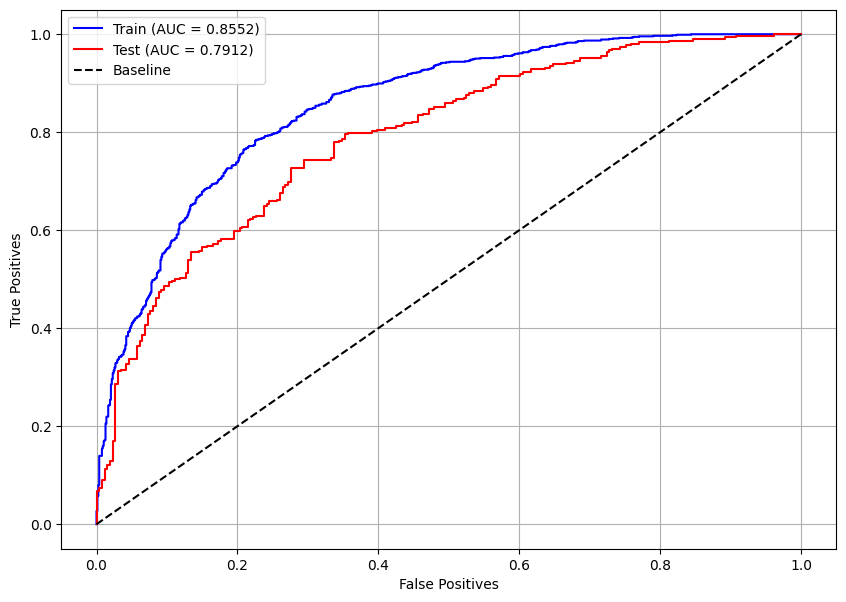

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

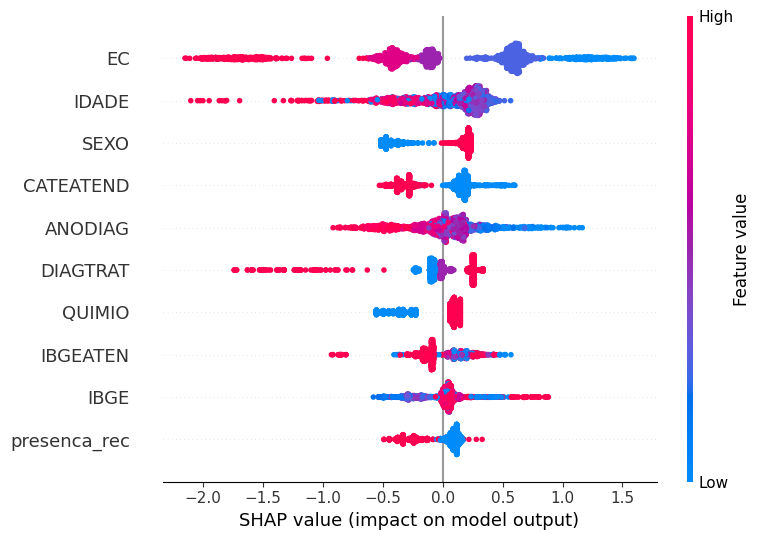

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 56,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.3,
 'min_child_weight': 6,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.72, 0.75, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

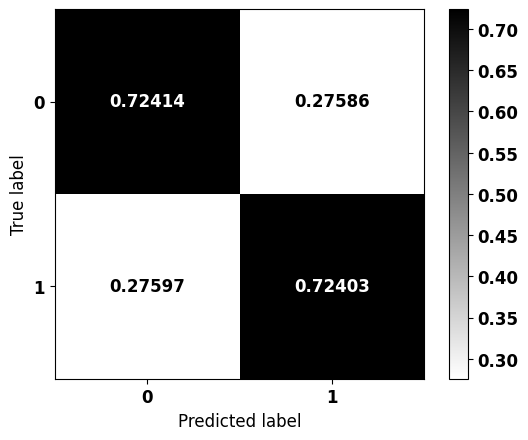


              precision    recall  f1-score   support

           0    0.68978   0.72414   0.70654       261
           1    0.75593   0.72403   0.73964       308

    accuracy                        0.72408       569
   macro avg    0.72286   0.72408   0.72309       569
weighted avg    0.72559   0.72408   0.72446       569



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.721  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

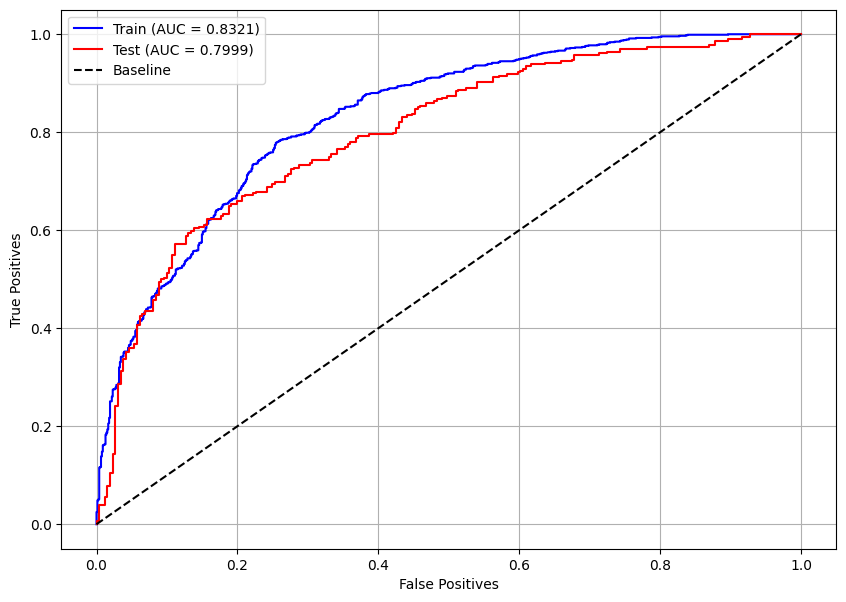

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 80,
 'max_depth': 3,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.0,
 'min_child_weight': 7,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.72, 0.75, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

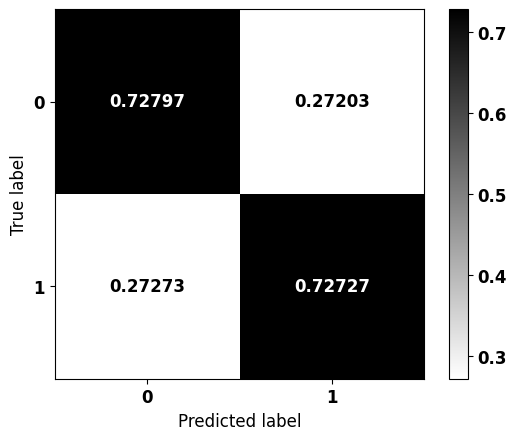


              precision    recall  f1-score   support

           0    0.69343   0.72797   0.71028       261
           1    0.75932   0.72727   0.74295       308

    accuracy                        0.72759       569
   macro avg    0.72638   0.72762   0.72662       569
weighted avg    0.72910   0.72759   0.72797       569



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.7322  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

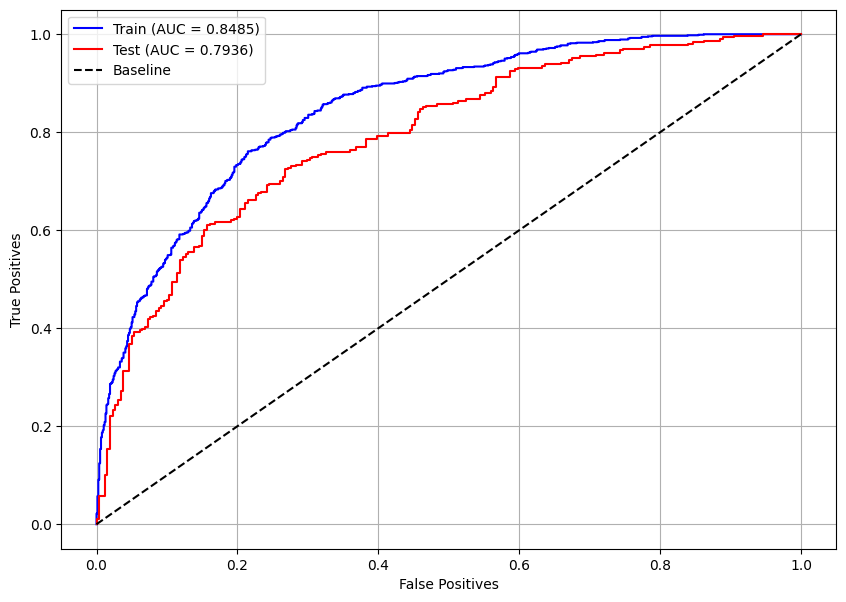

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 87,
 'max_depth': 3,
 'learning_rate': 0.1,
 'gamma': 0.2,
 'min_child_weight': 4,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.72, 0.76, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

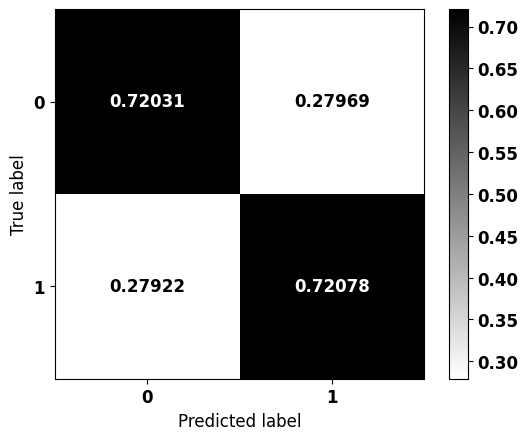


              precision    recall  f1-score   support

           0    0.68613   0.72031   0.70280       261
           1    0.75254   0.72078   0.73632       308

    accuracy                        0.72056       569
   macro avg    0.71934   0.72054   0.71956       569
weighted avg    0.72208   0.72056   0.72095       569



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.7423  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

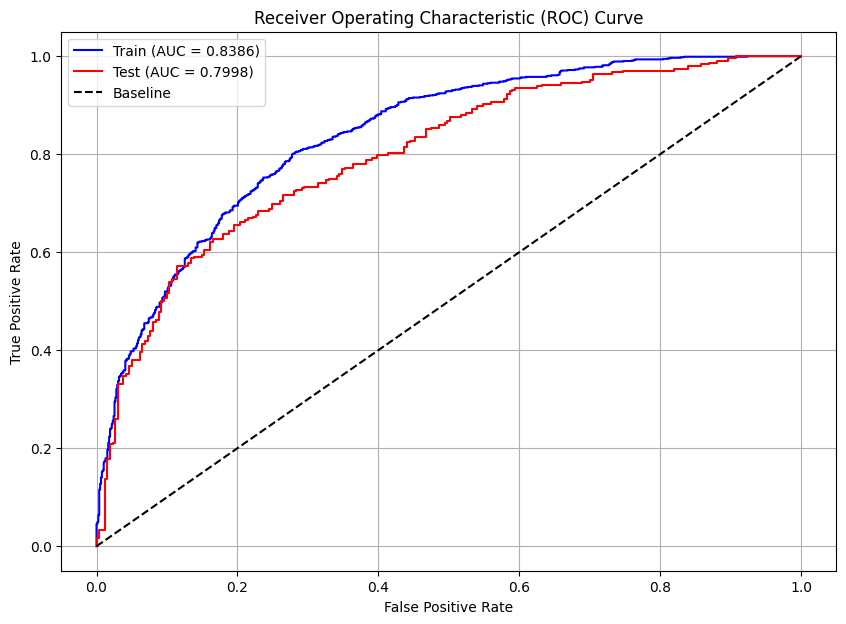

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=80, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


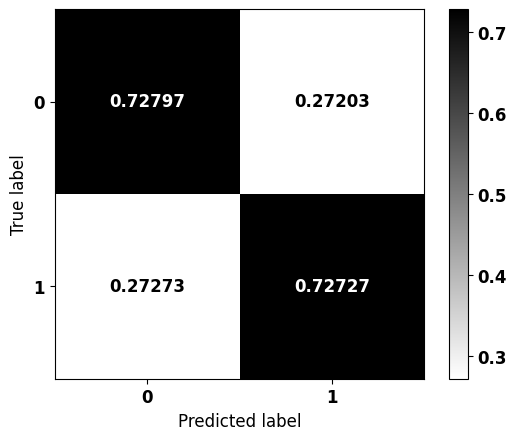


              precision    recall  f1-score   support

           0    0.69343   0.72797   0.71028       261
           1    0.75932   0.72727   0.74295       308

    accuracy                        0.72759       569
   macro avg    0.72638   0.72762   0.72662       569
weighted avg    0.72910   0.72759   0.72797       569



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

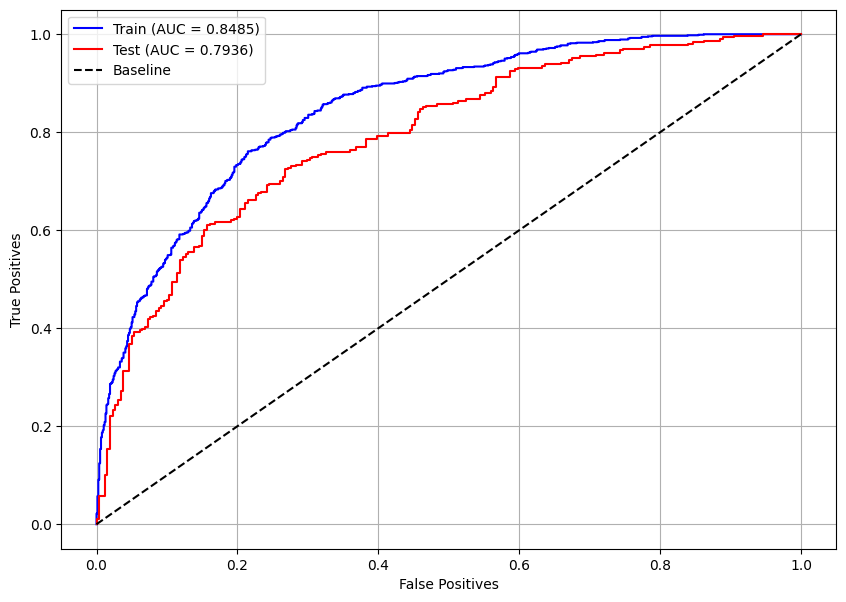

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

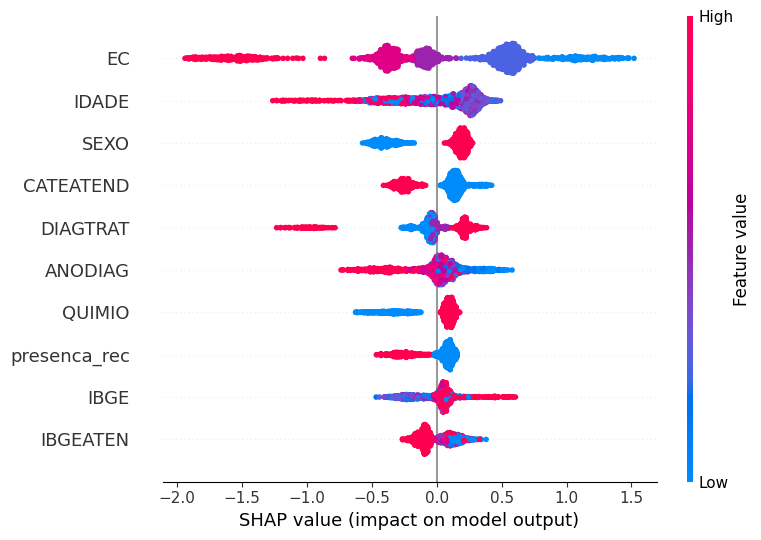

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

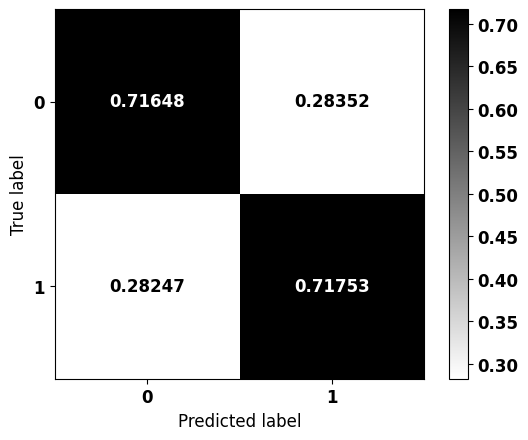


              precision    recall  f1-score   support

           0    0.68248   0.71648   0.69907       261
           1    0.74915   0.71753   0.73300       308

    accuracy                        0.71705       569
   macro avg    0.71582   0.71700   0.71603       569
weighted avg    0.71857   0.71705   0.71744       569



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=3,                  # Set maximum tree depth to 3
                      class_weight={0:1.418, 1:1},  # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

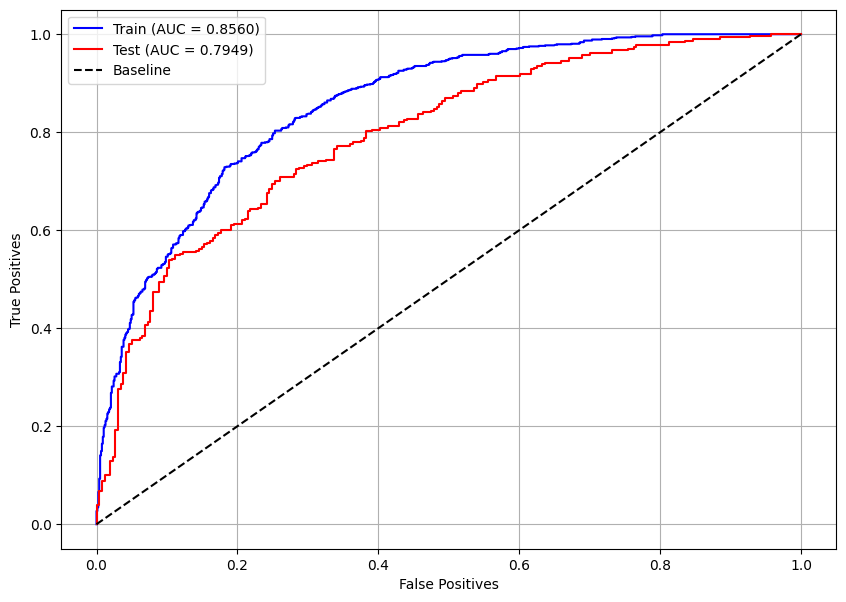

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

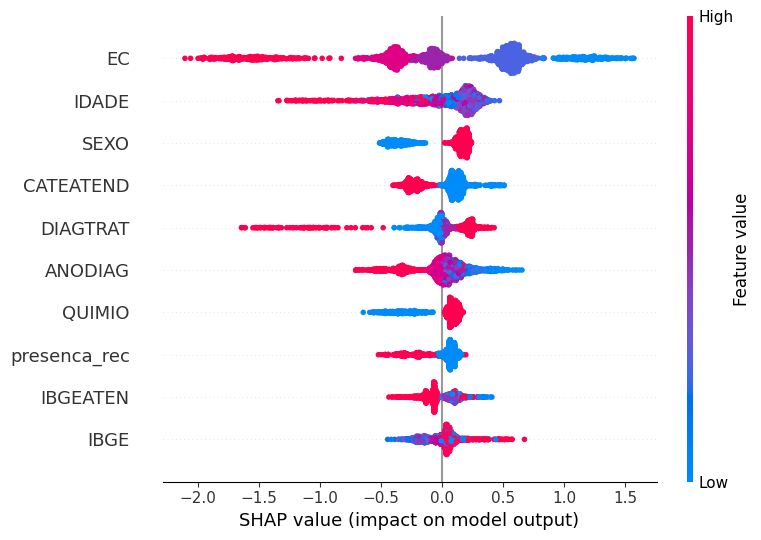

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 100)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 2, 3)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 60,
 'max_depth': 3,
 'learning_rate': 0.18,
 'min_child_weight': 7,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.415, 1.45, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

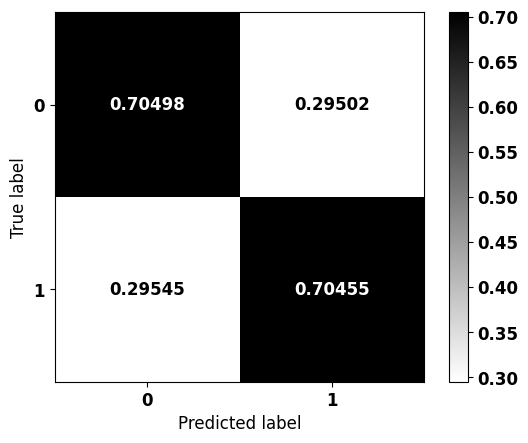


              precision    recall  f1-score   support

           0    0.66909   0.70498   0.68657       261
           1    0.73810   0.70455   0.72093       308

    accuracy                        0.70475       569
   macro avg    0.70359   0.70476   0.70375       569
weighted avg    0.70644   0.70475   0.70517       569



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.421, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

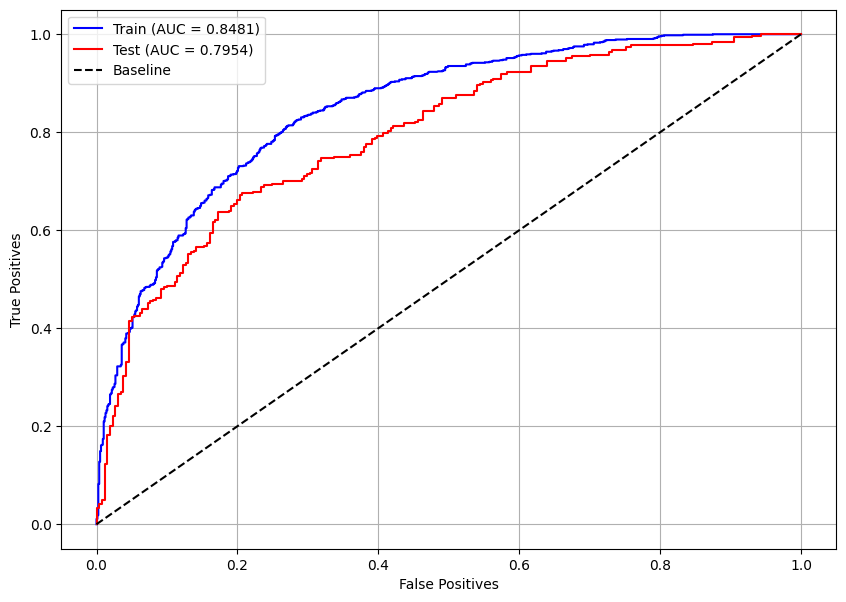

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.35, 1.43, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.379, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 97,
 'max_depth': 2,
 'learning_rate': 0.15000000000000002,
 'min_child_weight': 5,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.48, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

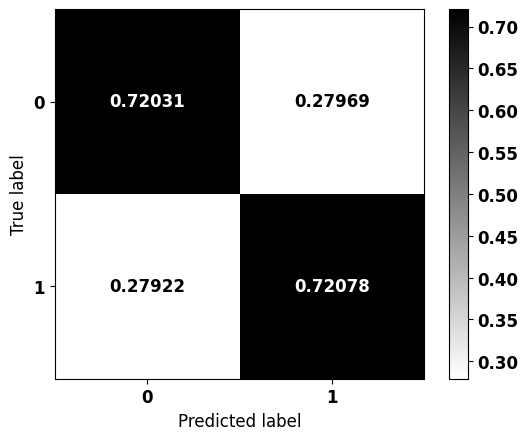


              precision    recall  f1-score   support

           0    0.68613   0.72031   0.70280       261
           1    0.75254   0.72078   0.73632       308

    accuracy                        0.72056       569
   macro avg    0.71934   0.72054   0.71956       569
weighted avg    0.72208   0.72056   0.72095       569



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.44, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

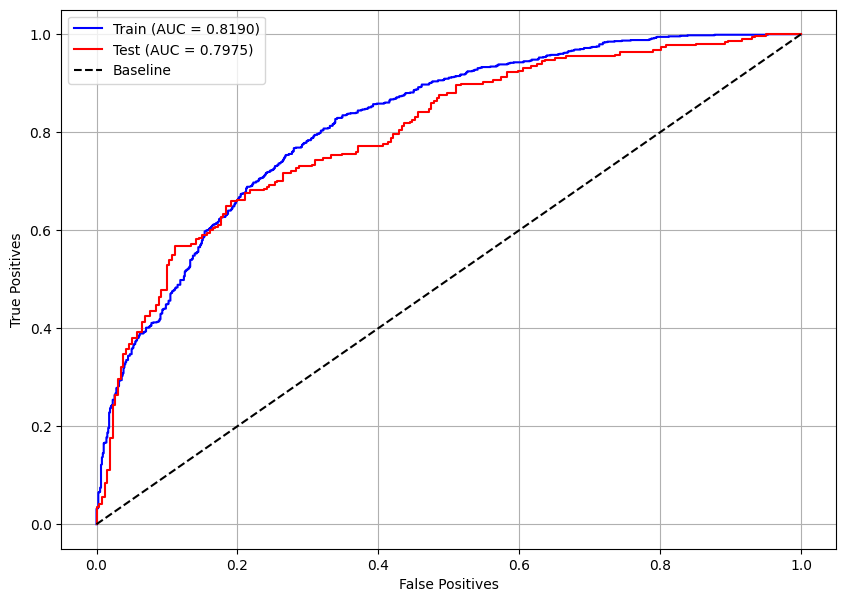

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1.379, 1: 1}, colsample_bytree=0.6,
               learning_rate=0.13, max_depth=3, min_child_weight=5,
               n_estimators=95, random_state=7, verbose=-1)


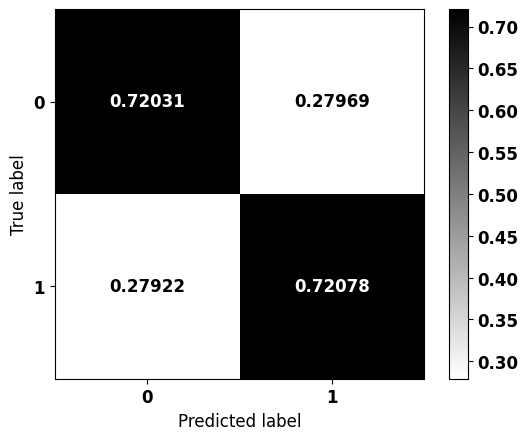


              precision    recall  f1-score   support

           0    0.68613   0.72031   0.70280       261
           1    0.75254   0.72078   0.73632       308

    accuracy                        0.72056       569
   macro avg    0.71934   0.72054   0.71956       569
weighted avg    0.72208   0.72056   0.72095       569



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

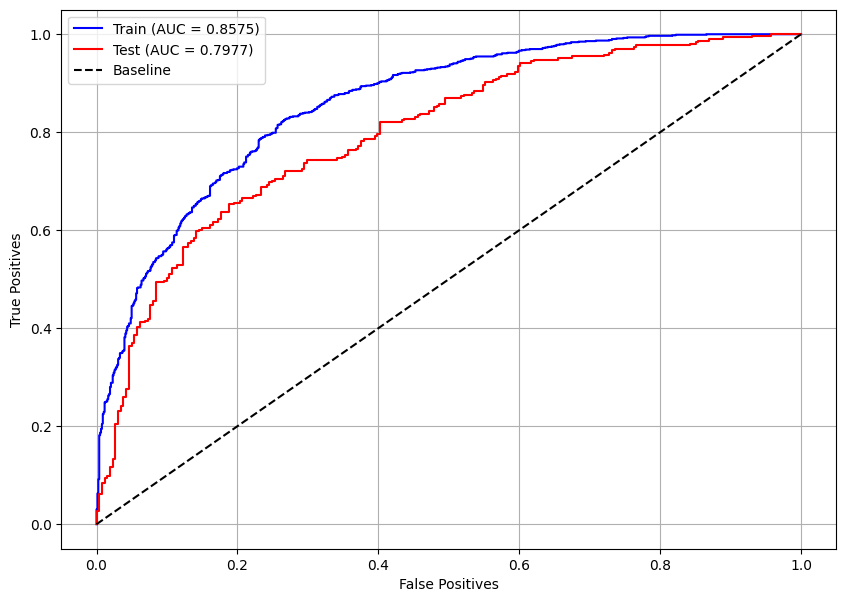

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


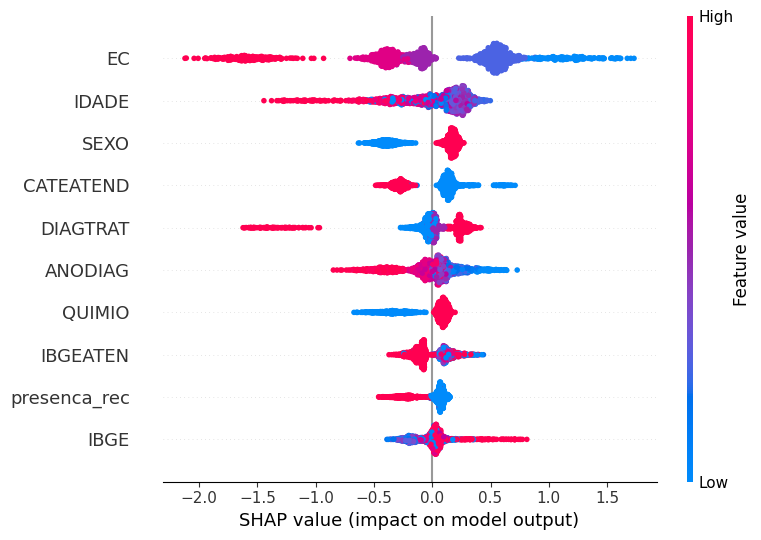

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7241, Optuna = 0.7276

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7170, Optuna = 0.7206

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1.379, 1: 1}, colsample_bytree=0.6,
               learning_rate=0.13, max_depth=3, min_child_weight=5,
               n_estimators=95, random_state=7, verbose=-1)

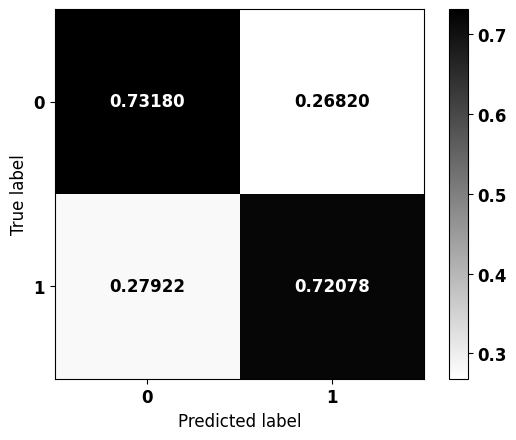


              precision    recall  f1-score   support

           0    0.68953   0.73180   0.71004       261
           1    0.76027   0.72078   0.74000       308

    accuracy                        0.72583       569
   macro avg    0.72490   0.72629   0.72502       569
weighted avg    0.72782   0.72583   0.72626       569



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

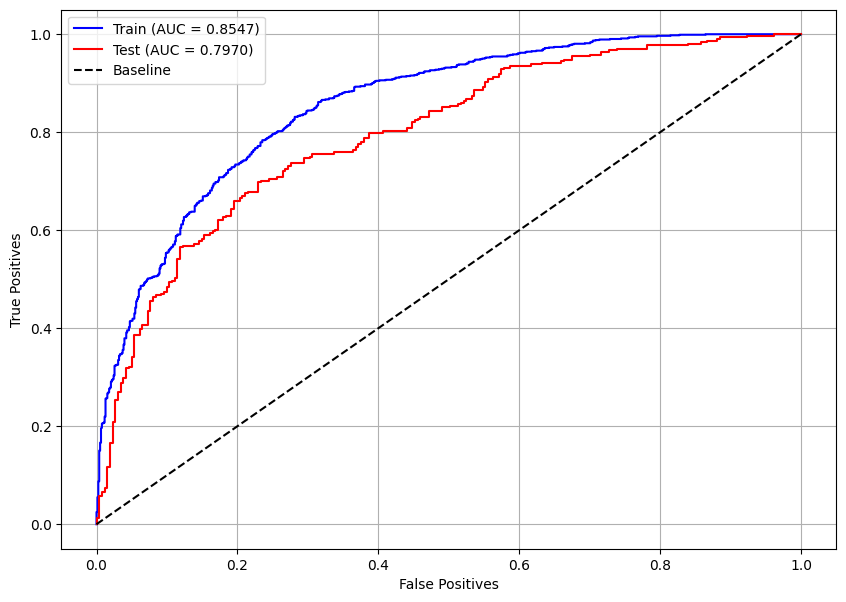

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=80, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


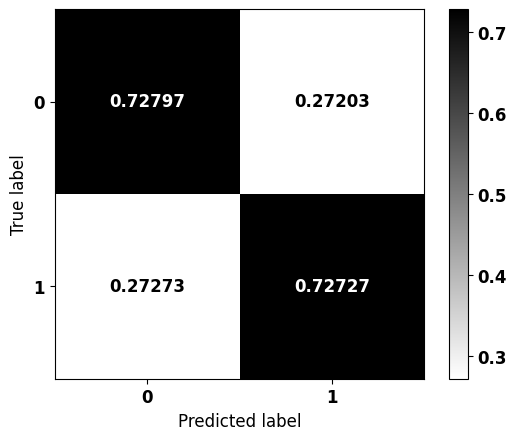


              precision    recall  f1-score   support

           0    0.69343   0.72797   0.71028       261
           1    0.75932   0.72727   0.74295       308

    accuracy                        0.72759       569
   macro avg    0.72638   0.72762   0.72662       569
weighted avg    0.72910   0.72759   0.72797       569



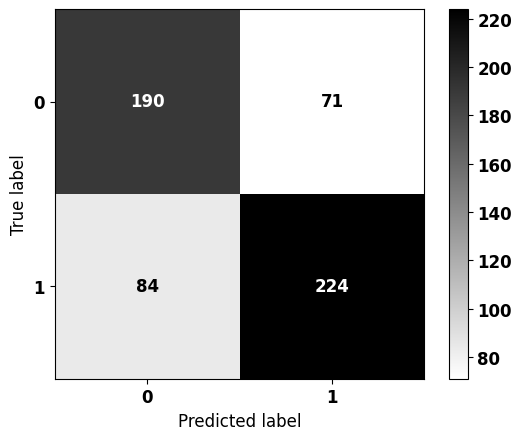


              precision    recall  f1-score   support

           0    0.69343   0.72797   0.71028       261
           1    0.75932   0.72727   0.74295       308

    accuracy                        0.72759       569
   macro avg    0.72638   0.72762   0.72662       569
weighted avg    0.72910   0.72759   0.72797       569



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

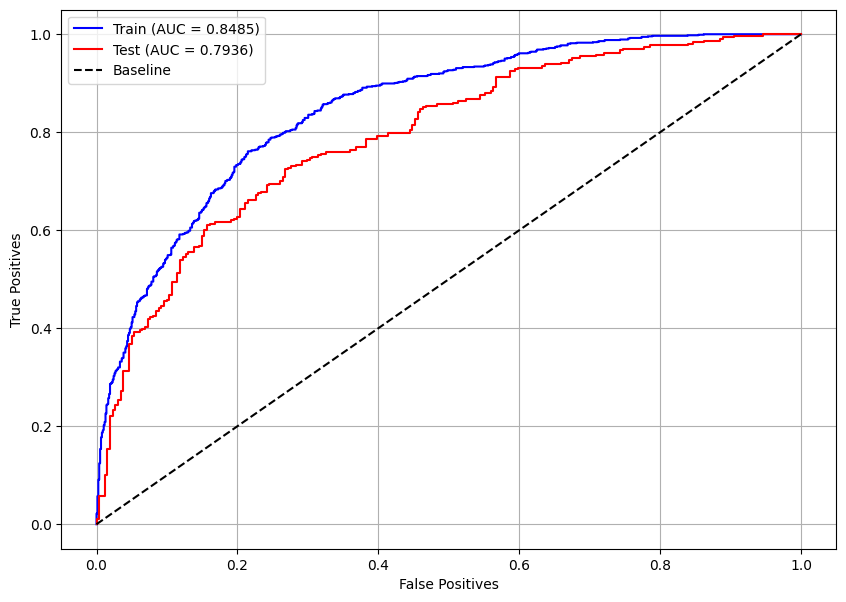

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

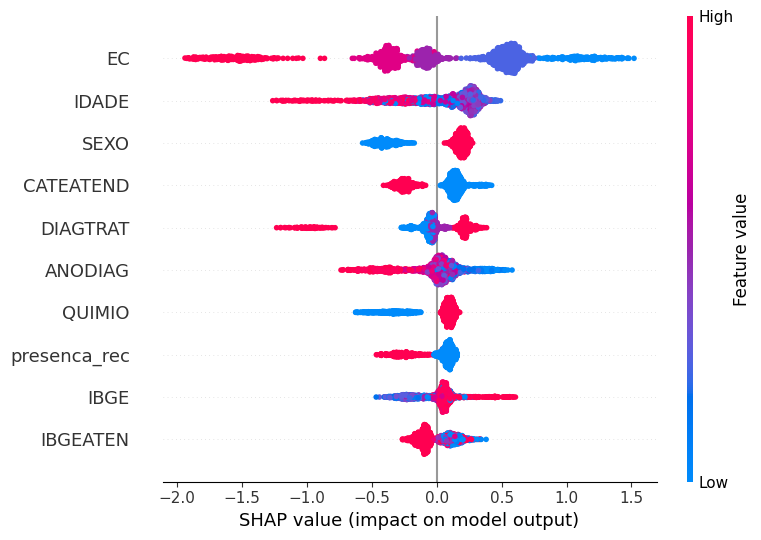

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 13aJGpxw_tAhT-44yuD-mRKjDsJcHwynU --quiet  # Download the test dataset - Digestive System

# Load the dataset
df_teste = pd.read_csv('sist_dig_teste.csv')

# Split the test data based on cancer types
boca_teste = df_teste[df_teste.TOPOGRUP.isin(['Boca'])]
oro_teste = df_teste[df_teste.TOPOGRUP.isin(['Orofaringe'])]
eso_teste = df_teste[df_teste.TOPOGRUP.isin(['Esôfago'])]
esto_teste = df_teste[df_teste.TOPOGRUP.isin(['Estômago'])]
delg_teste = df_teste[df_teste.TOPOGRUP.isin(['Delgado'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
anus_teste = df_teste[df_teste.TOPOGRUP.isin(['Ânus'])]

# Check the shapes of the resulting subsets
boca_teste.shape, oro_teste.shape, eso_teste.shape, esto_teste.shape, delg_teste.shape, colo_teste.shape, anus_teste.shape

((5984, 25),
 (1231, 25),
 (3491, 25),
 (6943, 25),
 (399, 25),
 (14028, 25),
 (569, 25))

#### **Oral Cavity**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'boca_teste' DataFrame
saida_boca = boca_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
boca_teste = boca_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'boca_teste' DataFrame
print(boca_teste.shape)
boca_teste.head(3)

(5984, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.94518,1.181669,-0.052318,...,-0.334042,-0.322567,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244
3,-0.815064,-0.486452,0.918482,-0.855087,-0.933936,0.659865,0.949520,0.94518,1.181669,-0.052318,...,-0.334042,-0.285109,0.373619,-0.949295,-0.763297,0.830259,0.464651,0.520496,1.131402,-0.471244
11,-1.233117,2.055702,0.918482,1.148151,1.070737,-0.777605,0.949520,0.94518,-0.846260,-0.052318,...,-0.334042,-0.285109,-1.240108,-0.949295,-0.763297,0.830259,0.464651,1.655234,1.131402,-0.471244


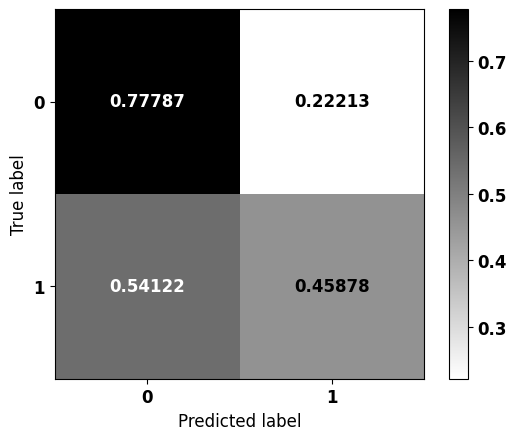


              precision    recall  f1-score   support

           0    0.67460   0.77787   0.72257      3534
           1    0.58879   0.45878   0.51571      2450

    accuracy                        0.64723      5984
   macro avg    0.63170   0.61832   0.61914      5984
weighted avg    0.63947   0.64723   0.63788      5984



In [ ]:
# Plot the confusion matrix for the best model on the 'boca_teste' dataset
plot_confusion_matrix(best, boca_teste, saida_boca)

#### **Oropharynx**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'oro_teste' DataFrame
saida_oro = oro_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
oro_teste = oro_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'oro_teste' DataFrame
print(oro_teste.shape)
oro_teste.head(3)

(1231, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
26,-0.534418,-0.344708,-0.337614,1.488571,-1.007888,-1.645473,1.888933,-1.294078,-1.27923,-0.052122,...,-0.320907,-0.380647,-0.130101,0.612913,0.220052,-0.455126,0.734556,0.554428,0.98201,2.281088
33,1.083245,-0.344708,0.889710,1.488571,-1.007888,0.920408,-0.529399,0.772751,0.78172,-0.052122,...,3.909337,-0.348394,-0.530602,-0.837603,-0.658729,0.726946,0.734556,-0.672426,0.98201,-0.438387
42,-0.635522,-0.344708,-1.265353,-0.661245,0.992174,0.920408,-0.529399,-1.294078,0.78172,-0.052122,...,-0.320907,-0.348394,0.470652,1.700800,0.659443,0.699035,-1.070534,-0.672426,-1.01832,-0.438387


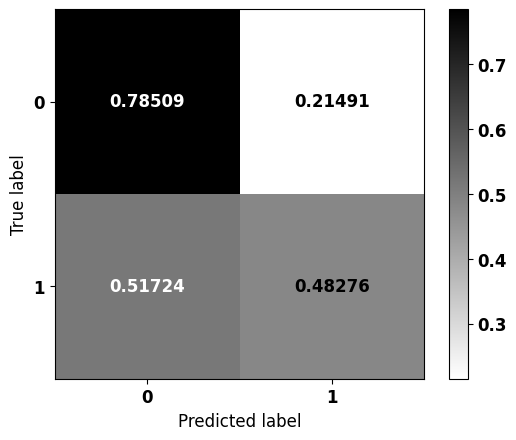


              precision    recall  f1-score   support

           0    0.81271   0.78509   0.79866       912
           1    0.44000   0.48276   0.46039       319

    accuracy                        0.70674      1231
   macro avg    0.62636   0.63392   0.62953      1231
weighted avg    0.71613   0.70674   0.71100      1231



In [ ]:
# Plot the confusion matrix for the best model on the 'oro_teste' dataset
plot_confusion_matrix(best, oro_teste, saida_oro)

#### **Esophagus**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'eso_teste' DataFrame
saida_eso = eso_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
eso_teste = eso_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'eso_teste' DataFrame
print(eso_teste.shape)
eso_teste.head(3)

(3491, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
1,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,-0.273283,2.343552,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978
28,-0.360663,-0.438574,0.140801,-0.867646,0.756823,0.679339,1.833217,0.974350,0.848396,-0.053606,...,-0.273283,-0.449095,0.709429,-0.049760,-0.089569,-0.551753,0.488275,-0.482241,-0.899050,-0.399978
34,-0.736063,-0.438574,1.051124,1.135560,0.756823,-0.996678,-0.545489,-1.026325,0.848396,-0.053606,...,-0.273283,-0.449095,-0.584277,0.130138,1.311511,-1.428643,0.488275,-0.482241,-0.899050,-0.399978


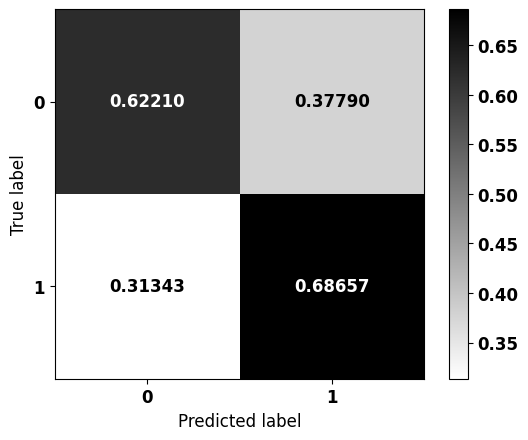


              precision    recall  f1-score   support

           0    0.92748   0.62210   0.74470      3022
           1    0.21995   0.68657   0.33316       469

    accuracy                        0.63076      3491
   macro avg    0.57371   0.65434   0.53893      3491
weighted avg    0.83243   0.63076   0.68941      3491



In [ ]:
# Plot the confusion matrix for the best model on the 'eso_teste' dataset
plot_confusion_matrix(best, eso_teste, saida_eso)

#### **Stomach**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'esto_teste' DataFrame
saida_esto = esto_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
esto_teste = esto_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'esto_teste' DataFrame
print(esto_teste.shape)
esto_teste.head(3)

(6943, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
5,-1.290095,-0.729124,0.889548,1.146869,0.847250,-1.351477,0.832039,2.222317,0.950931,-0.053751,...,-0.279516,-0.425355,-1.337887,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
16,2.334188,1.371508,0.889548,1.146869,-1.180289,0.830091,-1.201867,-0.449981,-1.051601,-0.053751,...,-0.279516,2.448072,-1.706821,-0.889363,-0.707712,0.79631,0.372503,-0.606817,1.046955,-0.388153
19,-0.750308,-0.729124,0.889548,-0.847750,0.847250,0.830091,-1.201867,-0.449981,0.950931,-0.053751,...,-0.279516,-0.425355,1.244656,-0.889363,-0.707712,0.79631,0.372503,1.600339,1.046955,-0.388153


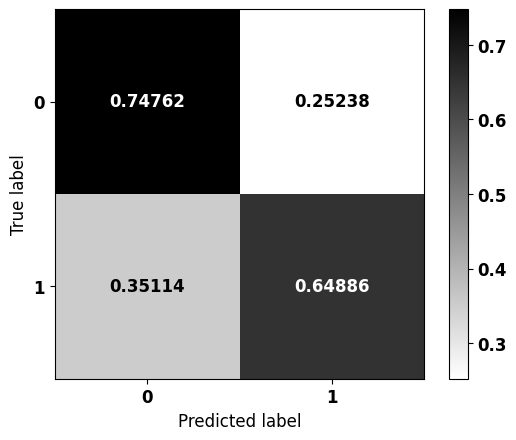


              precision    recall  f1-score   support

           0    0.85048   0.74762   0.79574      5052
           1    0.49041   0.64886   0.55862      1891

    accuracy                        0.72073      6943
   macro avg    0.67045   0.69824   0.67718      6943
weighted avg    0.75241   0.72073   0.73116      6943



In [ ]:
# Plot the confusion matrix for the best model on the 'esto_teste' dataset
plot_confusion_matrix(best, esto_teste, saida_esto)

#### **Small Intestine**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'delg_teste' DataFrame
saida_delg = delg_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
delg_teste = delg_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'delg_teste' DataFrame
print(delg_teste.shape)
delg_teste.head(3)

(399, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
13,0.528909,1.02457,0.751040,-0.601605,1.305228,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,-0.327361,-0.759337,-0.583187,0.614753,0.284737,1.066283,0.796710,-0.371612
120,0.073544,1.02457,-0.913127,-0.601605,-0.766150,-1.447257,0.651394,-0.276725,-0.829369,-0.146176,...,-0.446680,-0.376182,1.293340,-0.759337,-0.818549,0.614753,0.284737,1.066283,-1.255162,-0.371612
254,0.528909,-0.97602,0.751040,-0.601605,-0.766150,1.092349,-1.535168,-0.276725,-0.829369,-0.146176,...,2.684012,2.778133,1.293340,-0.759337,-0.583187,0.614753,0.284737,0.055809,0.796710,-0.371612


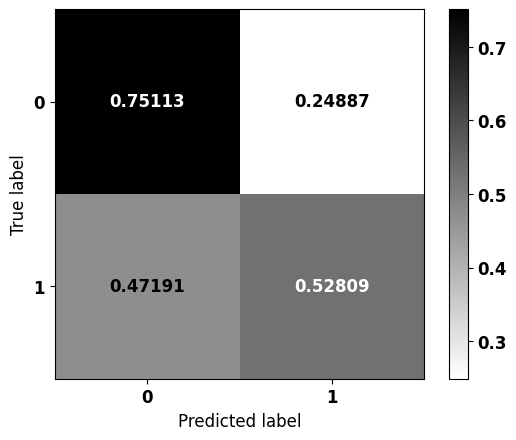


              precision    recall  f1-score   support

           0    0.66400   0.75113   0.70488       221
           1    0.63087   0.52809   0.57492       178

    accuracy                        0.65163       399
   macro avg    0.64744   0.63961   0.63990       399
weighted avg    0.64922   0.65163   0.64691       399



In [ ]:
# Plot the confusion matrix for the best model on the 'delg_teste' dataset
plot_confusion_matrix(best, delg_teste, saida_delg)

#### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073
4,1.280847,-0.972134,0.875829,-0.714301,0.958036,-0.873817,0.600930,-0.567847,0.737288,-0.07854,...,-0.325938,-0.242469,1.505568,-0.933152,-0.753735,0.794255,0.396181,-0.870779,0.964441,2.104938
6,0.366829,-0.972134,0.875829,-0.714301,0.958036,0.503309,-1.664088,1.761039,-1.356322,-0.07854,...,-0.325938,-0.143566,0.743249,-0.933152,-0.753735,0.794255,0.396181,0.154944,0.964441,-0.475073


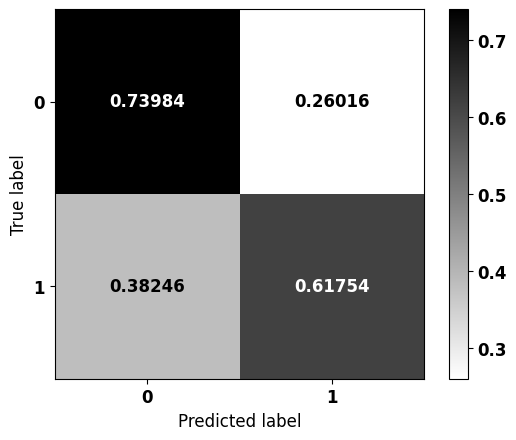


              precision    recall  f1-score   support

           0    0.61010   0.73984   0.66873      6273
           1    0.74583   0.61754   0.67565      7755

    accuracy                        0.67223     14028
   macro avg    0.67796   0.67869   0.67219     14028
weighted avg    0.68514   0.67223   0.67256     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

# **Train and Test DataFrame**

**Train**

In [ ]:
from sklearn.utils import shuffle

# Combine training datasets for different digestive system cancers into a single DataFrame
df_sist_dig_treino = pd.concat([boca_treino, oro_treino, eso_treino, esto_treino,
                                delg_treino, colo_treino, anus_treino],
                               ignore_index=True)

# Shuffle the combined dataset to randomize the order of samples
df_sist_dig_treino = shuffle(df_sist_dig_treino, random_state=seed)

# Display the first three rows of the shuffled dataset
df_sist_dig_treino.head(3)

,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,TOPOGRUP,sobrevida_3anos
15893,-0.313399,-0.486452,0.889193,-0.855087,-0.933936,-0.777605,-1.053163,-1.057999,-0.846260,-0.052318,...,-0.702199,1.584652,0.669012,0.801956,-1.240717,0.520496,1.131402,2.122043,Boca,1
60372,-0.775695,1.028664,0.875829,1.343451,-1.043802,1.054160,0.600930,-0.567847,-1.356322,-0.078540,...,-0.209650,-0.933152,-0.753735,0.794255,-0.968850,0.154944,0.964441,-0.475073,Colorretal,0
3262,-0.815064,-0.486452,0.918482,-0.855087,1.070737,1.139022,-1.053163,0.945180,1.181669,-0.052318,...,0.732225,-0.949295,-0.763297,0.830259,0.464651,-1.748979,1.131402,-0.471244,Boca,0


In [ ]:
# Display the shape (number of rows and columns) of the training dataset for digestive system cancers
df_sist_dig_treino.shape

(97924, 25)

In [ ]:
# Retrieve the unique values of the 'TOPOGRUP' column to verify the cancer types present in the dataset
df_sist_dig_treino.TOPOGRUP.unique()

array(['Boca', 'Colorretal', 'Ânus', 'Estômago', 'Orofaringe', 'Esôfago',
       'Delgado'], dtype=object)

In [ ]:
# Save the processed training dataset to a CSV file with UTF-8 encoding, excluding the index column
df_sist_dig_treino.to_csv('sist_dig_treino.csv', index=False, encoding='UTF-8')

**Test**

In [ ]:
# Combine test datasets for different digestive system cancers into a single DataFrame
df_sist_dig_teste = pd.concat([boca_teste, oro_teste, eso_teste, esto_teste,
                               delg_teste, colo_teste, anus_teste],
                               ignore_index=True)

# Shuffle the combined dataset to randomize the order of samples
df_sist_dig_teste = shuffle(df_sist_dig_teste, random_state=seed)

# Display the first three rows of the shuffled dataset
df_sist_dig_teste.head(3)

,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,TOPOGRUP,sobrevida_3anos
27466,0.214492,1.028664,0.916336,1.343451,0.958036,1.054160,-1.664088,-0.567847,0.737288,-0.078540,...,-1.353129,-0.392930,-0.518012,0.692936,-0.968850,-0.870779,-1.036870,-0.475073,Colorretal,0
8699,0.765536,-0.438574,0.929651,-0.867646,0.756823,0.008932,-0.545489,-1.026325,-1.178694,-0.053606,...,1.263874,-0.949246,-0.790110,0.836351,-1.175867,-1.674465,1.112286,-0.399978,Esôfago,0
1289,0.773540,-0.486452,0.545758,1.148151,1.070737,-0.298449,-1.053163,0.945180,1.181669,-0.052318,...,-1.598714,0.679671,1.146449,-0.486755,-1.240717,-0.614241,-0.883859,-0.471244,Boca,1


In [ ]:
# Display the shape (number of rows and columns) of the test dataset for digestive system cancers
df_sist_dig_teste.shape

(32645, 25)

In [ ]:
# Retrieve the unique values of the 'TOPOGRUP' column to verify the cancer types present in the dataset
df_sist_dig_teste.TOPOGRUP.unique()

array(['Colorretal', 'Esôfago', 'Boca', 'Estômago', 'Delgado',
       'Orofaringe', 'Ânus'], dtype=object)

In [ ]:
# Save the processed test dataset to a CSV file with UTF-8 encoding, excluding the index column
df_sist_dig_teste.to_csv('sist_dig_teste.csv', index=False, encoding='UTF-8')